In [1]:
%load_ext kedro.ipython
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from scipy import stats
from scipy.stats import mstats
from scipy.stats import boxcox

from sklearn import metrics

from sklearn.decomposition import FastICA
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor, HistGradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor, RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.feature_selection import SelectKBest, f_regression,SelectPercentile
from sklearn.impute import SimpleImputer,KNNImputer
from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import ElasticNetCV,RidgeCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score,classification_report, confusion_matrix, make_scorer, f1_score,log_loss
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler,StandardScaler,PowerTransformer,PolynomialFeatures,MaxAbsScaler,RobustScaler,Normalizer
from sklearn.svm import LinearSVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.utils import resample
from sklearn.utils.class_weight import compute_class_weight

from tpot import TPOTClassifier, TPOTRegressor
from tpot.builtins import ZeroCount

from xgboost import XGBClassifier,XGBRegressor

scaler = StandardScaler()
minmax = MinMaxScaler()
pt = PowerTransformer(method='yeo-johnson')
pd.options.display.float_format = '{:.2f}'.format

The kedro.ipython extension is already loaded. To reload it, use:
  %reload_ext kedro.ipython


In [36]:
def multicolumn_IQR(dataframe:pd.DataFrame) -> pd.DataFrame:
    """
    This function does the following:

    1. Copies the ID, age, sex and Income columns
    2. Calculates the IQR for each column
    3. Filter out the outliers for the current column only
    4. Merge filtered column back into a DataFrame, using an 'ID' column

    Args:
        dataframe (pd.DataFrame): DataFrame to perform IQR

    Returns:
        pd.DataFrame: DataFrame with outliers removed
    """
    dato = pd.DataFrame()
    for columna in dataframe.columns:
        Q1 = dataframe[columna].quantile(0.25)
        Q3 = dataframe[columna].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # Filter out the outliers for the current column only
        col_limpia = dataframe[~((dataframe[columna] < lower_bound) | (dataframe[columna] > upper_bound))][[columna]]
        # Merge filtered column back into the 'dato' DataFrame on the 'ID' column
        dato[columna] = col_limpia
    return dato

In [40]:
def multicolumn_IQR_dropna(dataframe:pd.DataFrame) -> pd.DataFrame:
    """
    This function does the following:

    1. Copies the ID, age, sex and Income columns
    2. Calculates the IQR for each column
    3. Filter out the outliers for the current column only
    4. Merge filtered column back into a DataFrame, using an 'ID' column

    Args:
        dataframe (pd.DataFrame): DataFrame to perform IQR

    Returns:
        pd.DataFrame: DataFrame with outliers removed
    """
    dato = pd.DataFrame()
    for columna in dataframe.columns:
        Q1 = dataframe[columna].quantile(0.25)
        Q3 = dataframe[columna].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # Filter out the outliers for the current column only
        col_limpia = dataframe[~((dataframe[columna] < lower_bound) | (dataframe[columna] > upper_bound))][[columna]]
        # Merge filtered column back into the 'dato' DataFrame on the 'ID' column
        dato[columna] = col_limpia
    dato = dato.dropna()
    return dato

In [41]:
selected_features = ['Num_CC', 'National', 'International', 'Num_Acc']
df = pd.DataFrame(client_data[selected_features])
df_iqr = multicolumn_IQR(df)
knn_imputer = KNNImputer(n_neighbors=10, weights='uniform')
imputed = pd.DataFrame(knn_imputer.fit_transform(df_iqr), columns=df_iqr.columns)
quantile = QuantileTransformer(output_distribution='normal')
quantile.fit(imputed)
df_quantile = pd.DataFrame(quantile.transform(imputed), columns=imputed.columns)
final = multicolumn_IQR_dropna(transformed_data['QuantileTransformer'])

final

,Num_CC,National,International,Num_Acc
0,5.20,-0.04,0.38,-5.20
1,-5.20,-0.08,0.15,-5.20
2,0.51,0.62,0.56,-5.20
4,5.20,1.89,1.38,0.88
5,0.51,0.60,-0.17,-5.20
...,...,...,...,...
48659,5.20,0.21,-0.32,0.88
48660,-5.20,0.97,-0.80,-5.20
48661,0.51,0.33,0.61,-5.20
48662,-5.20,0.87,1.06,-5.20


[12/07/24 23:00:18] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=183809;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=104516;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

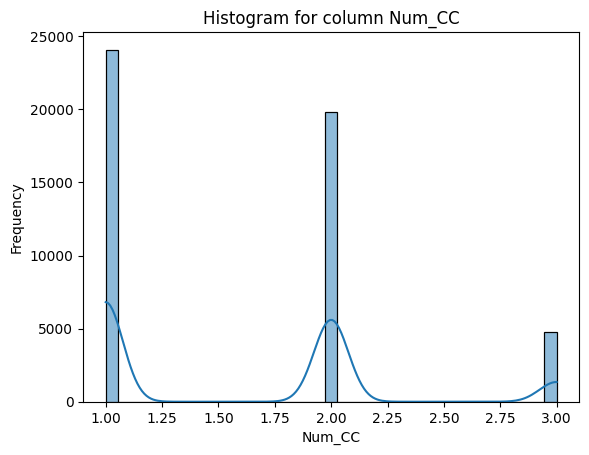

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=148182;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=874564;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

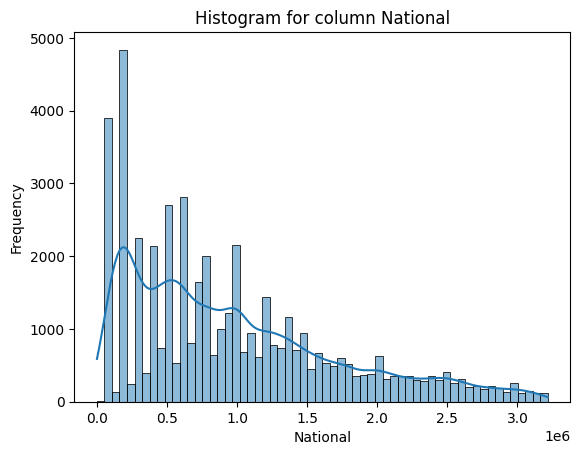

[12/07/24 23:00:19] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=184883;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=693163;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

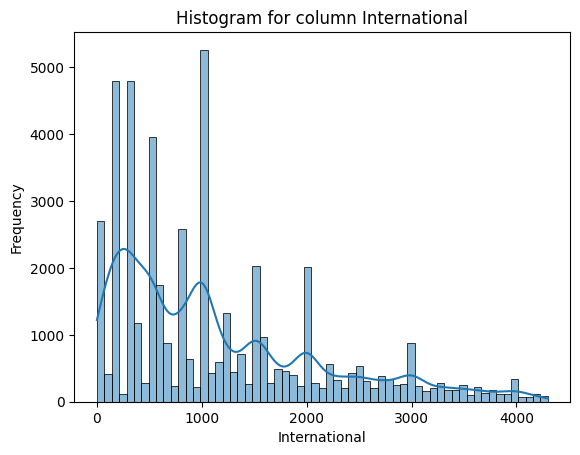

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=607374;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=728283;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

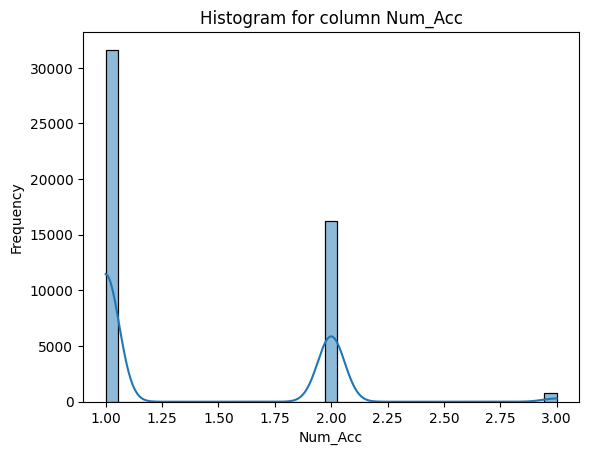

In [15]:
for column in imputed.columns:
    sns.histplot(data=imputed, x=column, kde=True)
    plt.title(f'Histogram for column {column}')
    plt.ylabel('Frequency')
    plt.show()

[12/07/24 23:22:16] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=780451;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=790417;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

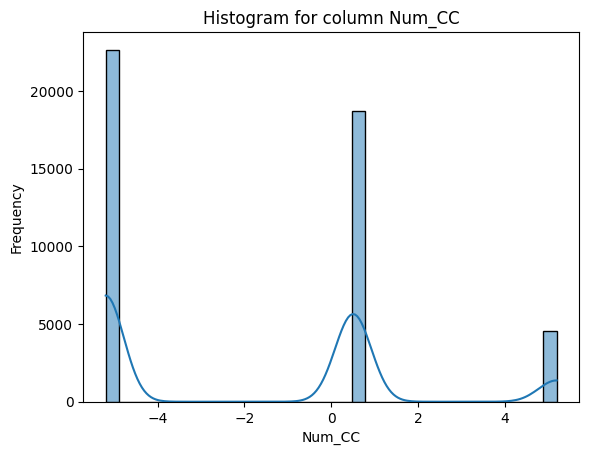

[12/07/24 23:22:17] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=135949;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=91378;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

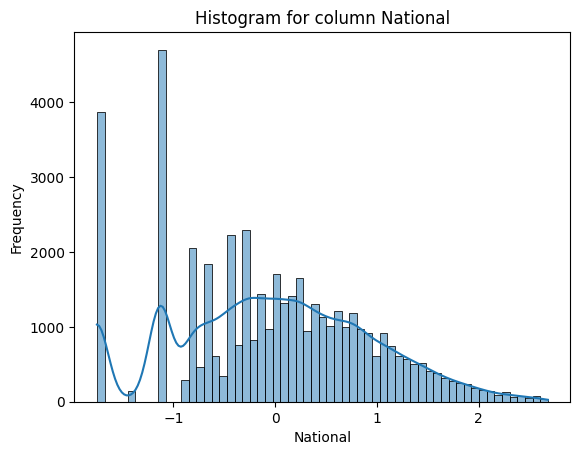

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=275671;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=172347;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

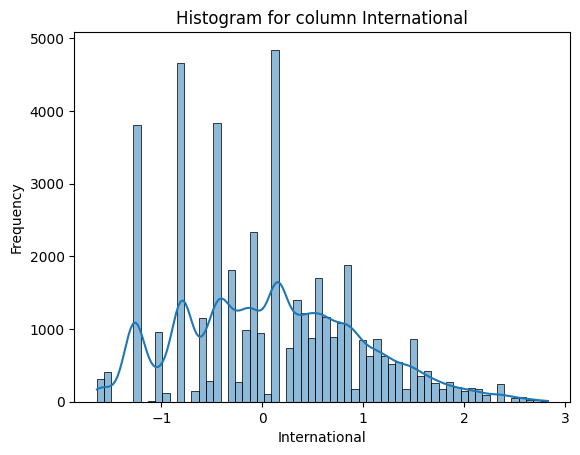

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=459736;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=959132;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

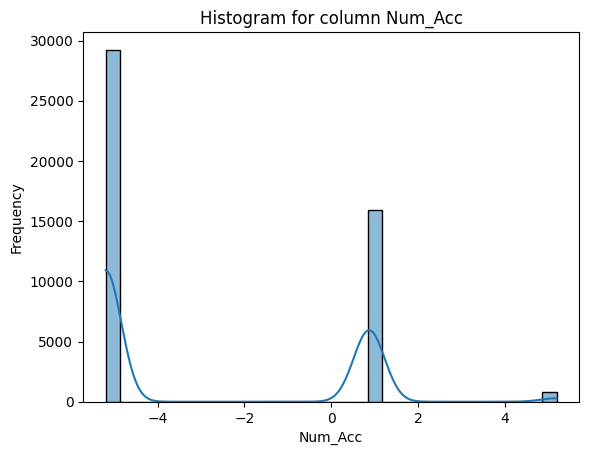

In [42]:
for column in final.columns:
    sns.histplot(data=final, x=column, kde=True)
    plt.title(f'Histogram for column {column}')
    plt.ylabel('Frequency')
    plt.show()

In [45]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

X = final[['Num_CC', 'National', 'International']]
y = final['Num_Acc']

# División del conjunto de datos (60% entrenamiento, 20% validación, 20% prueba)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Mejor modelo con los mejores hiperparámetros encontrados
final_pipeline = Pipeline([
    ('extra_trees', ExtraTreesRegressor(
        n_estimators=15,
        max_features=1.0,
        min_samples_leaf=2,
        min_samples_split=21,
        random_state=42
    ))
])

#scaler = StandardScaler()
#X_train = scaler.fit_transform(X_train)
#X_val = scaler.transform(X_val)
#X_test = scaler.transform(X_test)

# Entrenar el modelo en el conjunto de entrenamiento
final_pipeline.fit(X_train, y_train)

# Evaluar en los conjuntos de validación y prueba
y_val_pred = final_pipeline.predict(X_val)
y_test_pred = final_pipeline.predict(X_test)

val_r2 = r2_score(y_val, y_val_pred)
val_mse = mean_squared_error(y_val, y_val_pred)

test_r2 = r2_score(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

# Resultados
print("Resultados en Validación:")
print(f"R²: {val_r2}")
print(f"MSE: {val_mse}")

print("\nResultados en Prueba:")
print(f"R²: {test_r2}")
print(f"MSE: {test_mse}")


Resultados en Validación:
R²: 0.6953011791098278
MSE: 2.856876465360937

Resultados en Prueba:
R²: 0.7075342522020962
MSE: 2.7630956344422857


In [46]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# --- Carga de datos y selección de características ---
# Supongamos que 'dat' es el DataFrame con las variables relevantes.
dat = pd.DataFrame()
dat['Num_Acc'] = final['Num_Acc']  
dat['National'] = final['National']
dat['International'] = final['International']

# --- División de datos en entrenamiento, validación y prueba ---
train, valid, test = np.split(dat.sample(frac=1, random_state=42), [int(0.6*len(dat)), int(0.8*len(dat))])

X_train = train.drop(columns=['International'])
y_train = train['International']

X_valid = valid.drop(columns=['International'])
y_valid = valid['International']

X_test = test.drop(columns=['International'])
y_test = test['International']

# --- Escalado de características ---
#scaler = StandardScaler()
#X_train = scaler.fit_transform(X_train)
#X_valid = scaler.transform(X_valid)
#X_test = scaler.transform(X_test)

# --- Creación del modelo ---
model = XGBRegressor(
    booster='dart',               # Tipo de booster
    learning_rate=0.2,            # Tasa de aprendizaje
    max_depth=3,                  # Profundidad máxima del árbol
    n_estimators=100,             # Número de árboles
    objective='reg:squarederror', # Objetivo de regresión
    tree_method='gpu_hist',       # Uso de GPU
    random_state=42               # Reproducibilidad
)

# --- Entrenamiento del modelo ---
model.fit(X_train, y_train)

# --- Evaluación del modelo ---
y_pred_valid = model.predict(X_valid)
y_pred_test = model.predict(X_test)

# Métricas para validación
mse_valid = mean_squared_error(y_valid, y_pred_valid)
mae_valid = mean_absolute_error(y_valid, y_pred_valid)
r2_valid = r2_score(y_valid, y_pred_valid)
rmse_valid = mean_squared_error(y_valid, y_pred_valid, squared=False)

# Métricas para prueba
mse_test = mean_squared_error(y_test, y_pred_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
rmse_test = mean_squared_error(y_test, y_pred_test, squared=False)

# --- Impresión de resultados ---
print("Resultados de Validación:")
print(f"Mean Squared Error: {mse_valid}")
print(f"Mean Absolute Error: {mae_valid}")
print(f"R^2: {r2_valid}")
print(f"Root Mean Squared Error: {rmse_valid}\n")

print("Resultados de Prueba:")
print(f"Mean Squared Error: {mse_test}")
print(f"Mean Absolute Error: {mae_test}")
print(f"R^2: {r2_test}")
print(f"Root Mean Squared Error: {rmse_test}\n")

# Puntaje general del modelo en el conjunto de validación
print(f"Puntaje del modelo en validación: {model.score(X_valid, y_valid)}")


[12/07/24 23:26:25] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\numpy\_core\fromn ]8;id=253766;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=797296;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             umeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and                   
                             will be removed in a future version. Please use 'DataFrame.transpose'                 
                             instead.                                                                              
                               return bound(*args, **kwds)                                                         
                                                                                                                   

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\xgboost\core.py:1 ]8;id=620732;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=905949;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             58: UserWarning: [23:26:25] WARNING:                                                  
                             C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-00                
                             15a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:2                
                             7: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU                   
                             training, set the `device` parameter to CUDA instead.                                 
                                                                                                                   
                                 E.g. tree_method = "hist", device = "cuda"                                        
                                                                                                                   
                               warnings.warn(smsg, UserWarning)                                                    
                                                                                                                   

[12/07/24 23:26:29] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\xgboost\core.py:1 ]8;id=395717;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=633168;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             58: UserWarning: [23:26:29] WARNING:                                                  
                             C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-00                
                             15a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:2                
                             7: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU                   
                             training, set the `device` parameter to CUDA instead.                                 
                                                                                                                   
                                 E.g. tree_method = "hist", device = "cuda"                                        
                                                                                                                   
                               warnings.warn(smsg, UserWarning)                                                    
                                                                                                                   

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\sklearn\metrics\_ ]8;id=169768;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=524415;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             regression.py:492: FutureWarning: 'squared' is deprecated in version                  
                             1.4 and will be removed in 1.6. To calculate the root mean squared                    
                             error, use the function'root_mean_squared_error'.                                     
                               warnings.warn(                                                                      
                                                                                                                   

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\sklearn\metrics\_ ]8;id=559599;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=961452;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             regression.py:492: FutureWarning: 'squared' is deprecated in version                  
                             1.4 and will be removed in 1.6. To calculate the root mean squared                    
                             error, use the function'root_mean_squared_error'.                                     
                               warnings.warn(                                                                      
                                                                                                                   

Resultados de Validación:
Mean Squared Error: 0.19764427573822338
Mean Absolute Error: 0.30567524905605176
R^2: 0.7416719150746032
Root Mean Squared Error: 0.4445720141194488

Resultados de Prueba:
Mean Squared Error: 0.187748516888888
Mean Absolute Error: 0.29814719884105945
R^2: 0.7594158125980655
Root Mean Squared Error: 0.4332995694538456

Puntaje del modelo en validación: 0.7416719150746032


In [2]:
client_data = catalog.load('client_data')
client_transactions = catalog.load('client_transactions')
merged_data = catalog.load('merged_data')
data_groups = catalog.load('data_groups')
aditional_information = catalog.load('other_data')

[12/07/24 22:52:45] INFO     Loading data from client_data (ParquetDataset)...                  ]8;id=515737;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=605791;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py#389\389]8;;\

                    INFO     Loading data from client_transactions (ParquetDataset)...          ]8;id=898943;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=584504;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py#389\389]8;;\

                    INFO     Loading data from merged_data (ParquetDataset)...                  ]8;id=323036;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=953530;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py#389\389]8;;\

                    INFO     Loading data from data_groups (ParquetDataset)...                  ]8;id=799412;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=679712;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py#389\389]8;;\

                    INFO     Loading data from other_data (ParquetDataset)...                   ]8;id=511041;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=240219;file://C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\kedro\io\data_catalog.py#389\389]8;;\

----------------------- DataFrame client_Data -----------------------



[12/07/24 15:21:10] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=879760;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=223034;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

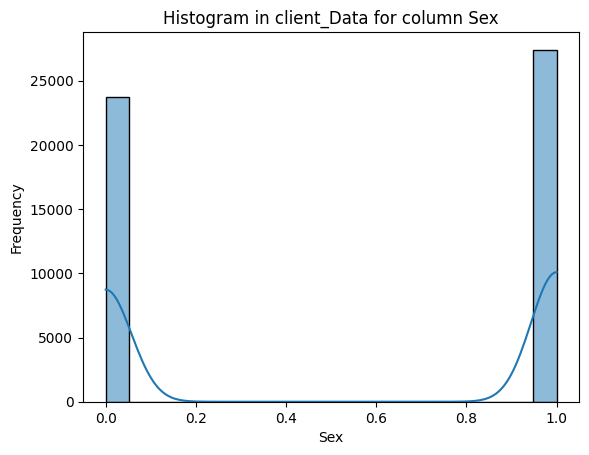

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=400766;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=418068;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

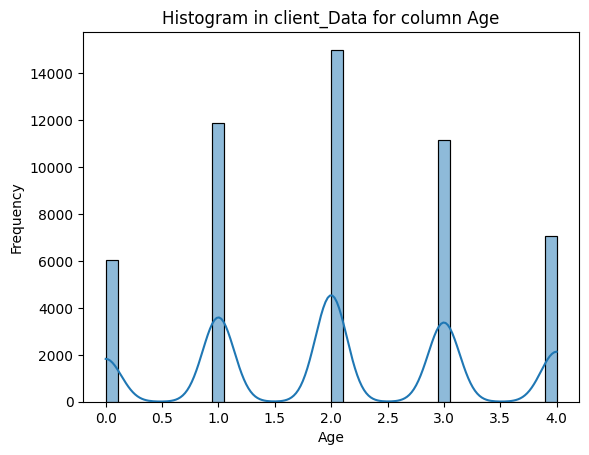

[12/07/24 15:21:11] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=678237;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=452925;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

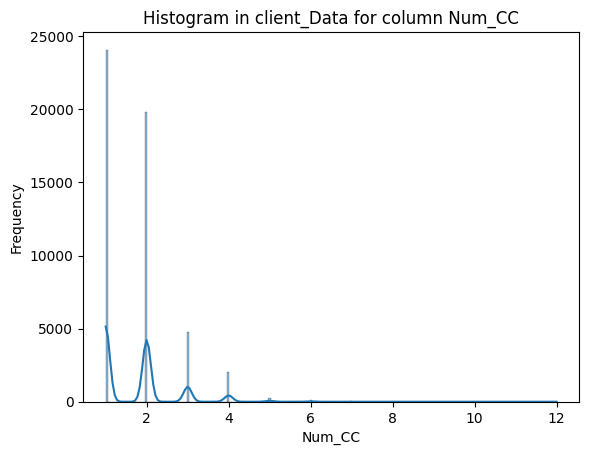

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=372871;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=751674;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

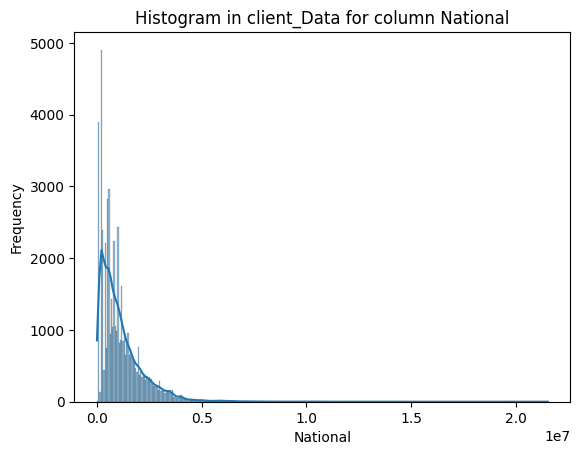

[12/07/24 15:21:12] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=389928;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=925681;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

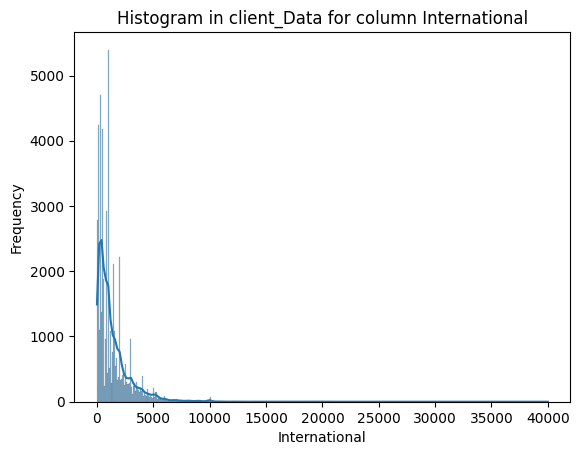

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=684502;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=297801;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

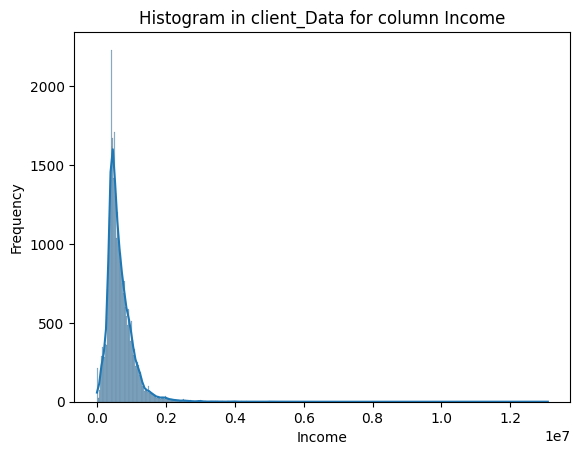

[12/07/24 15:21:13] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=645161;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=635021;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

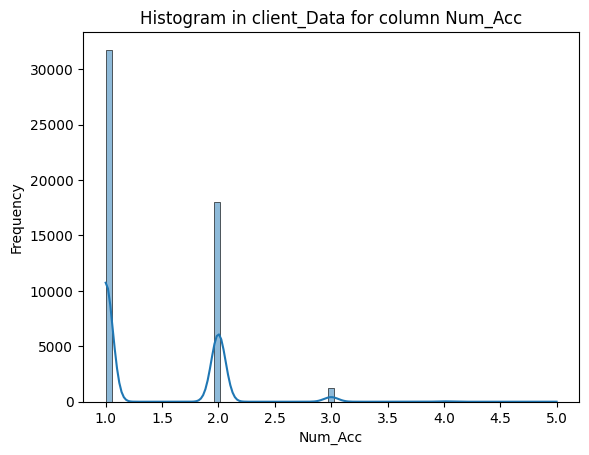

[12/07/24 15:21:14] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=374897;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=733281;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

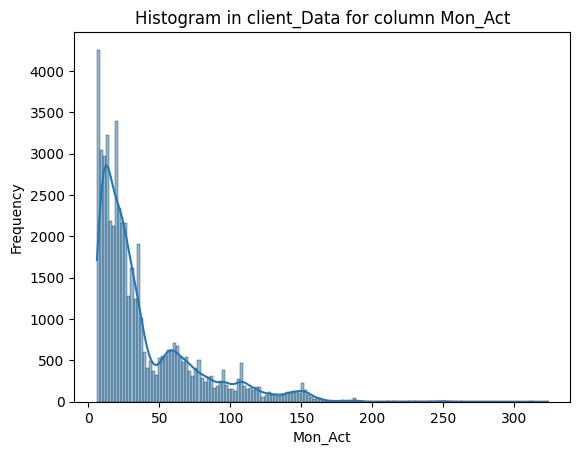

------------------------------------------------------------

----------------------- DataFrame client_transactions -----------------------



                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=842070;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=620636;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

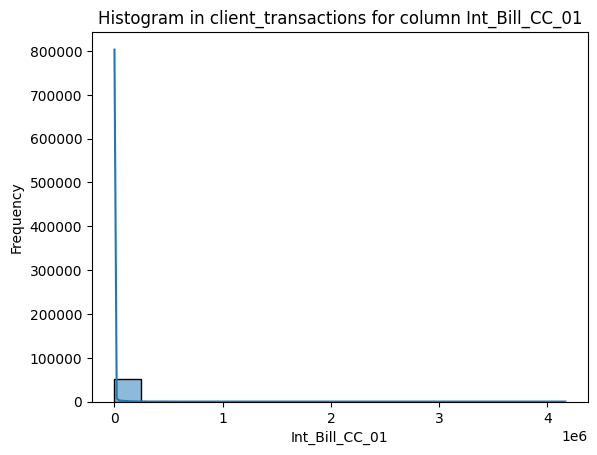

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=199016;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=578261;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

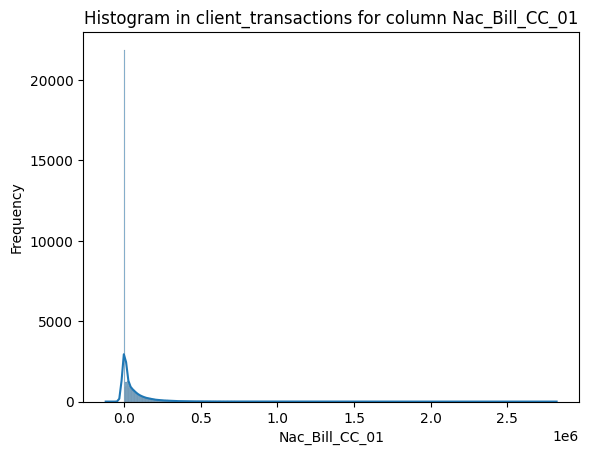

[12/07/24 15:21:15] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=538663;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=363928;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

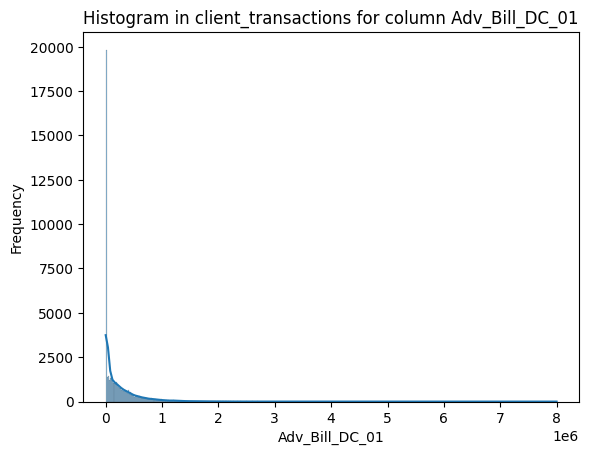

[12/07/24 15:21:16] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=59127;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=771190;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

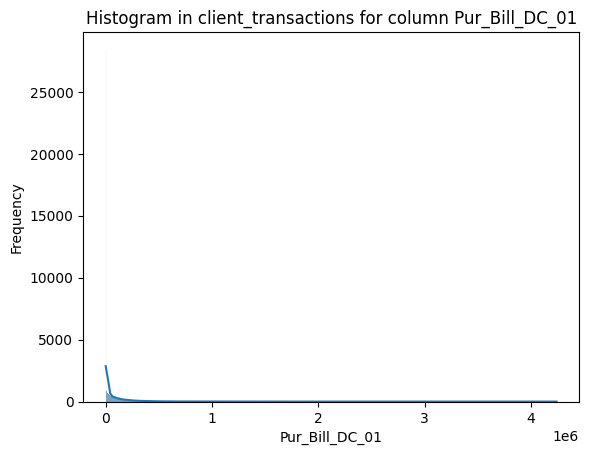

[12/07/24 15:21:17] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=963741;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=629690;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

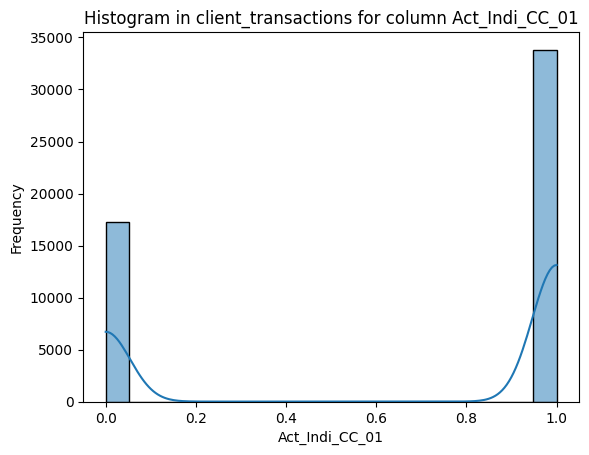

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=989055;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=39665;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

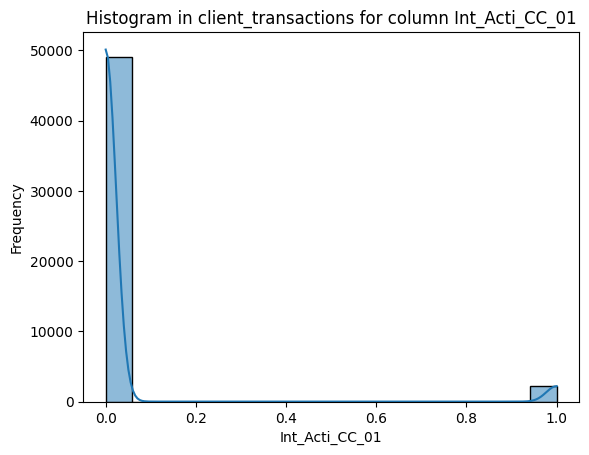

[12/07/24 15:21:18] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=878038;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=342628;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

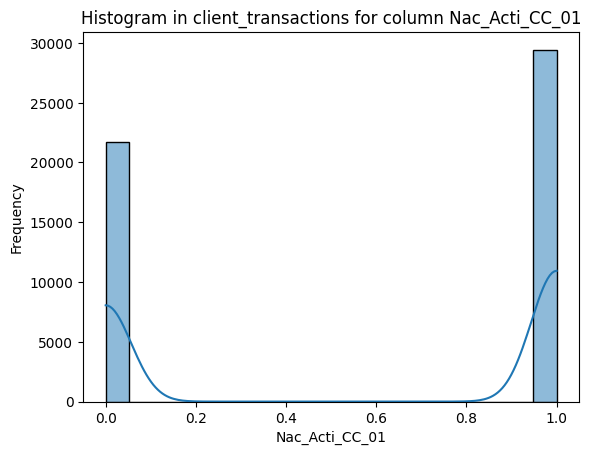

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=319044;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=399095;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

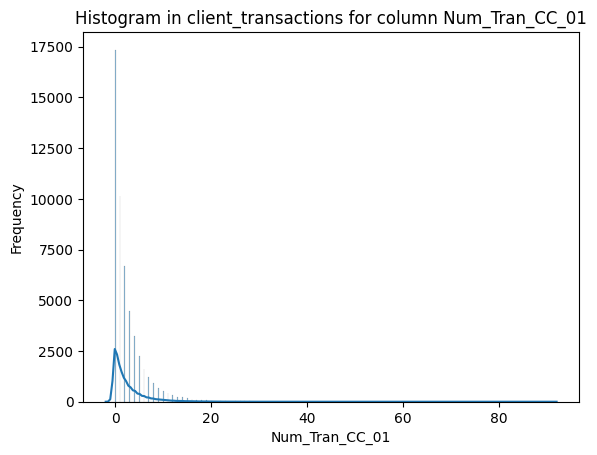

[12/07/24 15:21:19] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=22111;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=436577;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

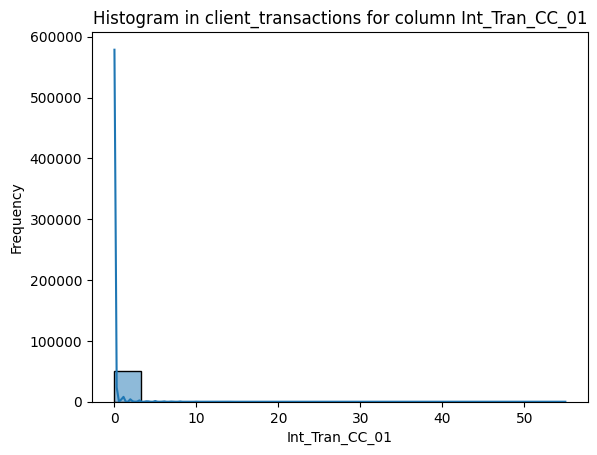

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=848641;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=933508;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

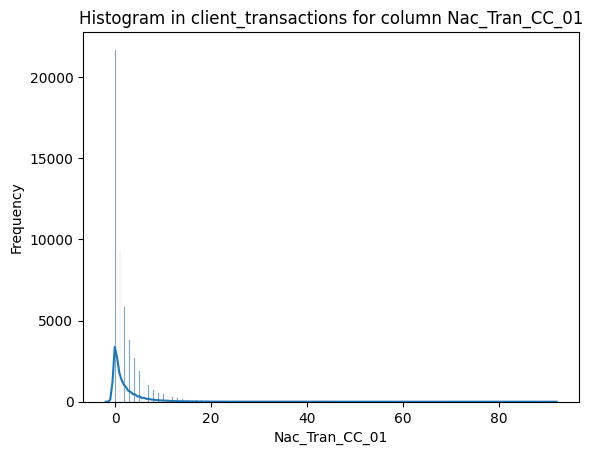

[12/07/24 15:21:20] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=537983;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=69724;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

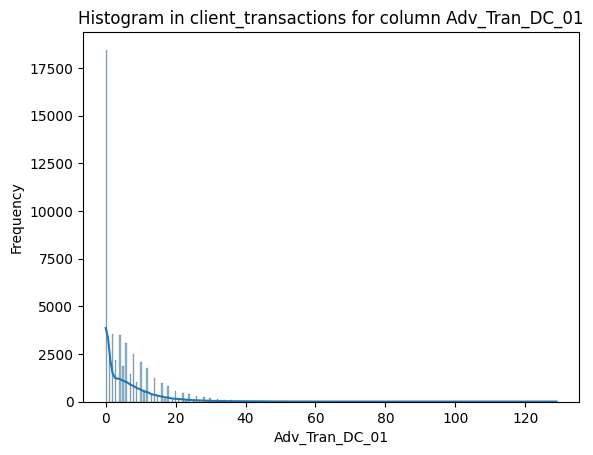

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=259153;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=784214;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

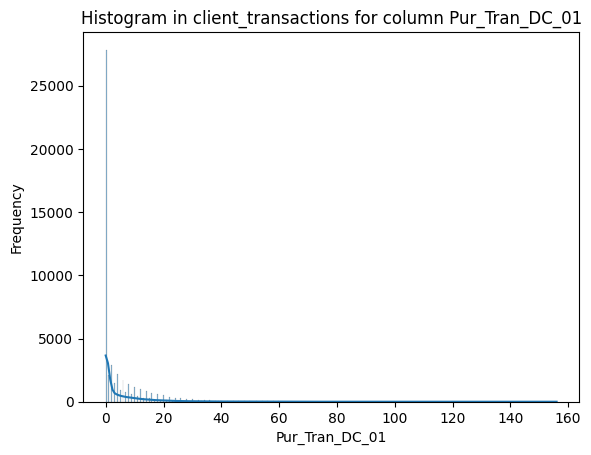

[12/07/24 15:21:21] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=814408;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=944200;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

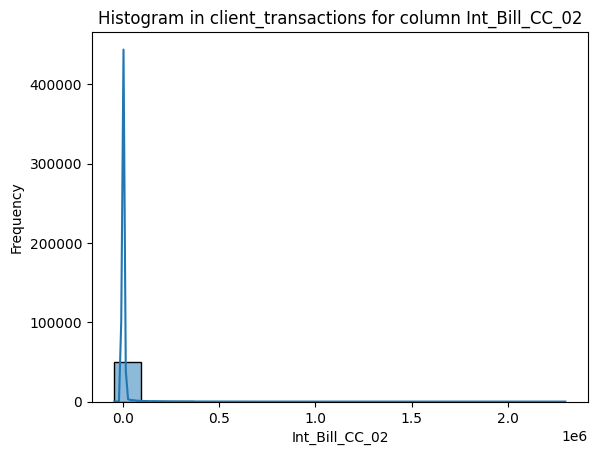

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=119850;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=179826;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

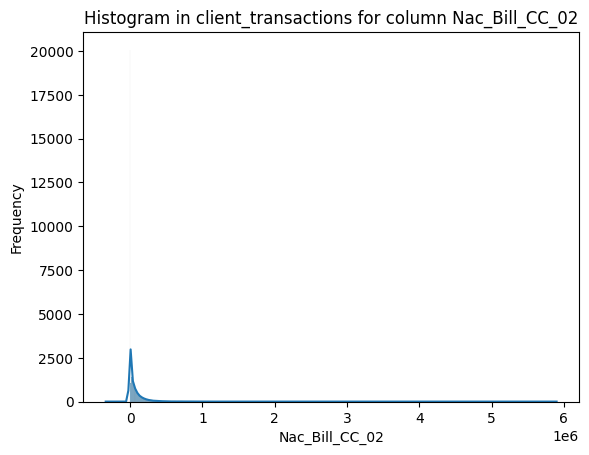

[12/07/24 15:21:22] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=362479;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=688725;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

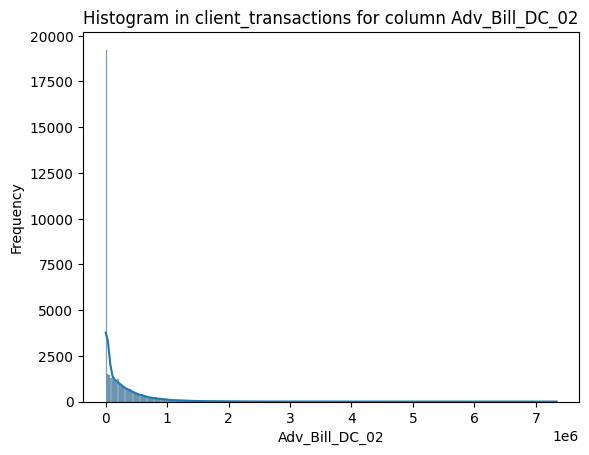

[12/07/24 15:21:23] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=851032;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=735963;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

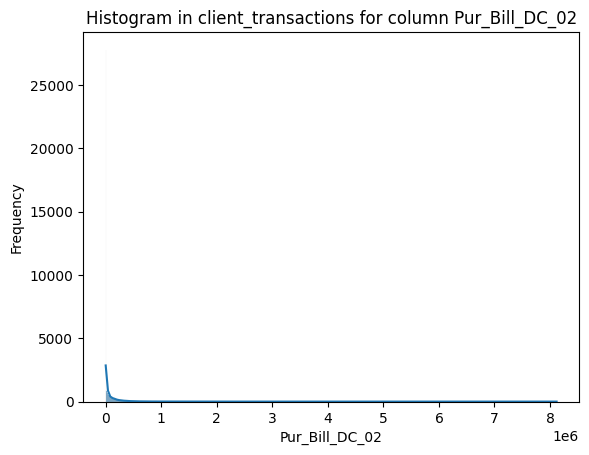

[12/07/24 15:21:25] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=888681;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=423185;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

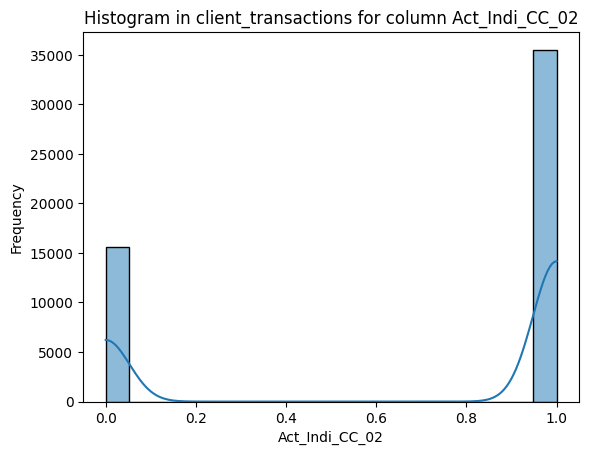

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=606554;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=140083;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

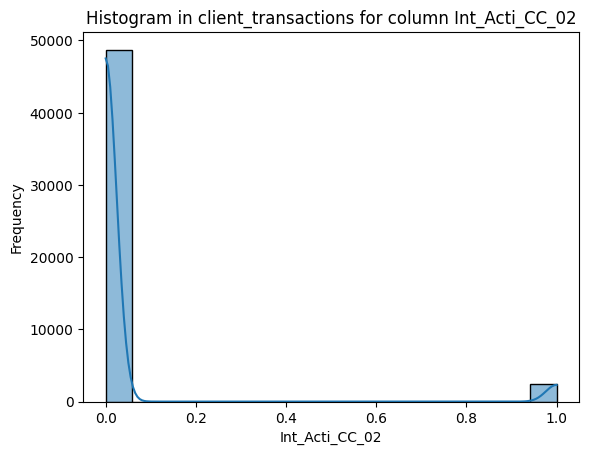

[12/07/24 15:21:26] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=451968;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=463871;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

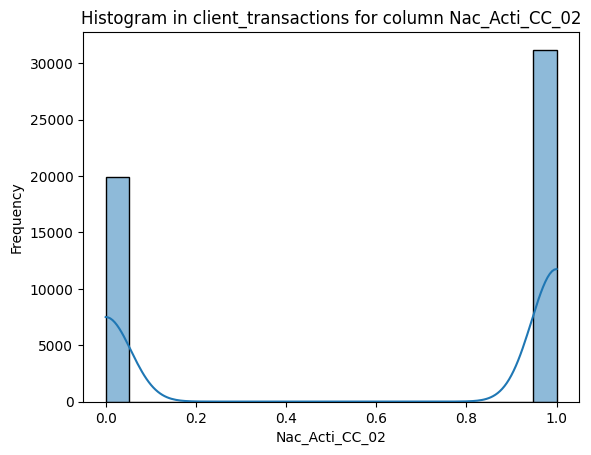

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=607942;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=58630;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

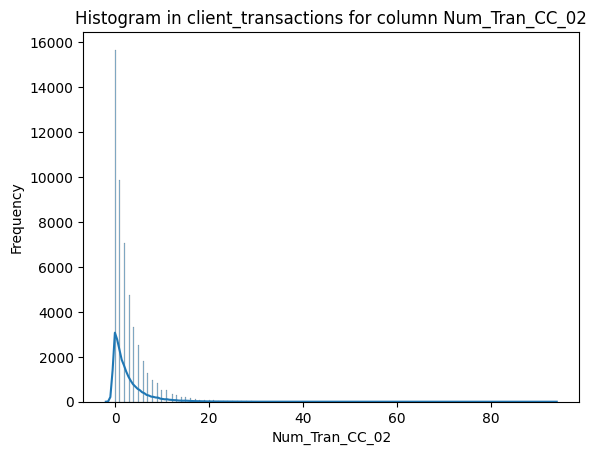

[12/07/24 15:21:27] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=38141;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=305041;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

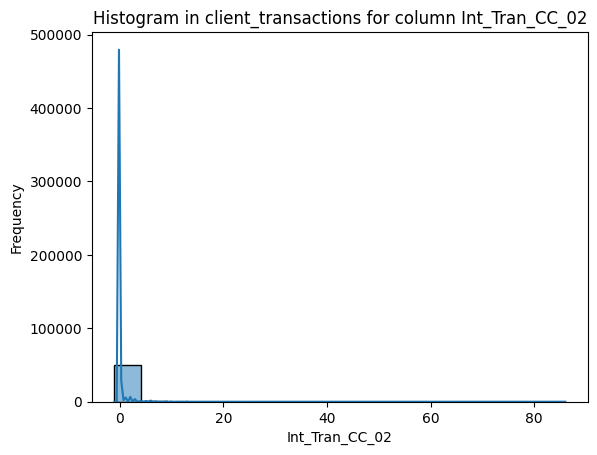

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=857393;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=436099;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

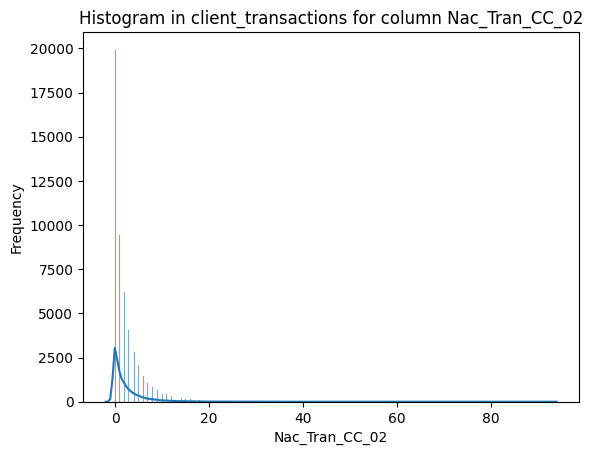

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=725294;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=313864;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

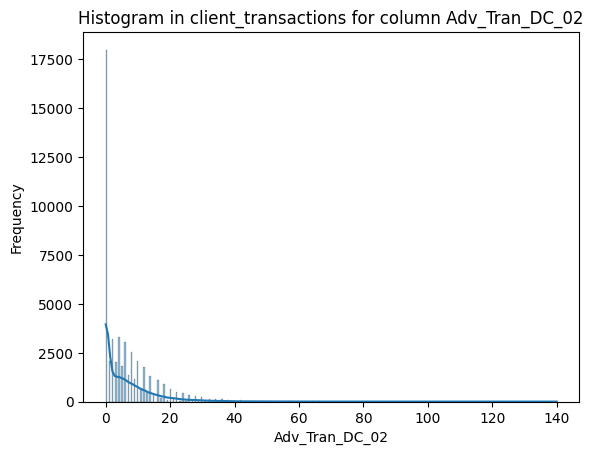

[12/07/24 15:21:28] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=564106;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=317504;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

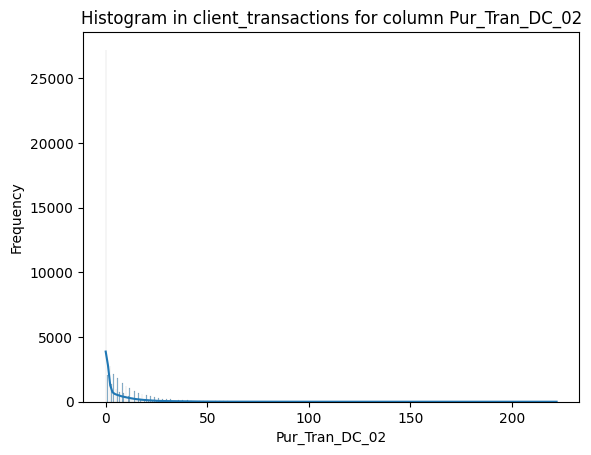

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=884733;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=177867;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

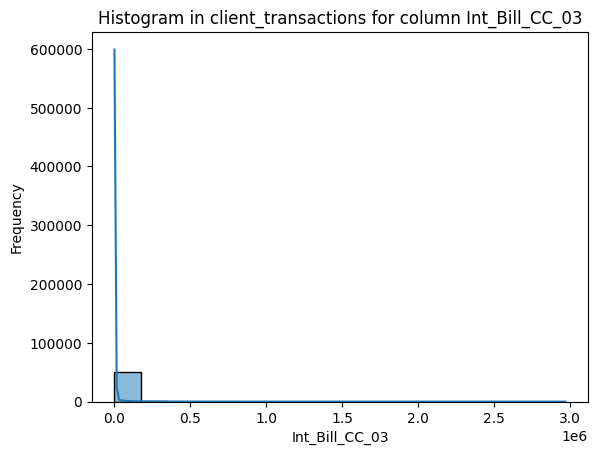

[12/07/24 15:21:29] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=355878;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=520485;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

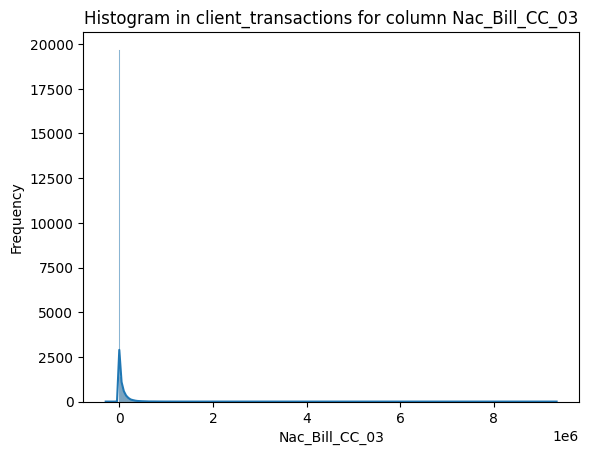

[12/07/24 15:21:30] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=822687;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=720577;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

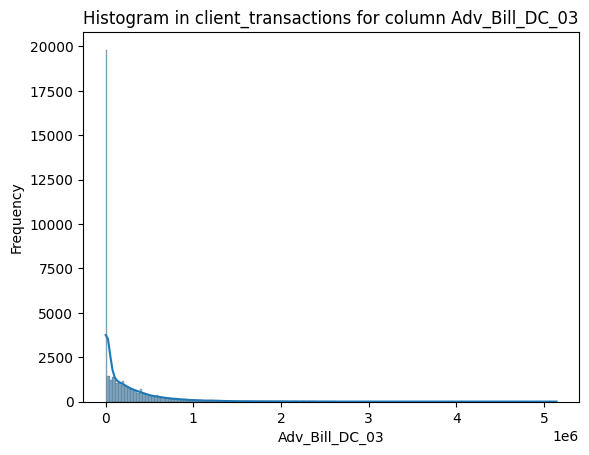

[12/07/24 15:21:31] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=468377;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=438931;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

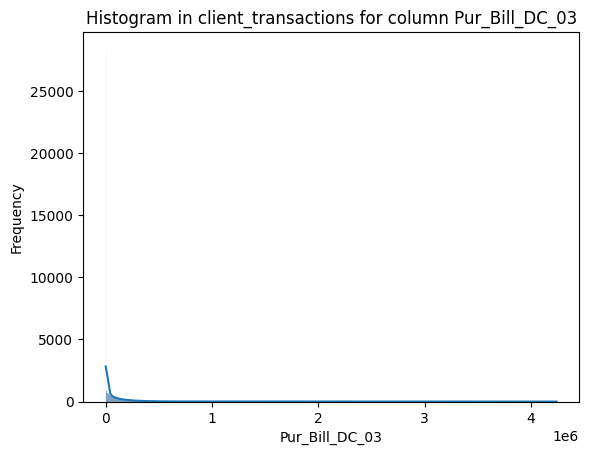

[12/07/24 15:21:32] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=189179;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=716292;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

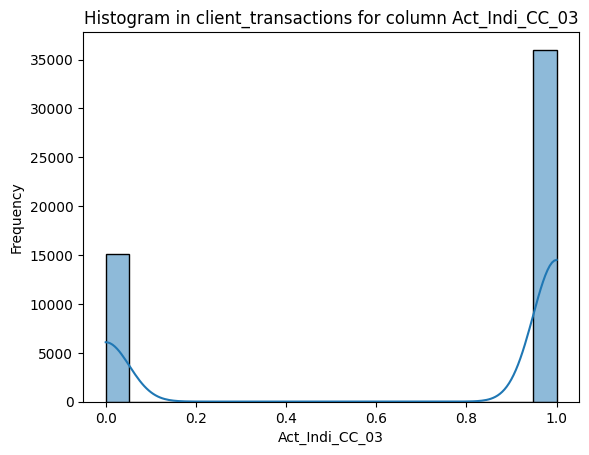

[12/07/24 15:21:33] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=268183;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=654057;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

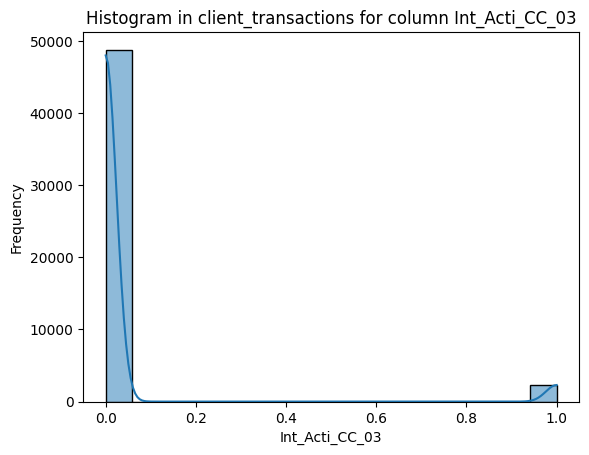

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=212689;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=705006;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

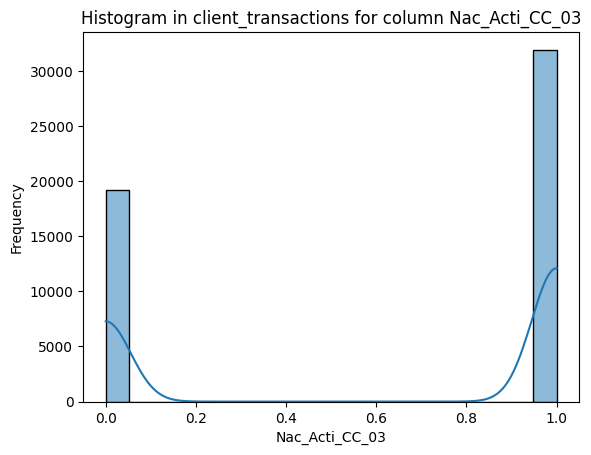

[12/07/24 15:21:34] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=629008;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=462931;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

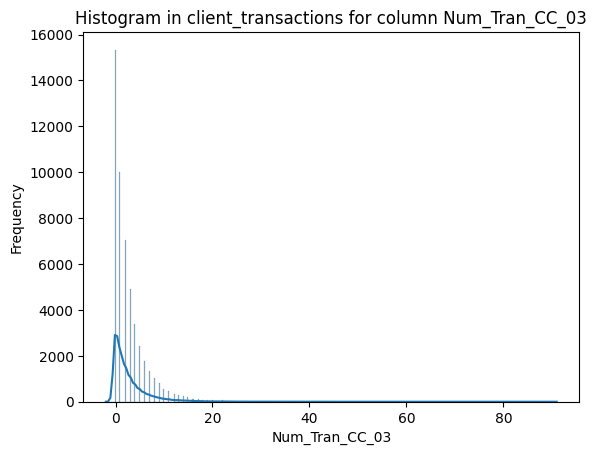

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=58941;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=723582;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

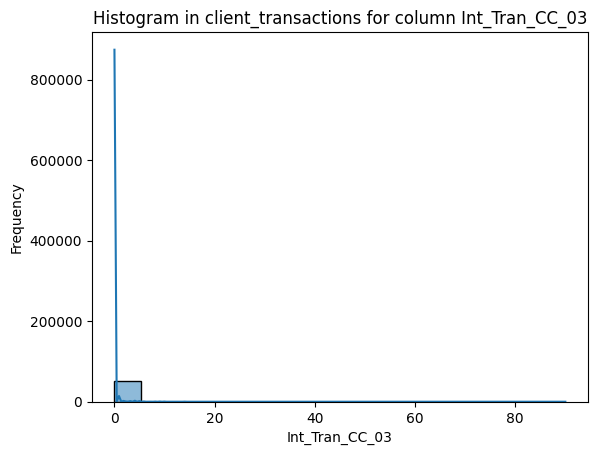

[12/07/24 15:21:35] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=281213;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=271649;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

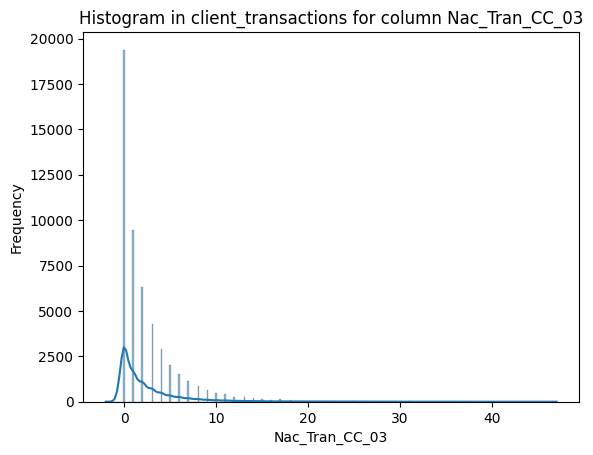

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=367059;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=923329;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

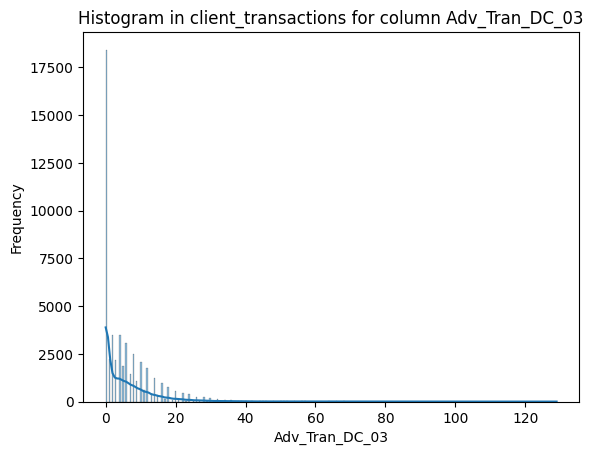

[12/07/24 15:21:36] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=945053;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=284908;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

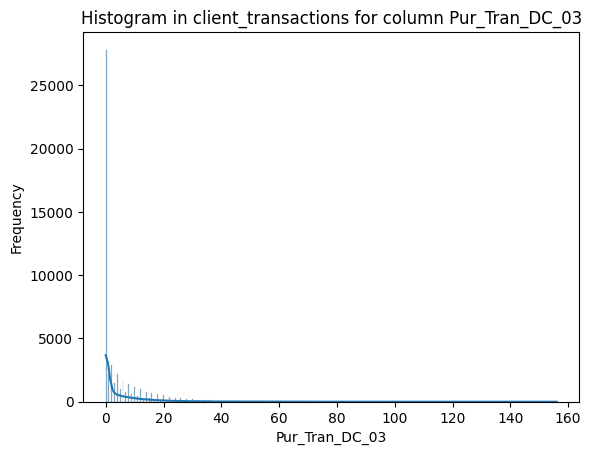

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=562699;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=35288;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

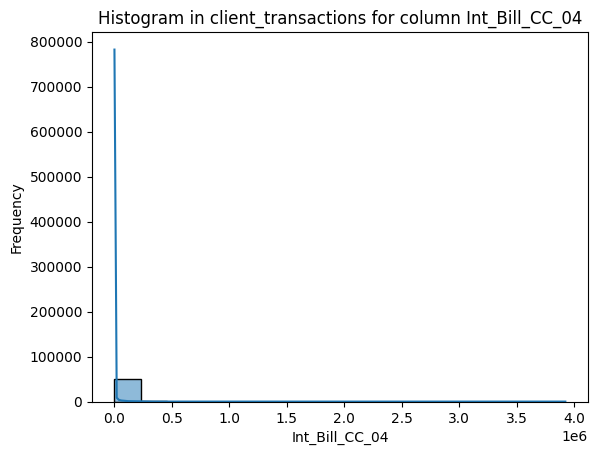

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=758001;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=210926;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

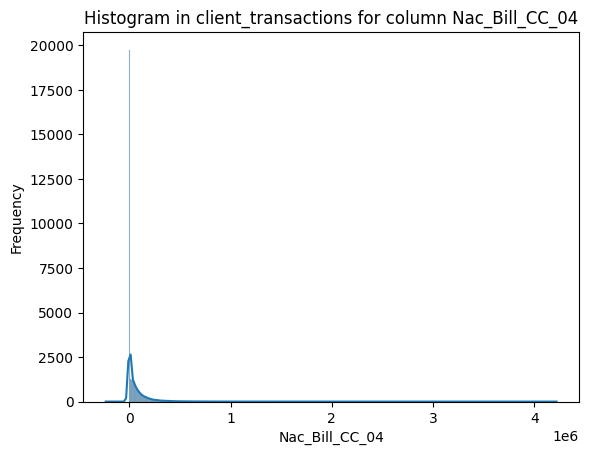

[12/07/24 15:21:38] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=60450;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=501693;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

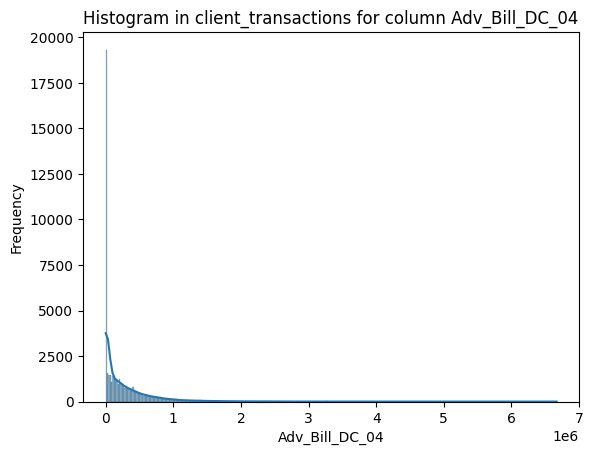

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=417759;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=526450;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

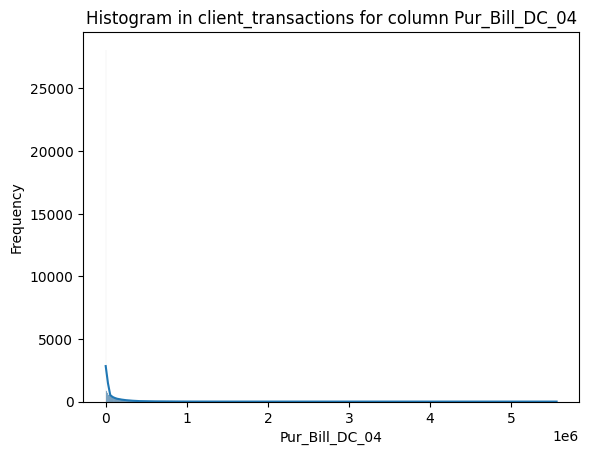

[12/07/24 15:21:39] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=868914;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=16418;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

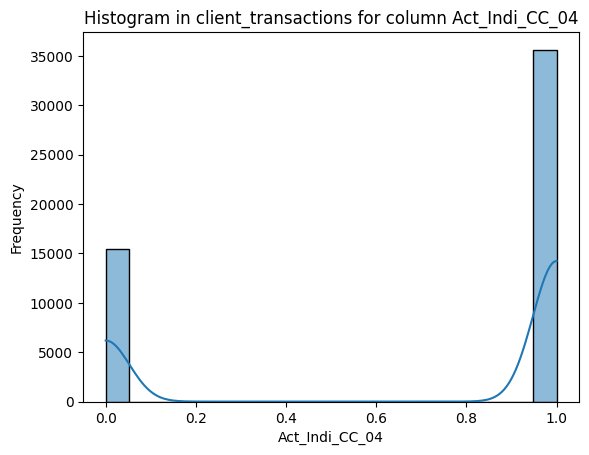

[12/07/24 15:21:40] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=916339;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=389056;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

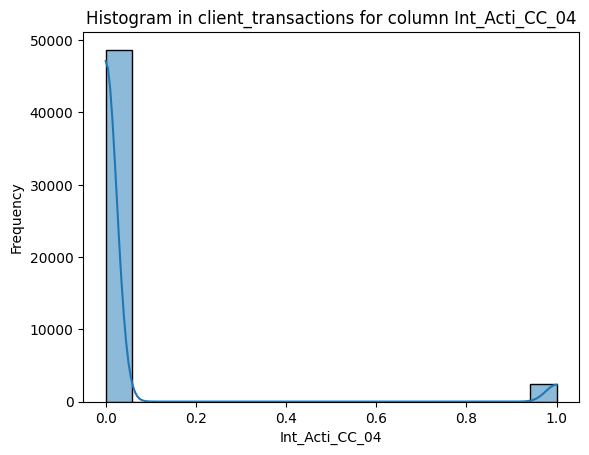

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=380324;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=513989;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

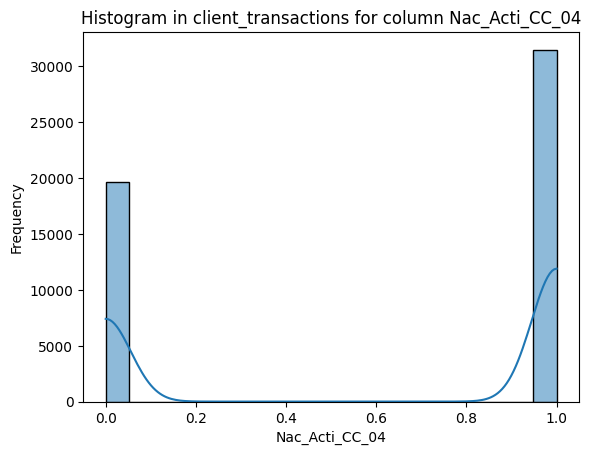

[12/07/24 15:21:41] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=681648;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=30838;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

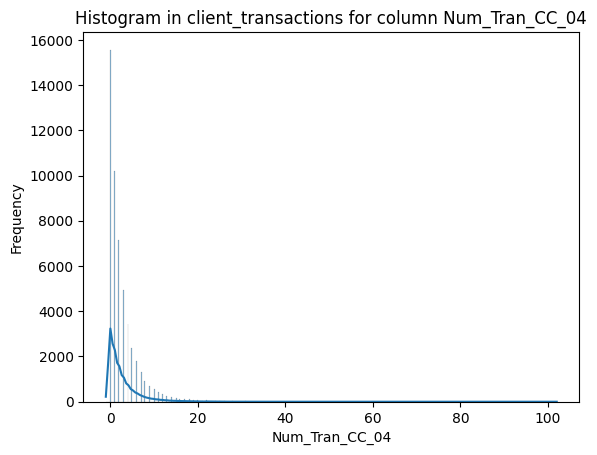

[12/07/24 15:21:42] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=906221;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=657228;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

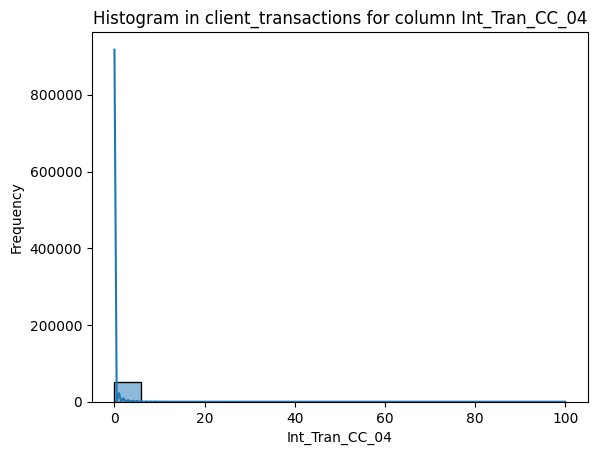

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=357743;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=268046;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

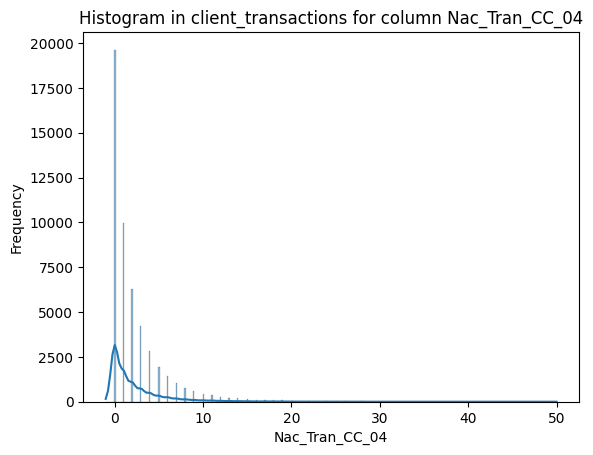

[12/07/24 15:21:43] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=122176;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=848575;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

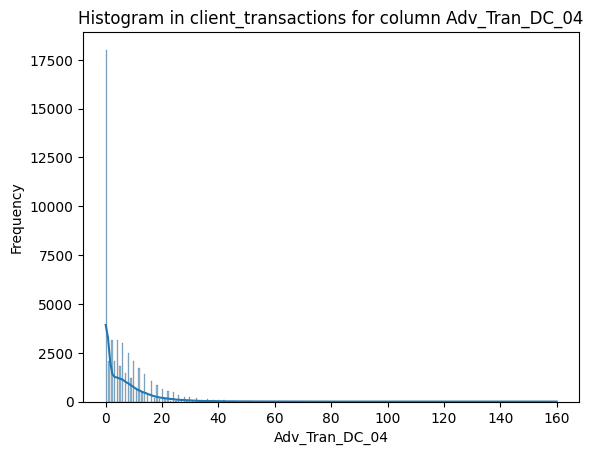

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=760655;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=739989;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

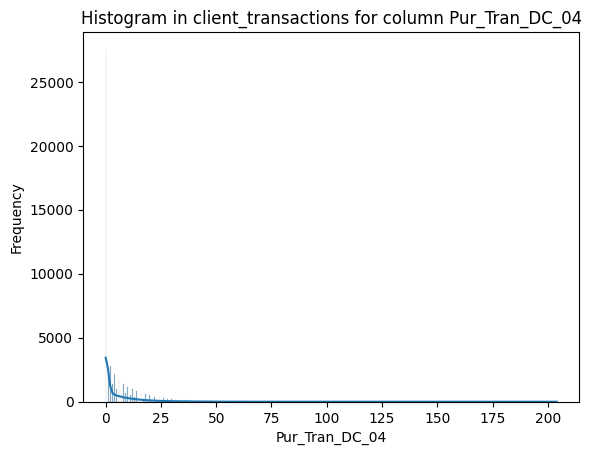

[12/07/24 15:21:44] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=497568;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=746424;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

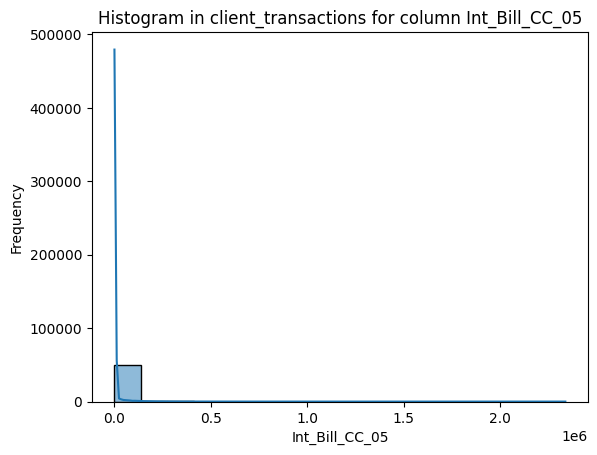

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=399321;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=148239;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

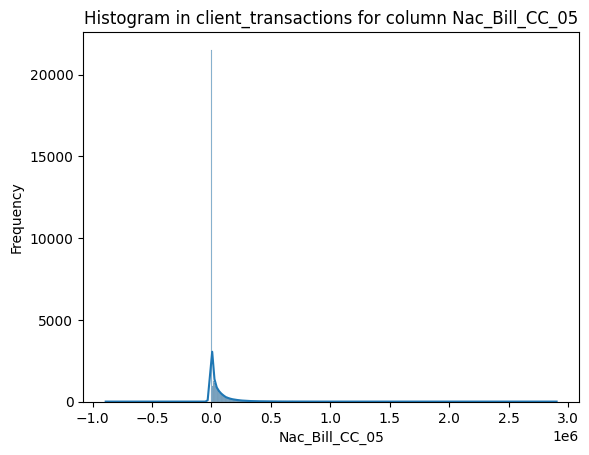

[12/07/24 15:21:45] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=246181;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=870581;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

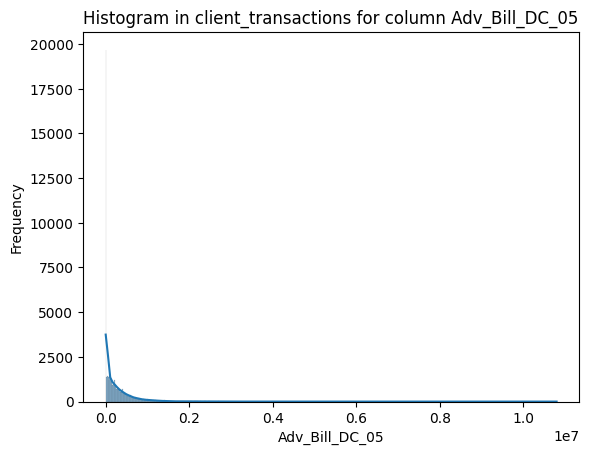

[12/07/24 15:21:46] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=132450;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=548116;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

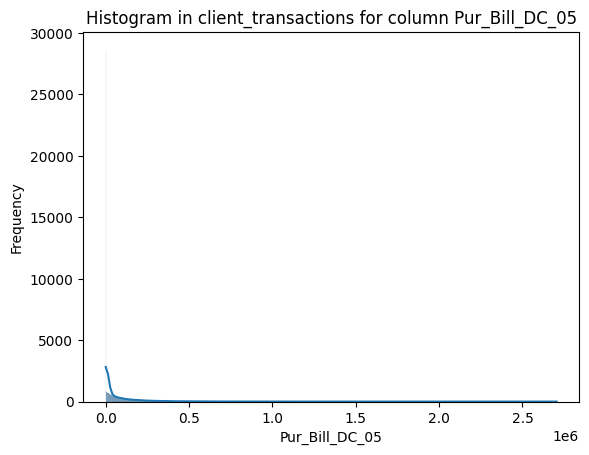

[12/07/24 15:21:47] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=358937;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=575584;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

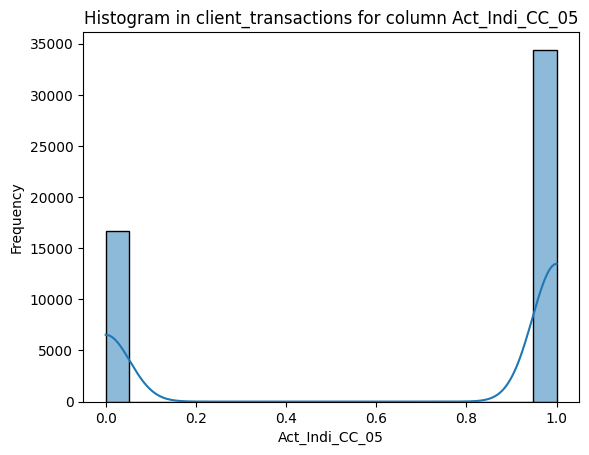

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=90293;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=225128;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

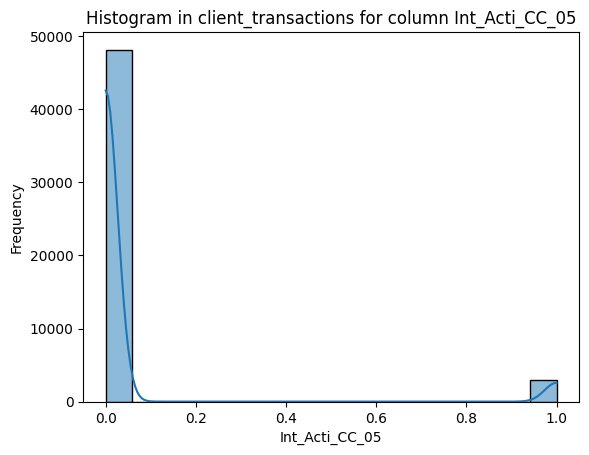

[12/07/24 15:21:48] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=901737;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=574033;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

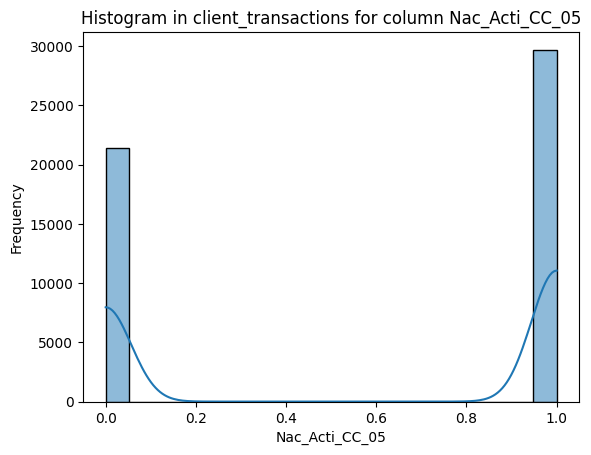

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=717143;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=822078;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

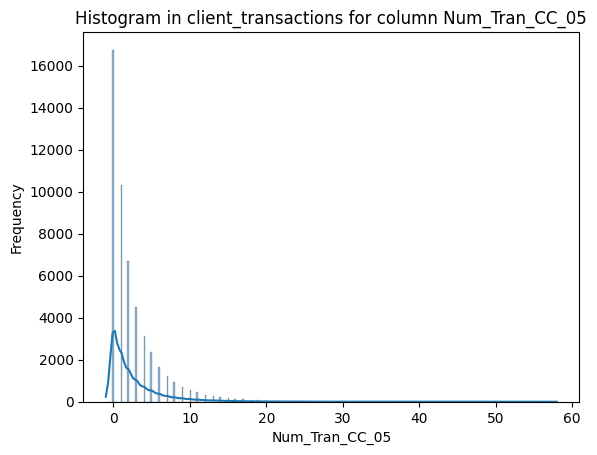

[12/07/24 15:21:49] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=720583;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=23173;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

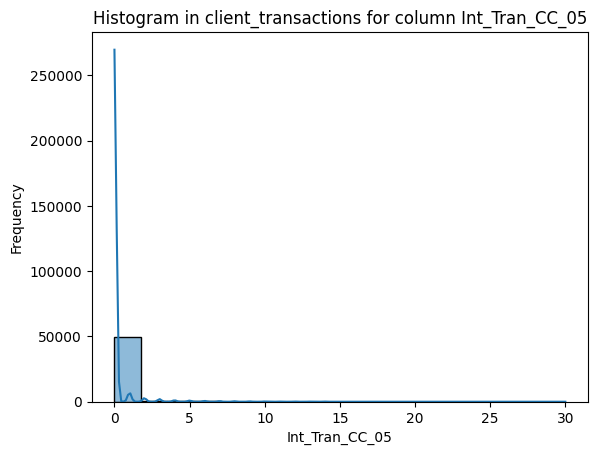

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=710863;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=925277;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

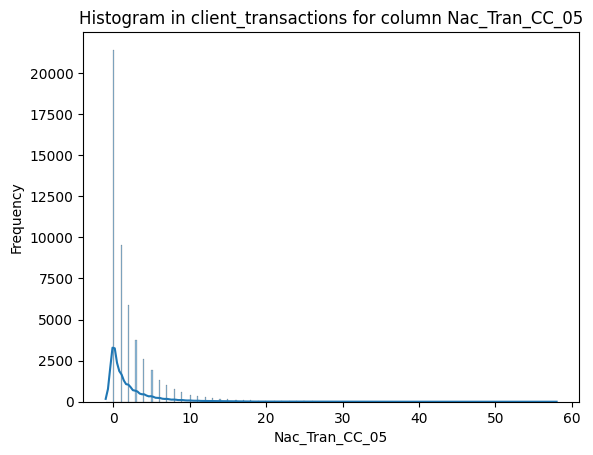

[12/07/24 15:21:50] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=839626;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=759280;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

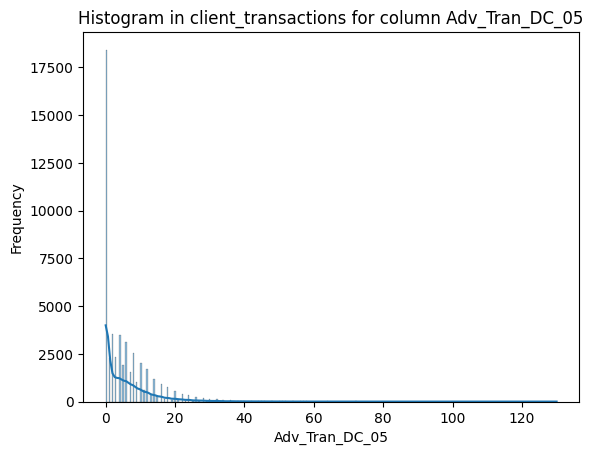

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=618437;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=482017;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

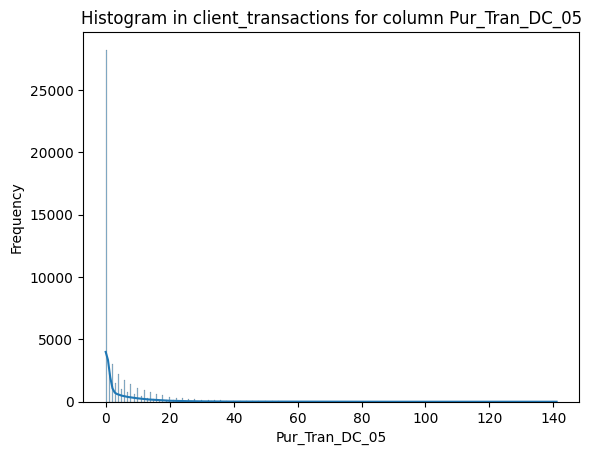

[12/07/24 15:21:51] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=753706;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=627203;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

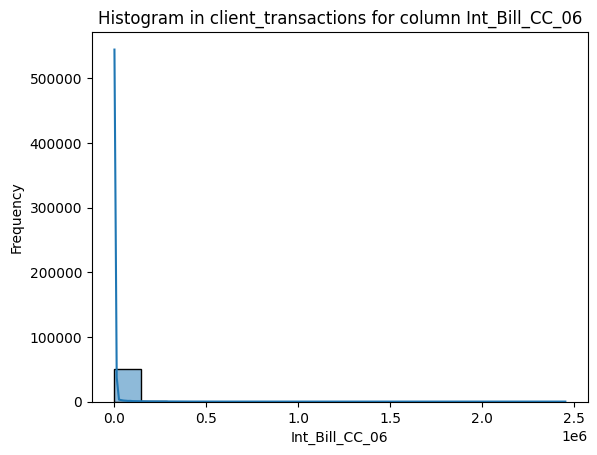

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=875019;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=313075;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

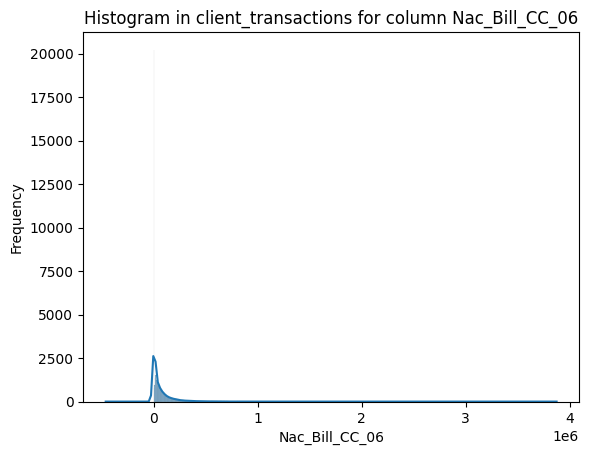

[12/07/24 15:21:52] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=574914;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=883777;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

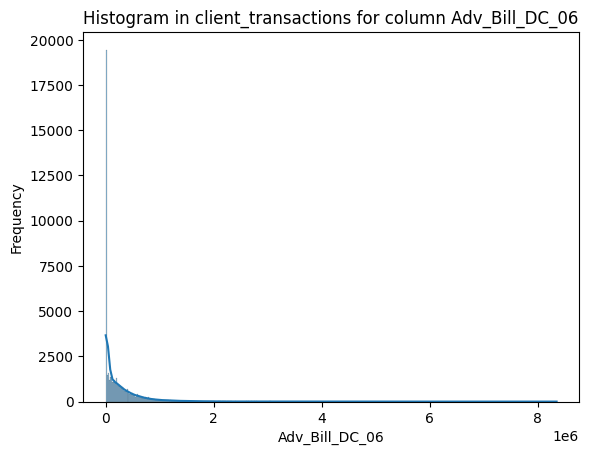

[12/07/24 15:21:53] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=787244;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=139986;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

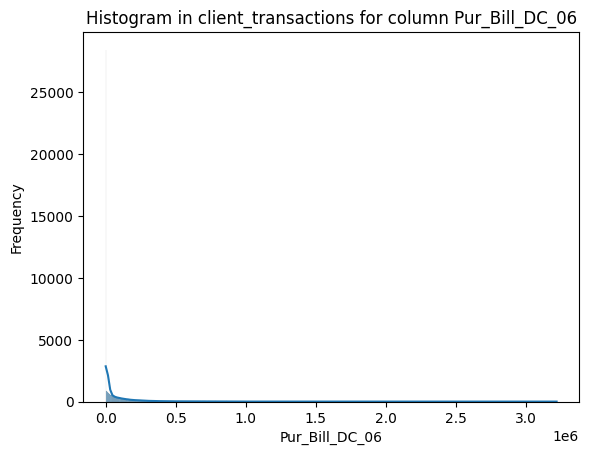

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=852312;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=437879;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

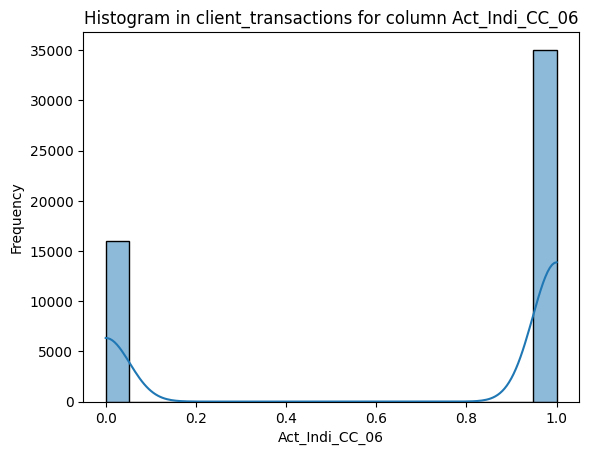

[12/07/24 15:21:54] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=993880;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=852457;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

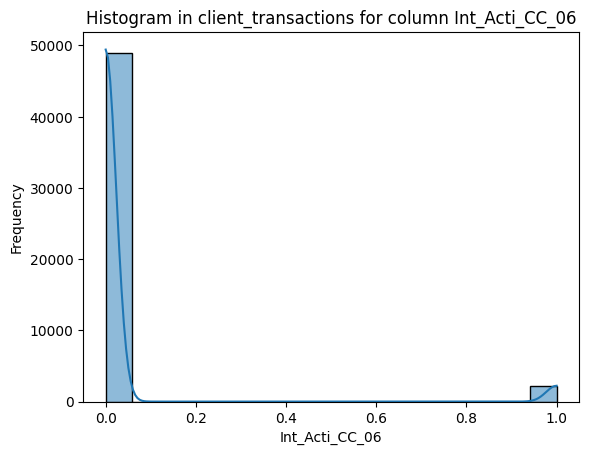

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=955354;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=829279;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

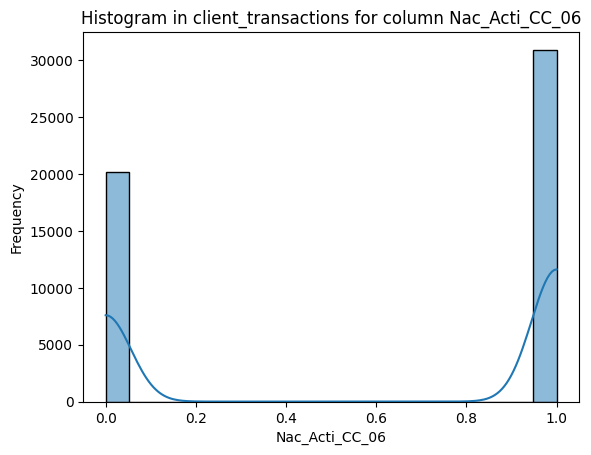

[12/07/24 15:21:55] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=97315;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=413375;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

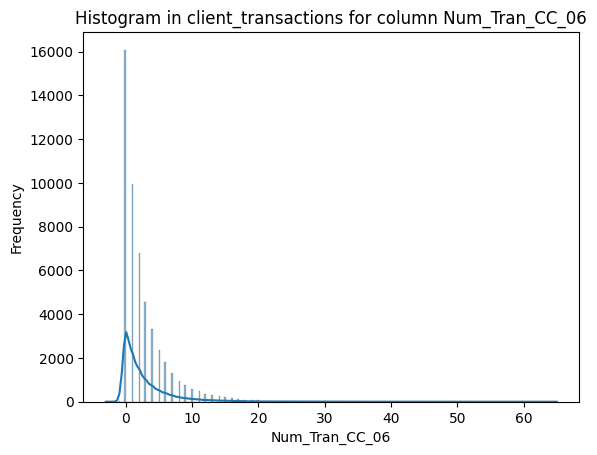

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=156424;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=616942;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

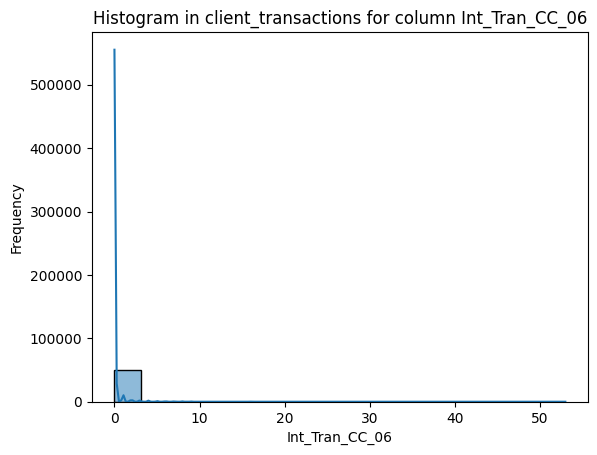

[12/07/24 15:21:56] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=618085;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=28952;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

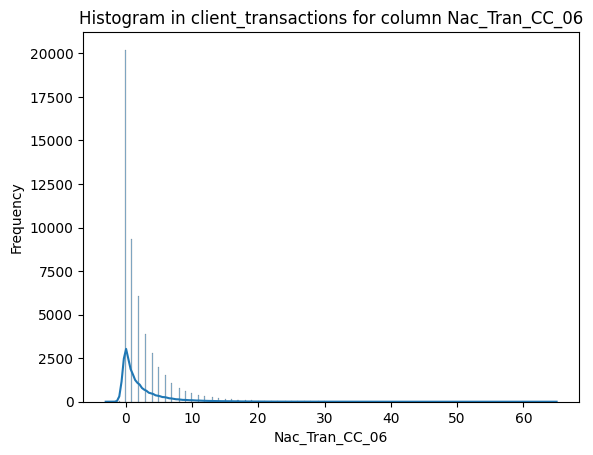

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=837219;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=213706;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

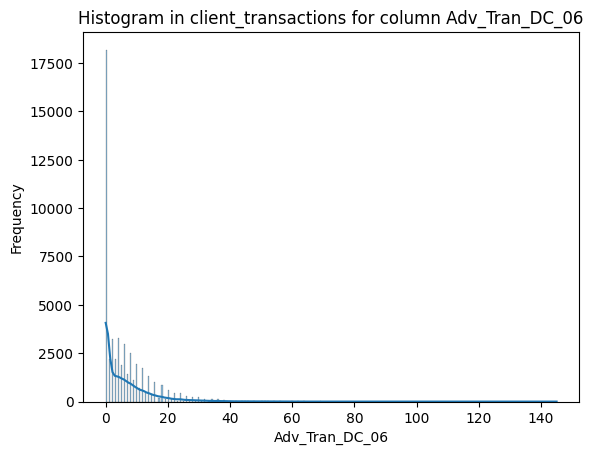

[12/07/24 15:21:57] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=404496;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=684755;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

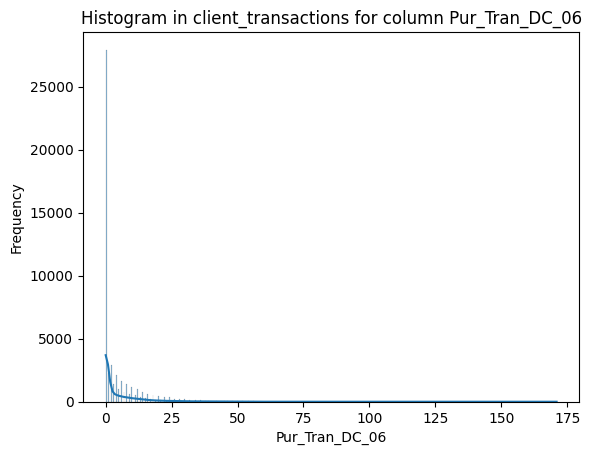

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=365398;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=926259;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

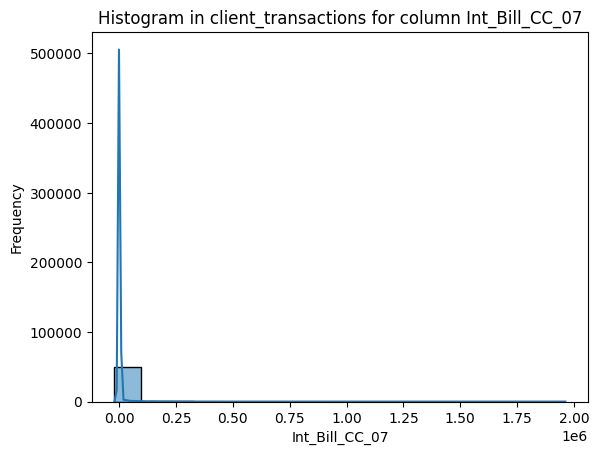

[12/07/24 15:21:58] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=772140;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=875755;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

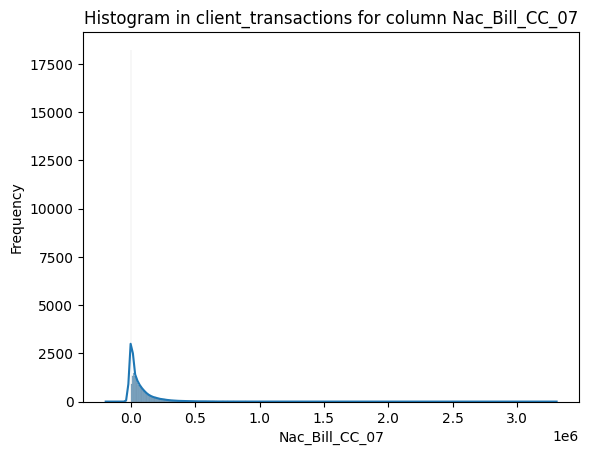

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=822495;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=634601;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

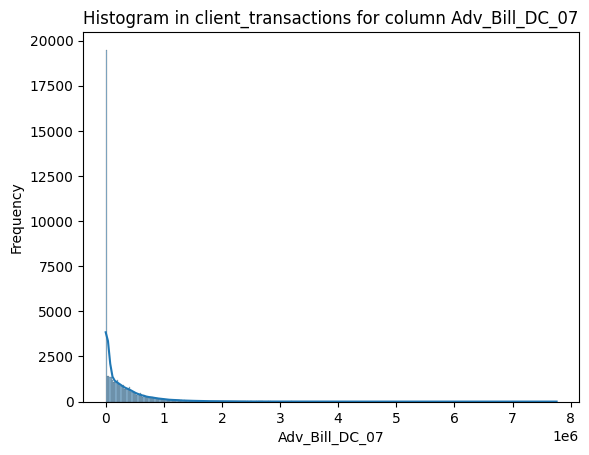

[12/07/24 15:21:59] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=473043;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=750846;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

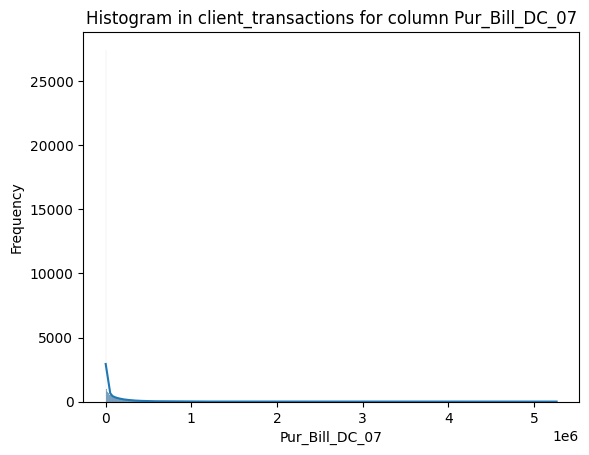

[12/07/24 15:22:00] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=353125;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=362711;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

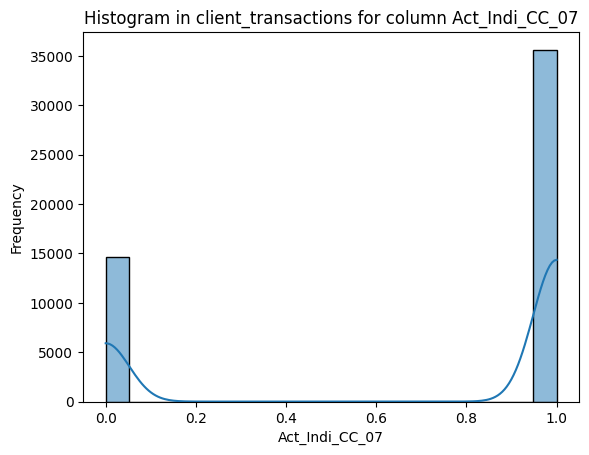

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=568320;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=711459;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

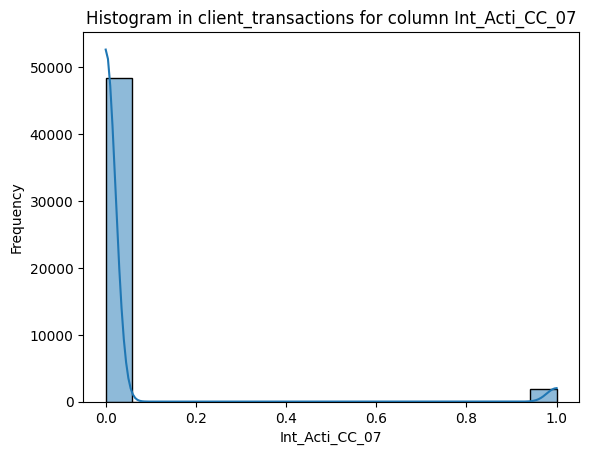

[12/07/24 15:22:01] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=92403;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=384761;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

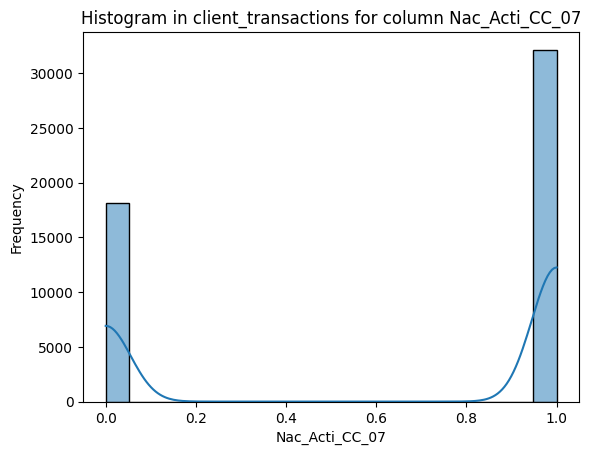

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=690319;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=99044;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

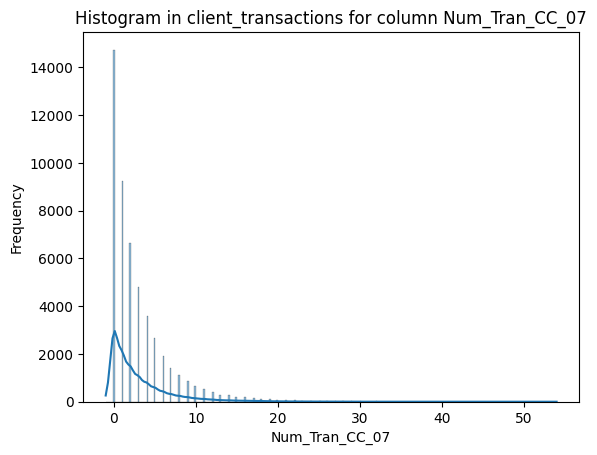

[12/07/24 15:22:02] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=623896;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=226326;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

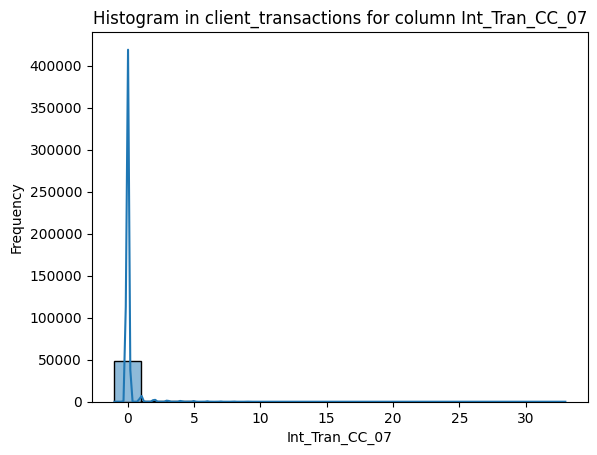

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=408637;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=357466;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

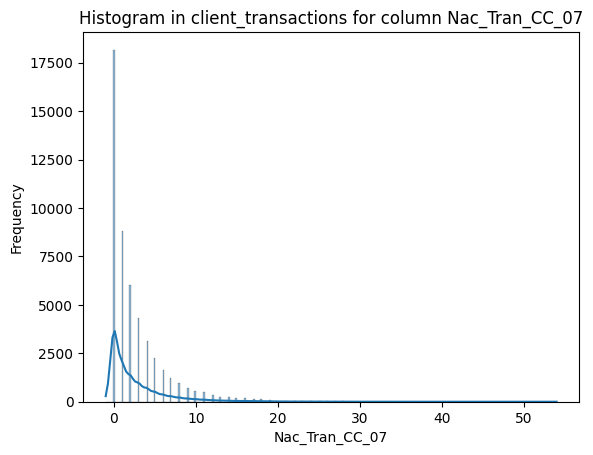

[12/07/24 15:22:03] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=261737;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=243254;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

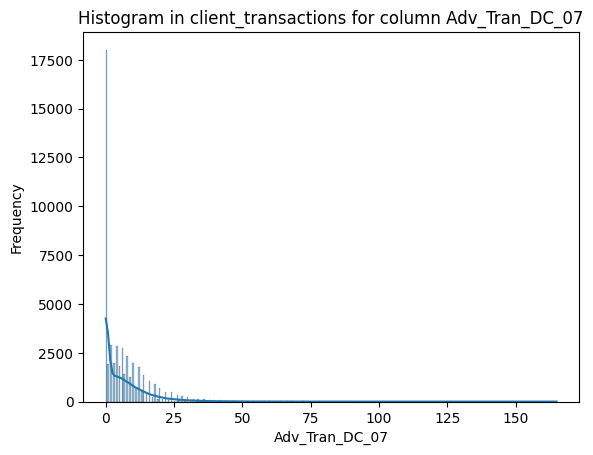

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=888207;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=619169;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

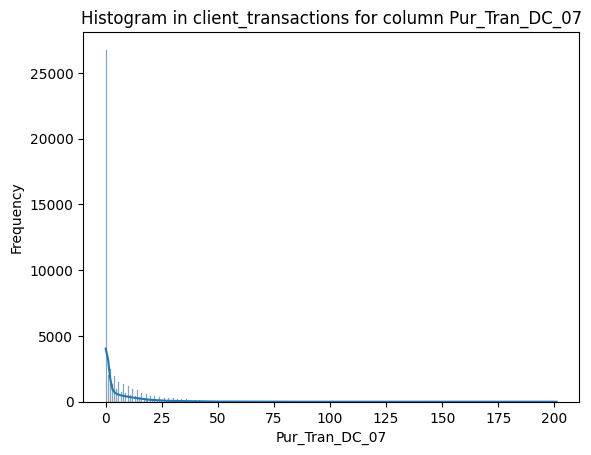

[12/07/24 15:22:04] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=214232;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=548617;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

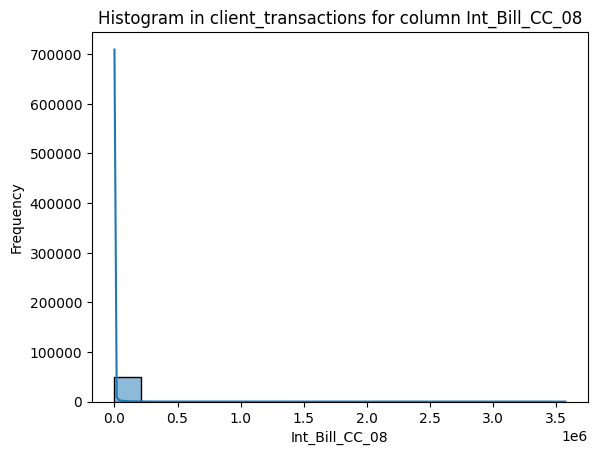

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=218150;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=6475;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

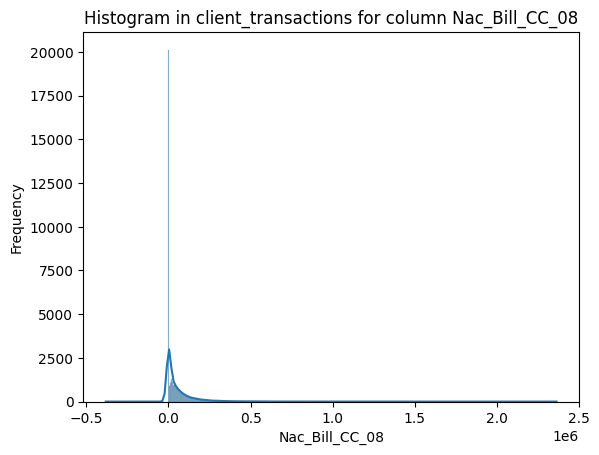

[12/07/24 15:22:05] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=610575;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=181346;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

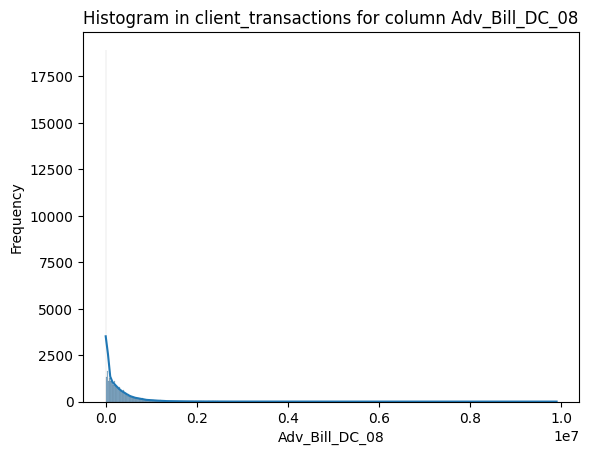

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=376925;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=601029;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

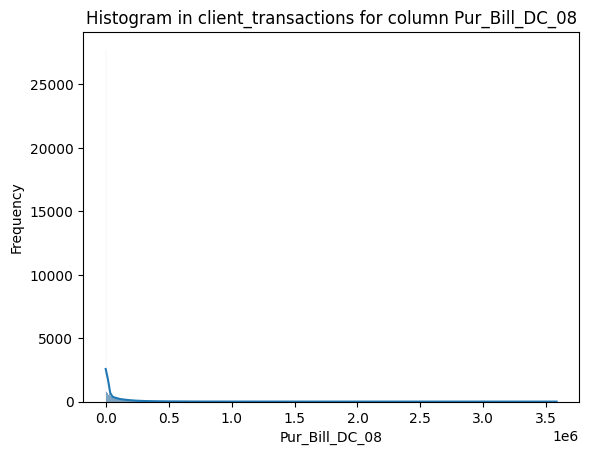

[12/07/24 15:22:07] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=136339;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=100839;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

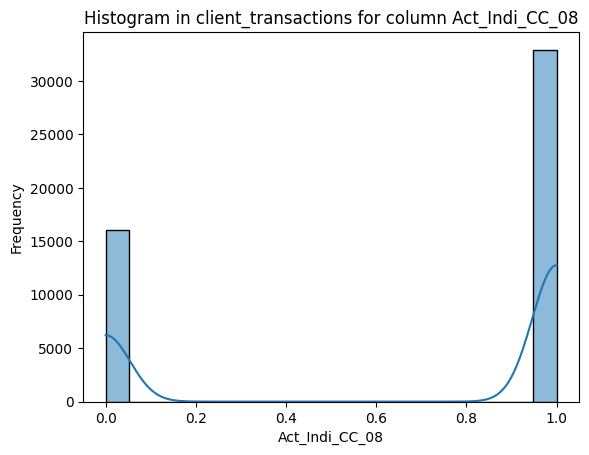

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=544839;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=530531;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

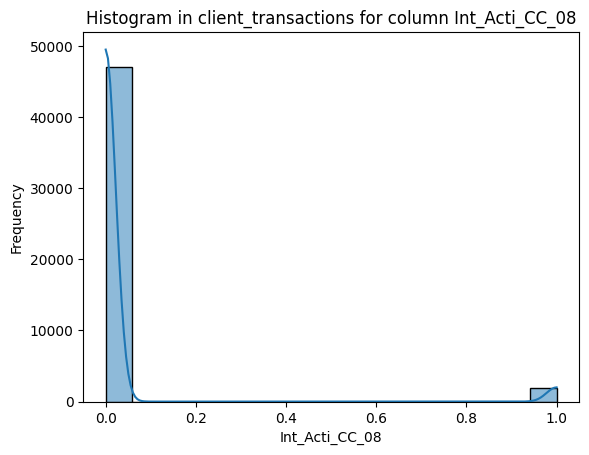

[12/07/24 15:22:08] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=425103;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=851084;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

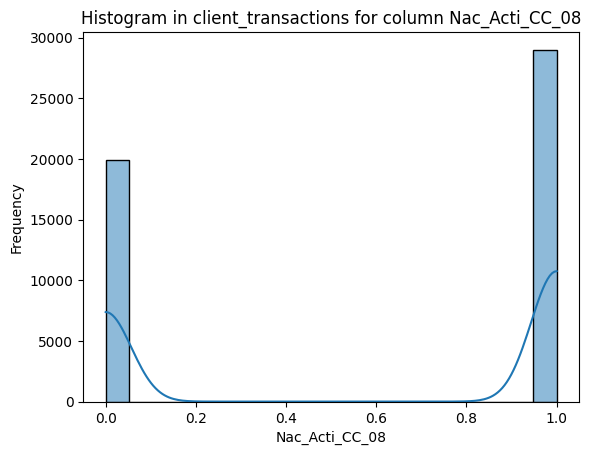

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=115482;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=961368;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

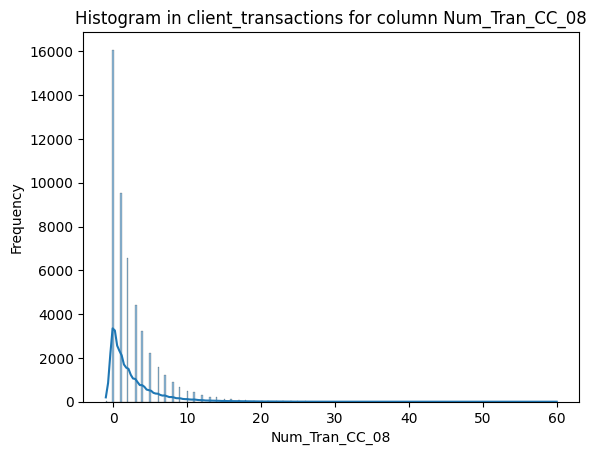

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=451664;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=359589;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

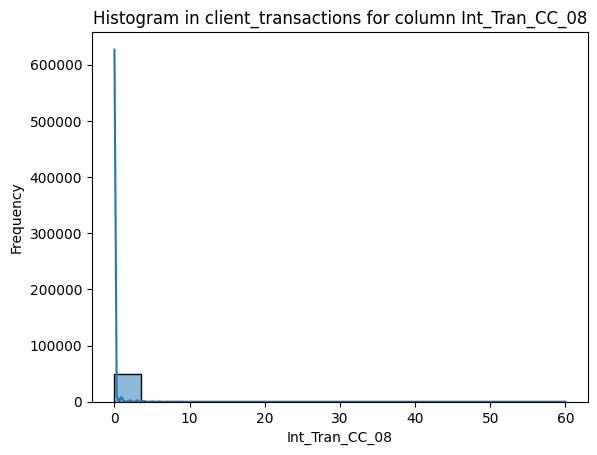

[12/07/24 15:22:09] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=125274;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=335109;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

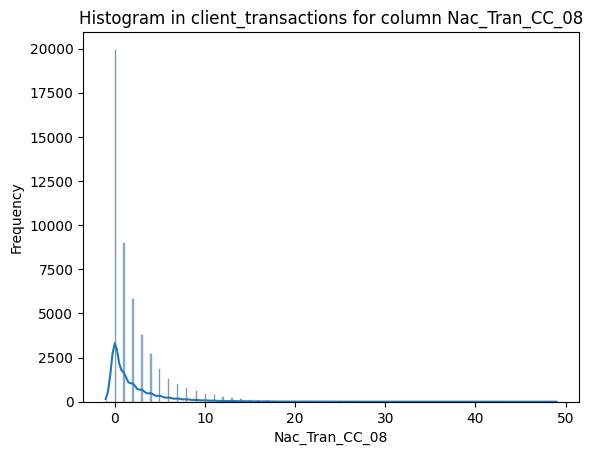

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=356250;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=482038;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

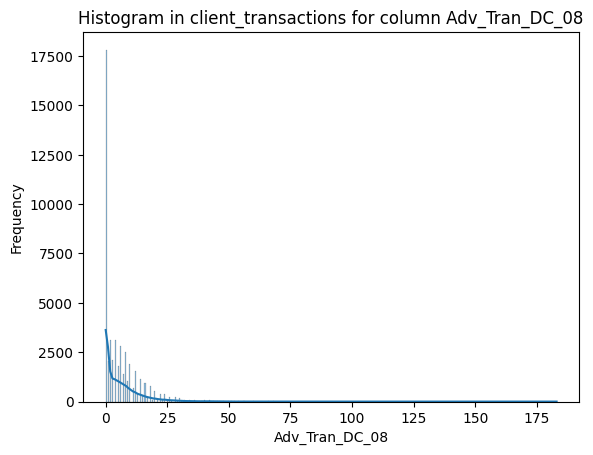

[12/07/24 15:22:10] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=133558;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=4319;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

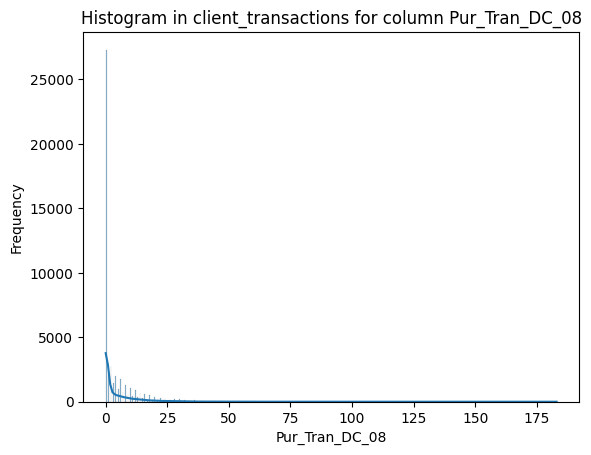

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=853509;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=490870;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

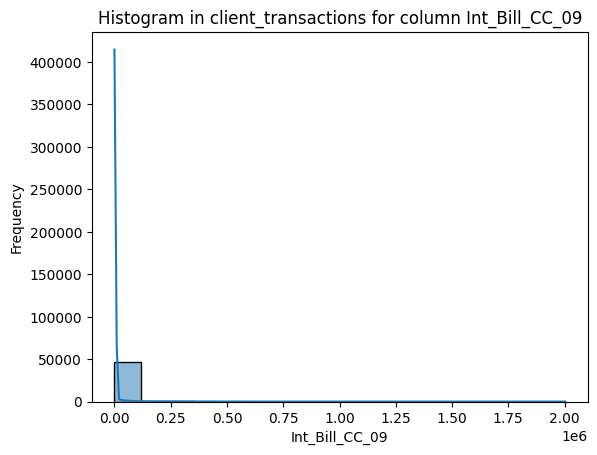

[12/07/24 15:22:11] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=77257;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=755382;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

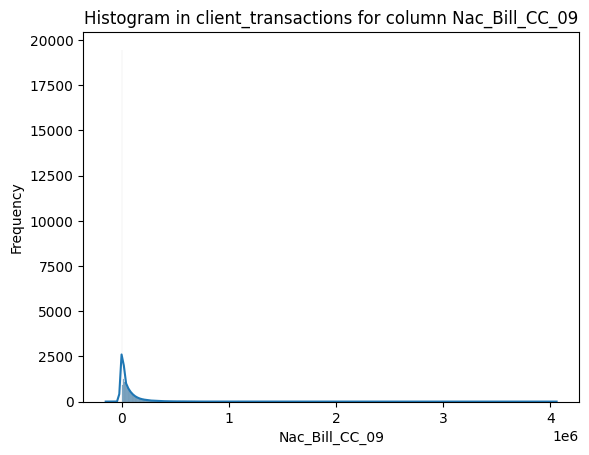

[12/07/24 15:22:12] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=51268;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=702300;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

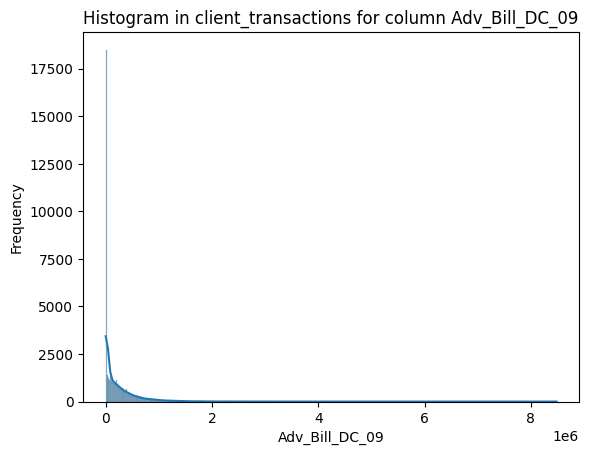

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=737864;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=791521;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

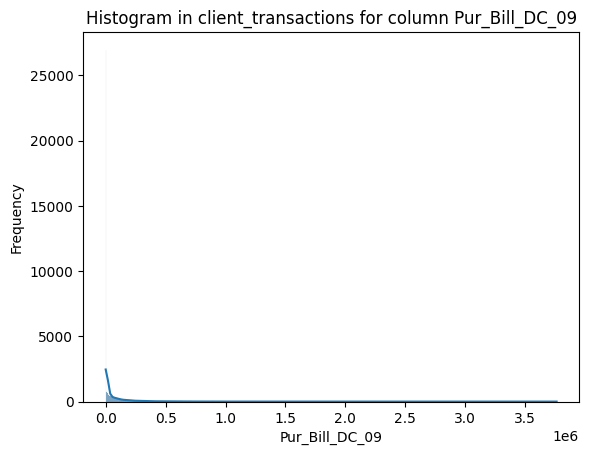

[12/07/24 15:22:13] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=91703;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=118790;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

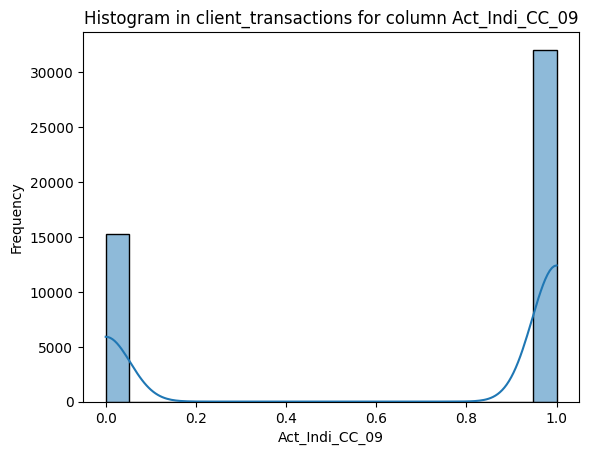

[12/07/24 15:22:14] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=283744;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=7010;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

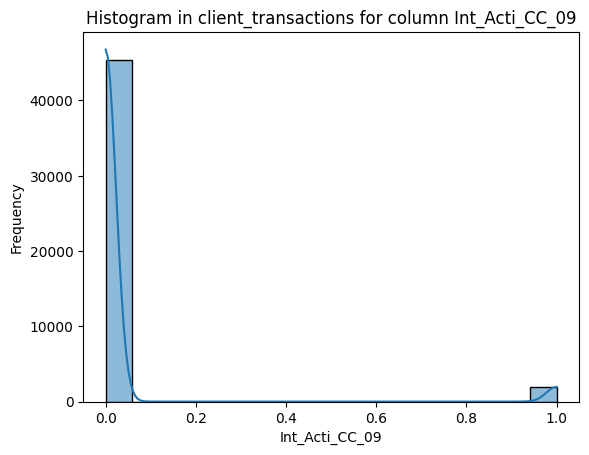

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=307730;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=821024;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

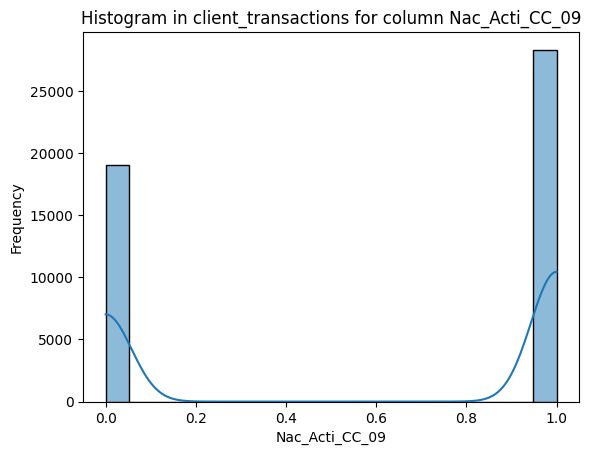

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=250399;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=56255;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

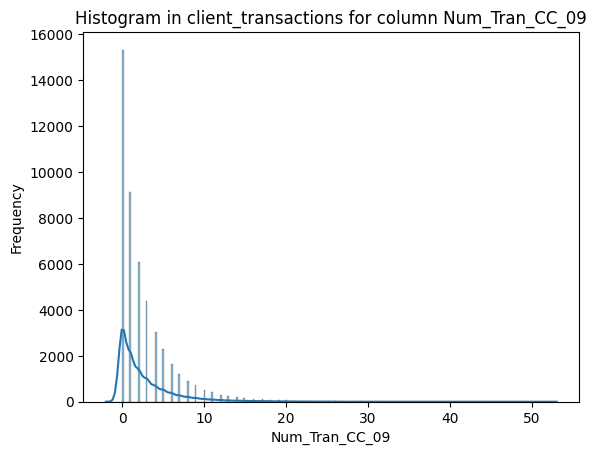

[12/07/24 15:22:15] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=608715;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=684854;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

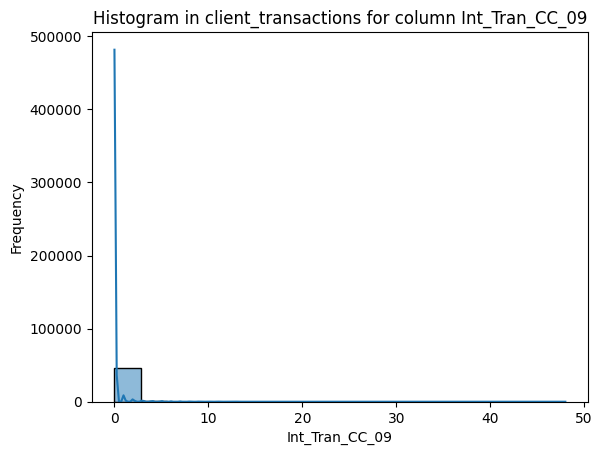

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=896137;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=127567;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

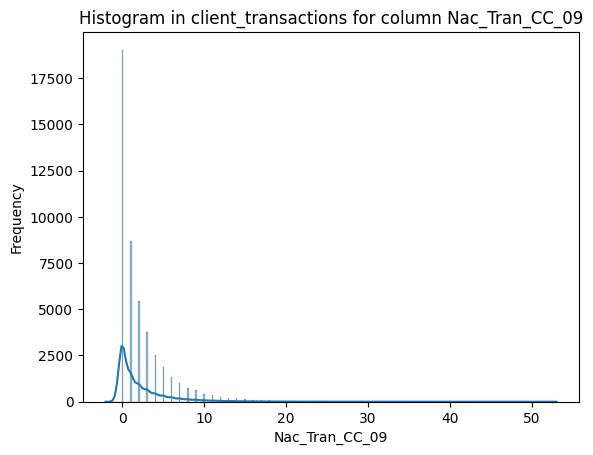

[12/07/24 15:22:16] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=426883;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=505118;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

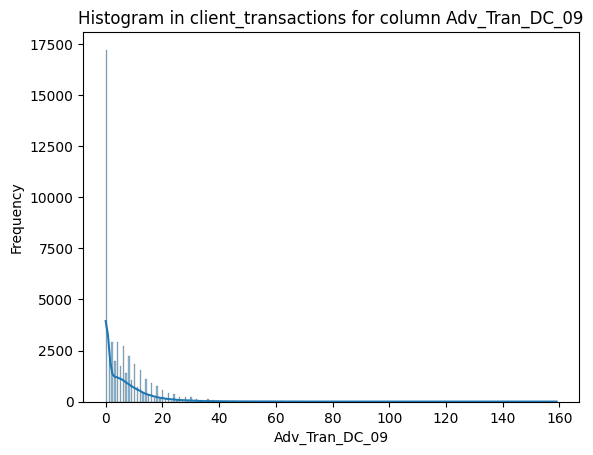

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=172813;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=239617;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

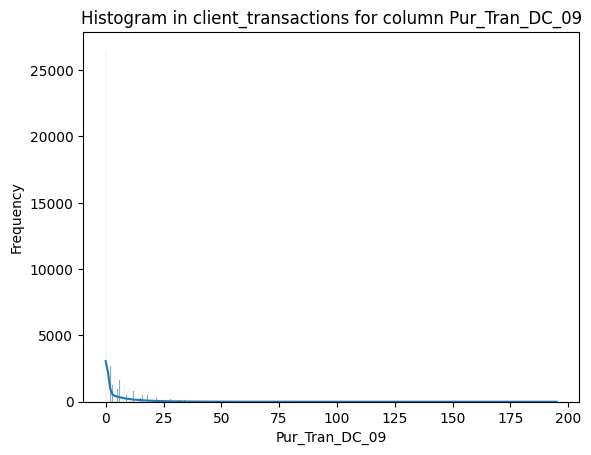

[12/07/24 15:22:17] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=388131;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=939728;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

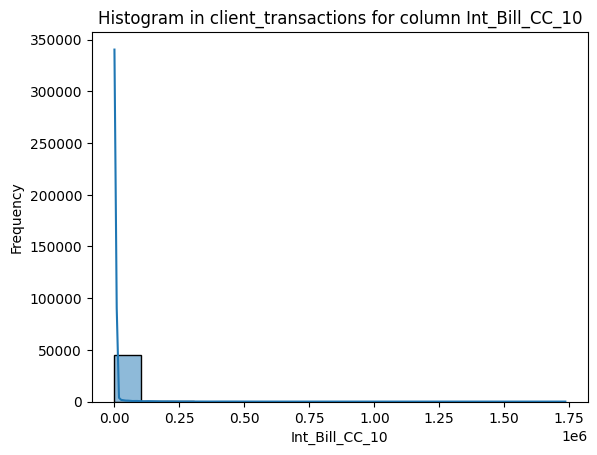

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=84235;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=585575;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

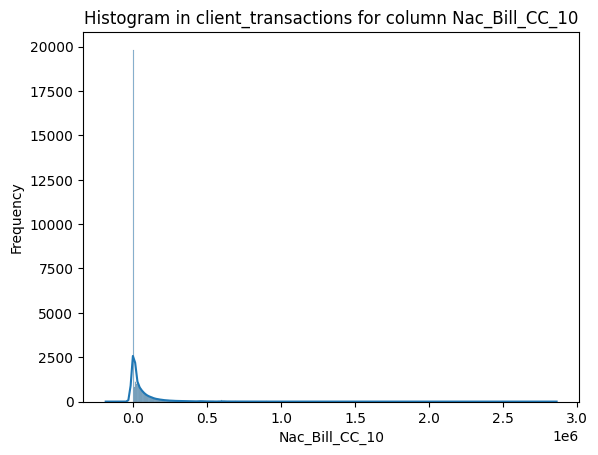

[12/07/24 15:22:18] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=533841;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=997066;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

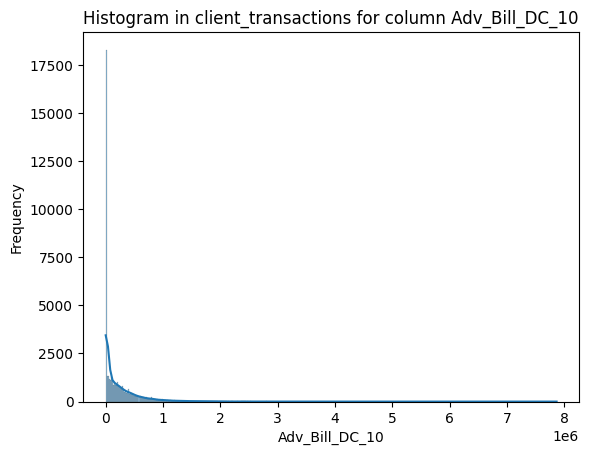

[12/07/24 15:22:19] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=486182;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=896827;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

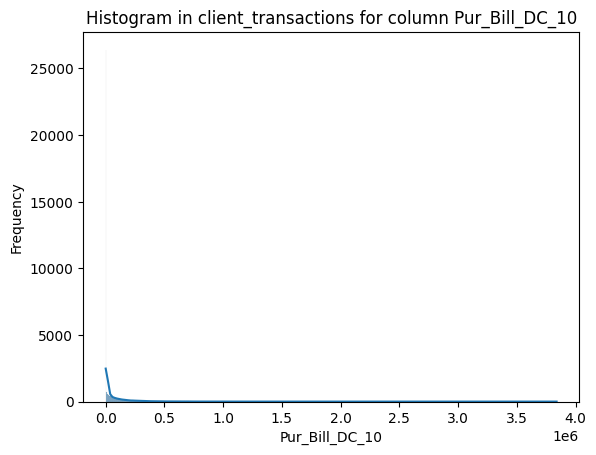

[12/07/24 15:22:20] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=64362;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=590065;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

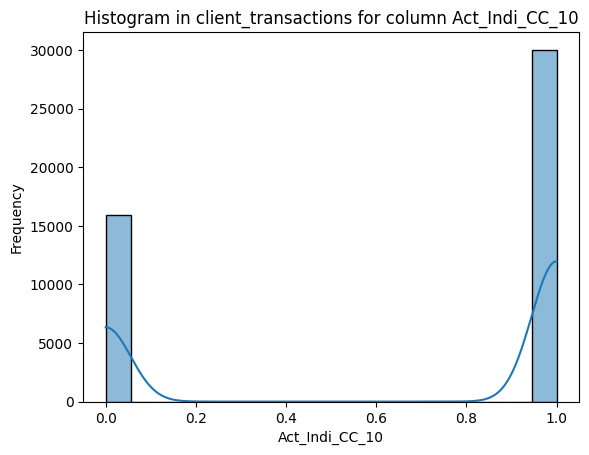

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=40100;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=95763;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

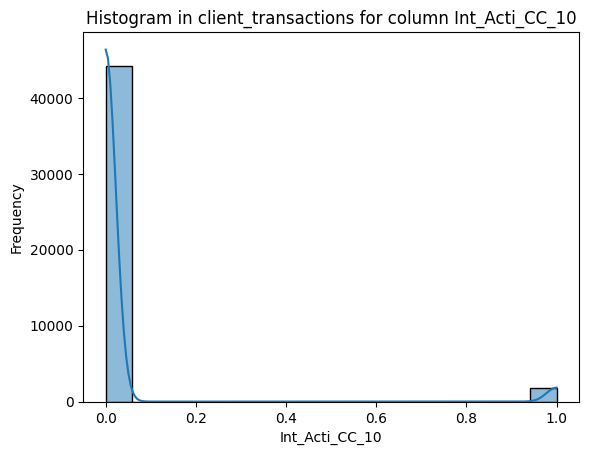

[12/07/24 15:22:21] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=476690;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=581139;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

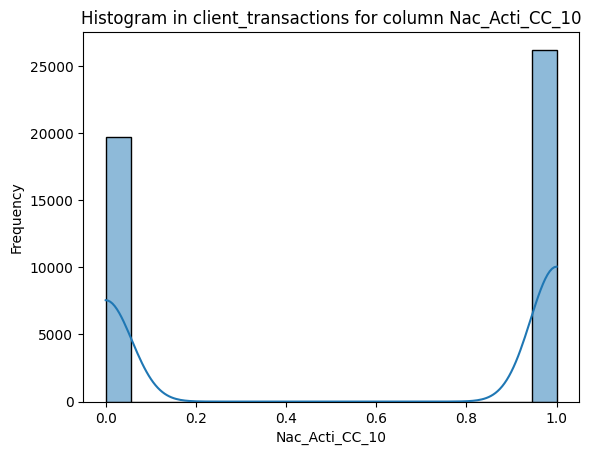

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=339210;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=640838;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

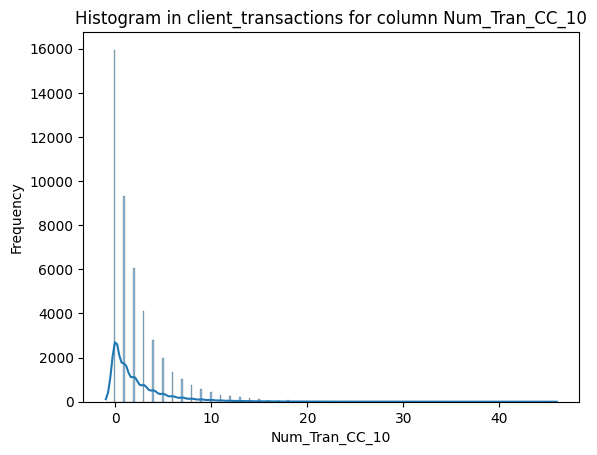

[12/07/24 15:22:22] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=597356;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=370314;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

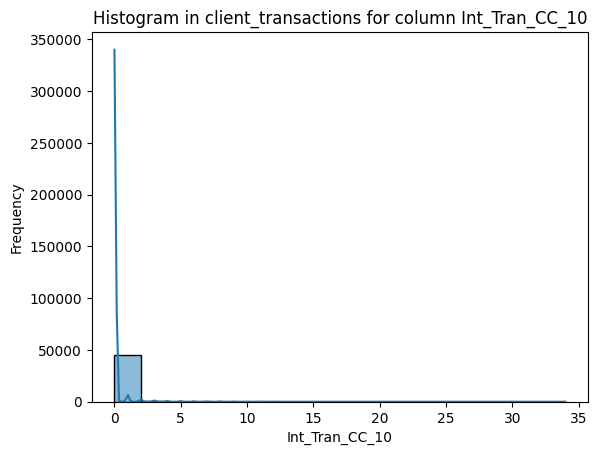

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=30851;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=313112;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

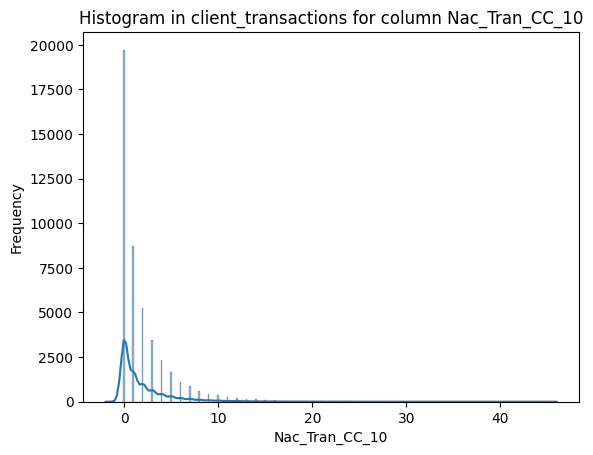

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=915926;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=659531;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

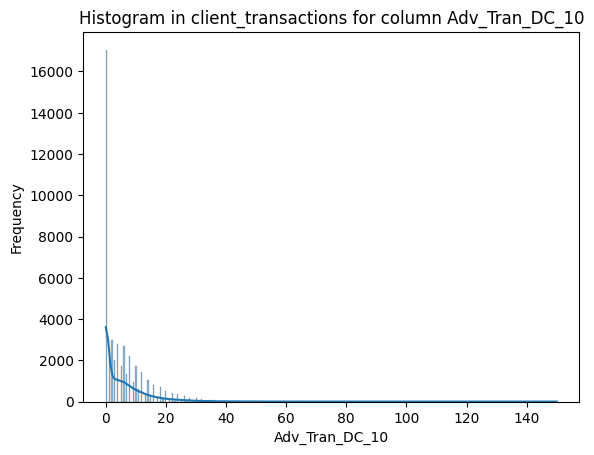

[12/07/24 15:22:23] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=244397;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=885310;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

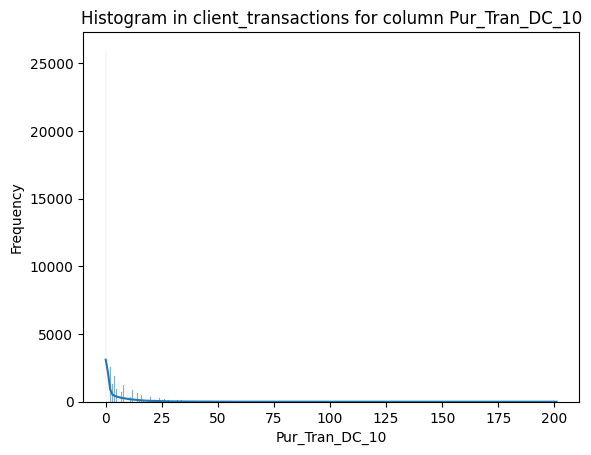

[12/07/24 15:22:24] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=898607;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=142562;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

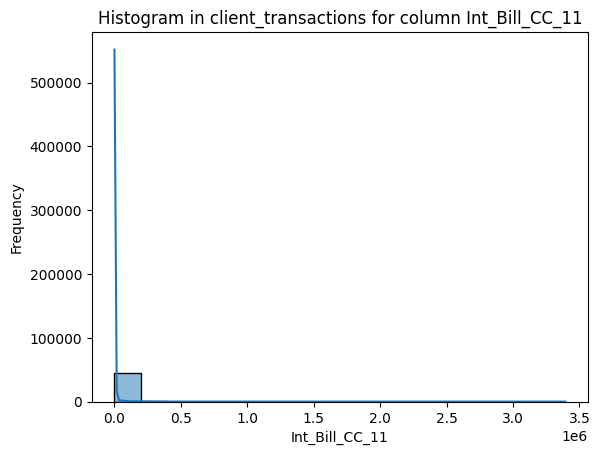

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=666793;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=170779;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

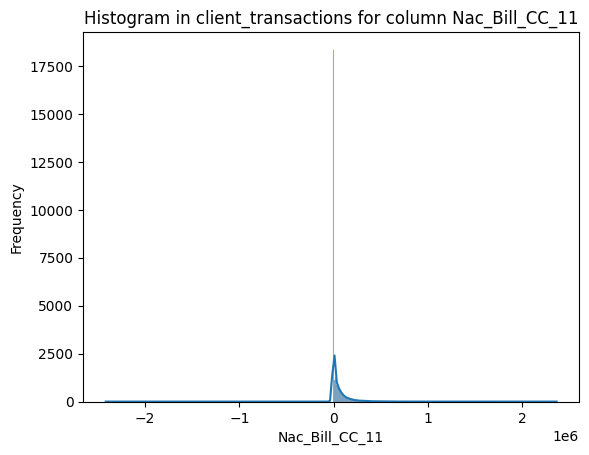

[12/07/24 15:22:25] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=791841;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=747650;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

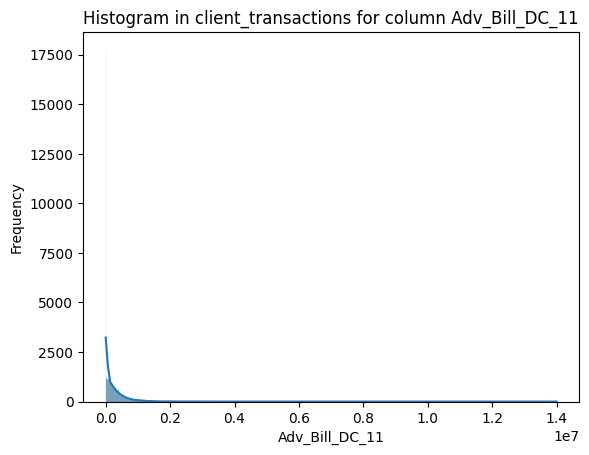

[12/07/24 15:22:26] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=912243;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=999289;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

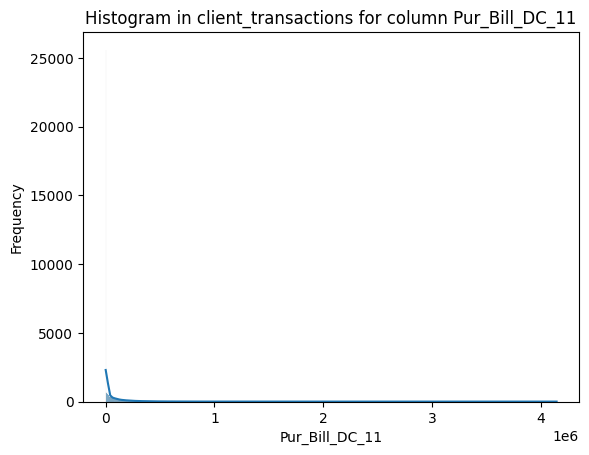

[12/07/24 15:22:27] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=49139;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=629362;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

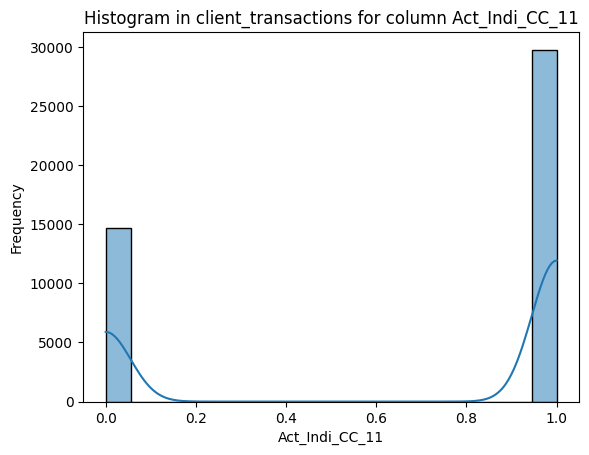

[12/07/24 15:22:28] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=370525;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=822209;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

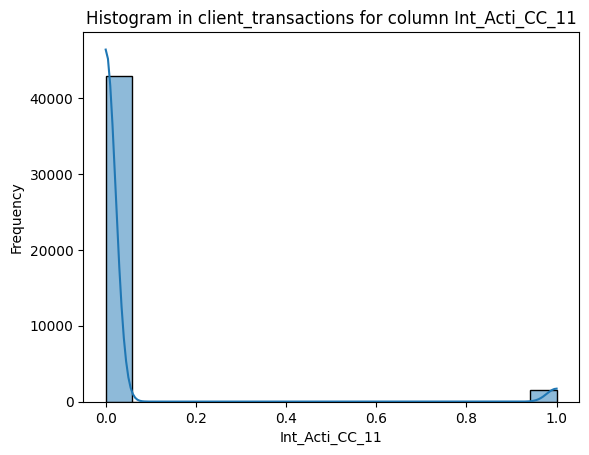

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=521509;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=24666;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

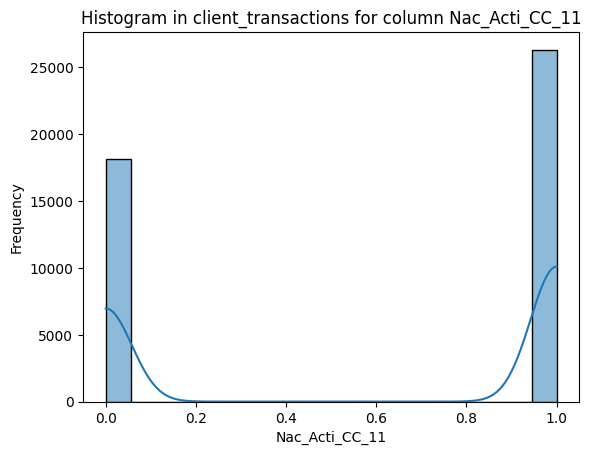

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=65970;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=579117;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

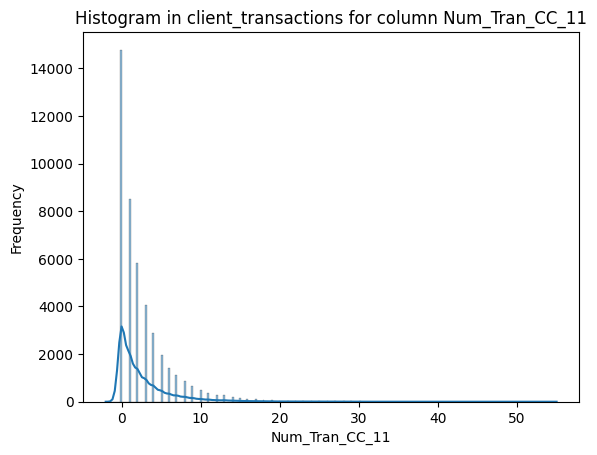

[12/07/24 15:22:29] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=946365;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=202267;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

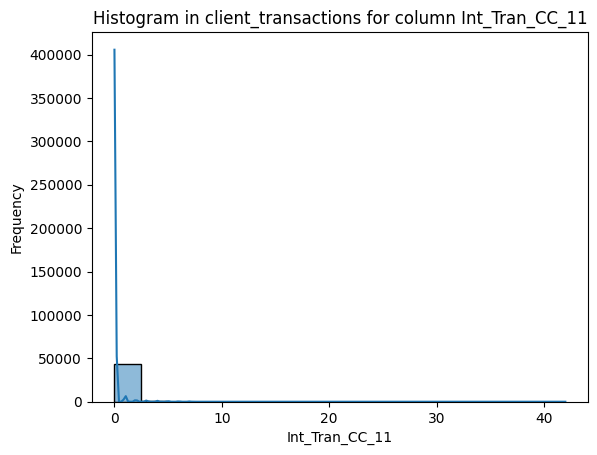

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=513262;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=404001;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

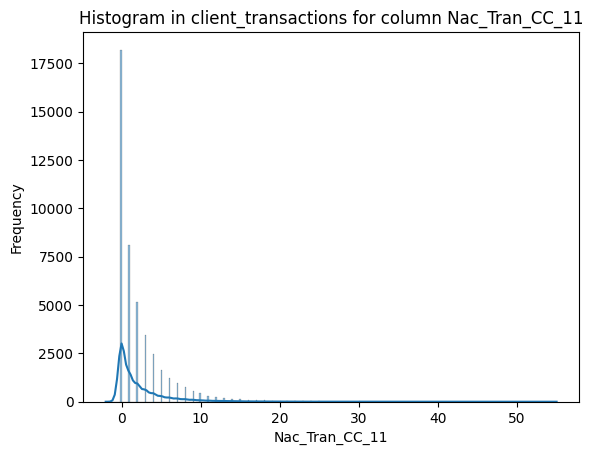

[12/07/24 15:22:30] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=425420;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=953816;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

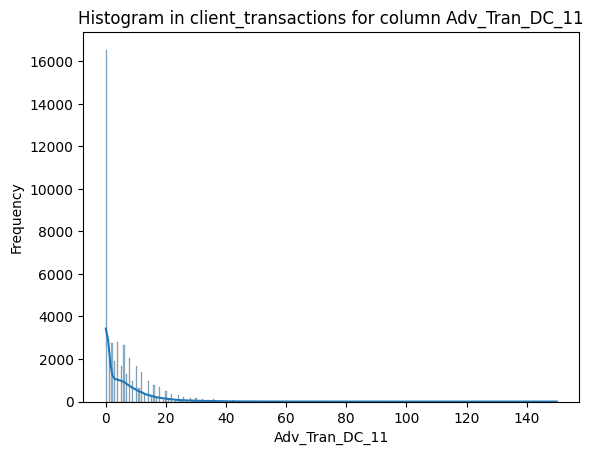

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=268643;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=402601;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

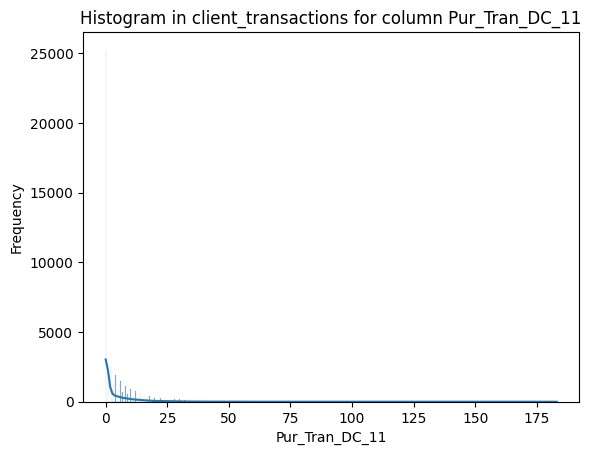

[12/07/24 15:22:31] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=984429;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=325725;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

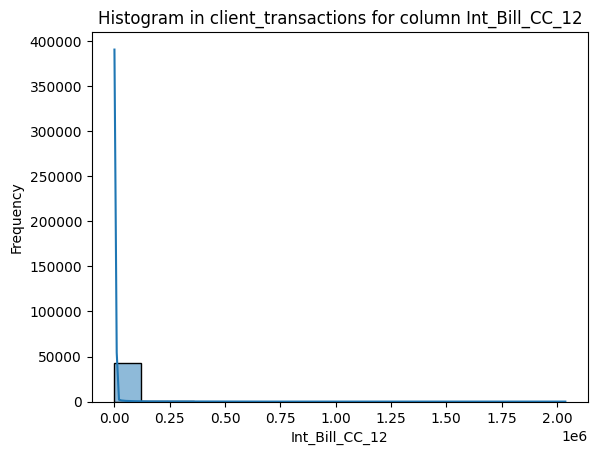

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=126881;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=585384;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

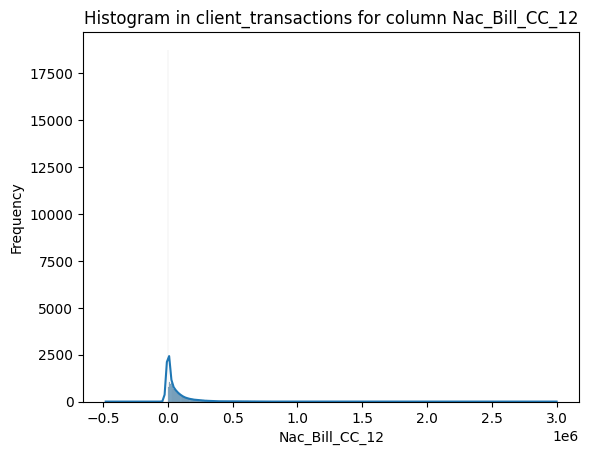

[12/07/24 15:22:32] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=194204;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=842184;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

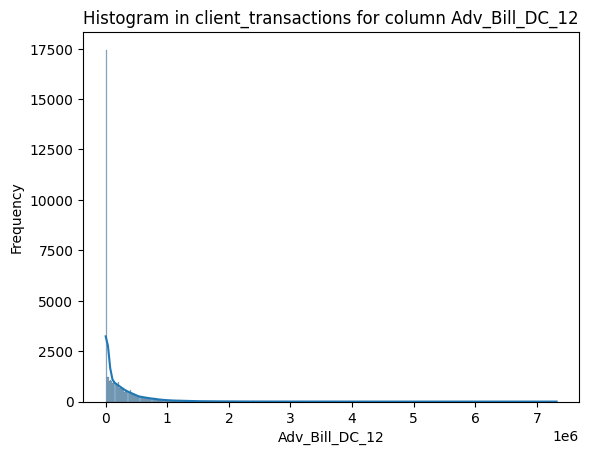

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=670463;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=953280;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

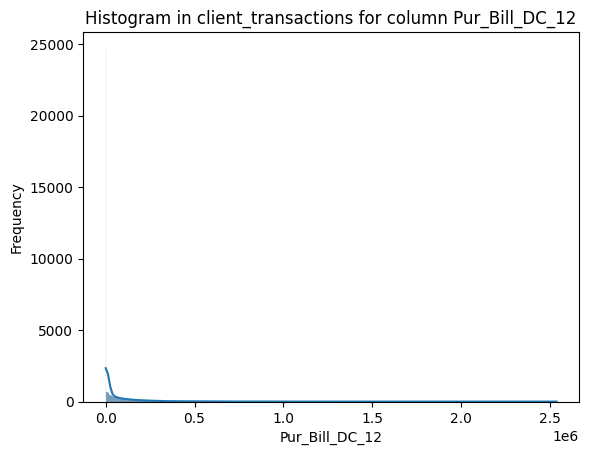

[12/07/24 15:22:33] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=408885;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=154583;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

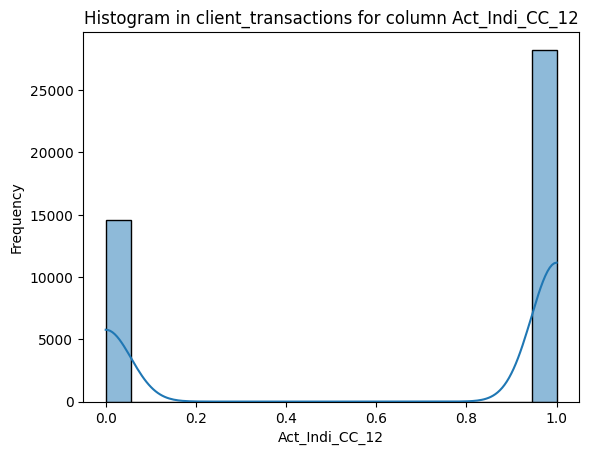

[12/07/24 15:22:34] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=333114;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=459803;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

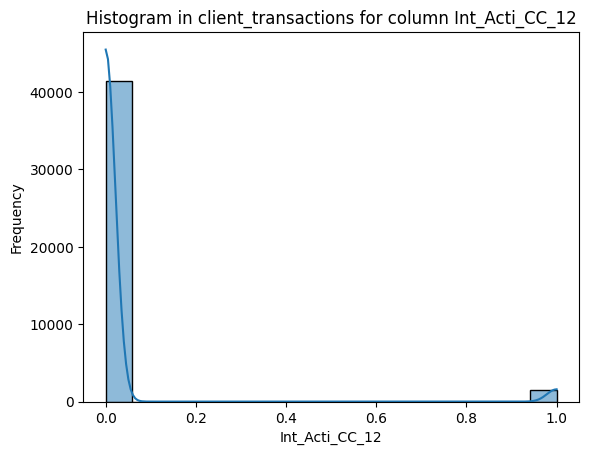

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=140575;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=313470;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

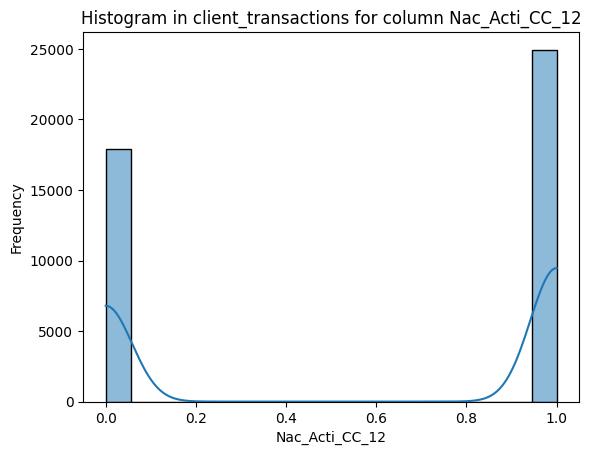

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=395732;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=439334;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

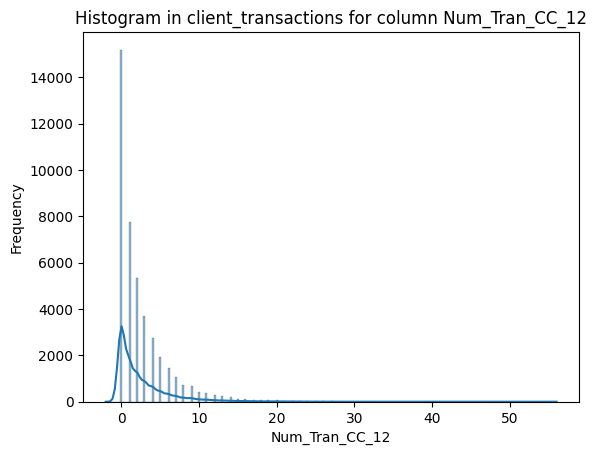

[12/07/24 15:22:35] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=925389;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=341922;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

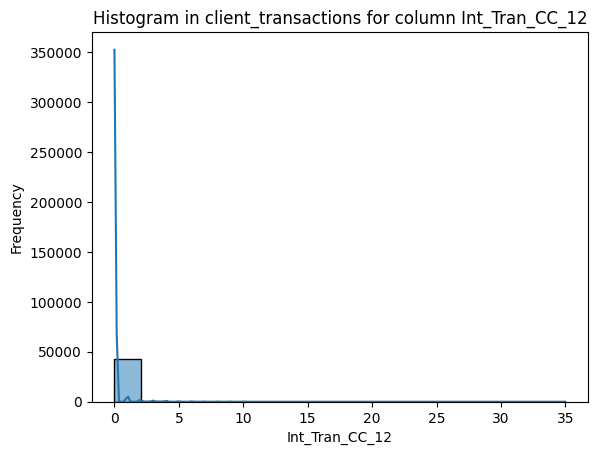

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=725125;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=352956;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

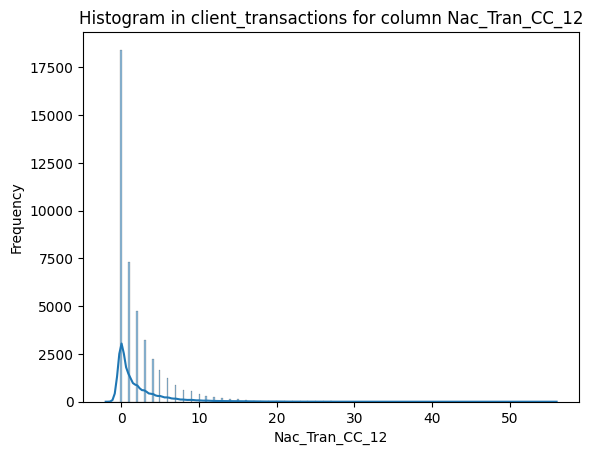

[12/07/24 15:22:36] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=199319;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=505051;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

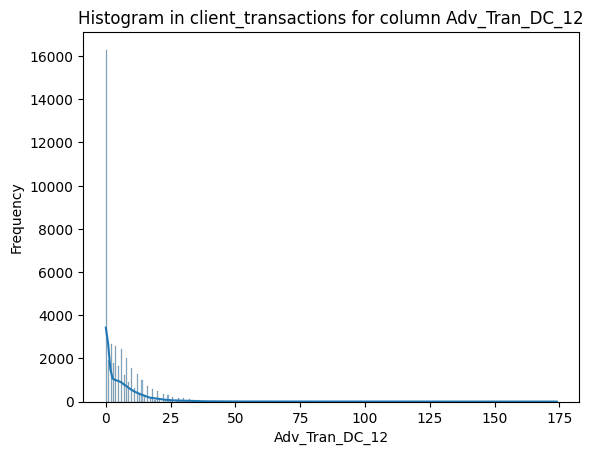

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=128874;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=798412;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

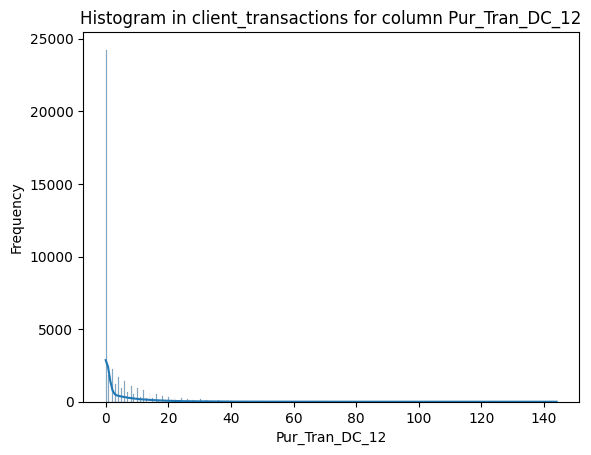

------------------------------------------------------------

----------------------- DataFrame merged_data -----------------------



[12/07/24 15:22:37] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=47596;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=129202;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

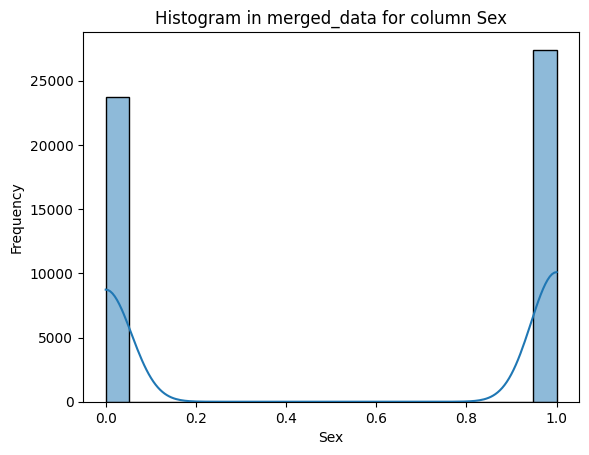

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=661312;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=166725;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

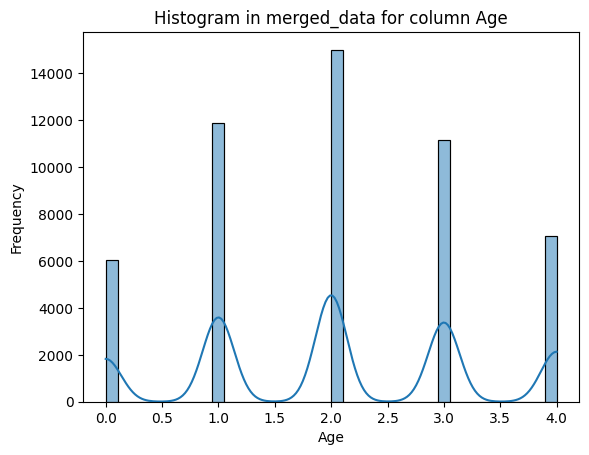

[12/07/24 15:22:38] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=739217;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=325083;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

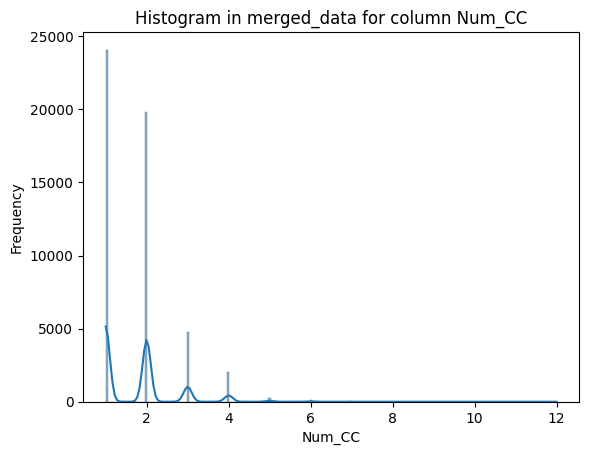

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=130331;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=154948;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

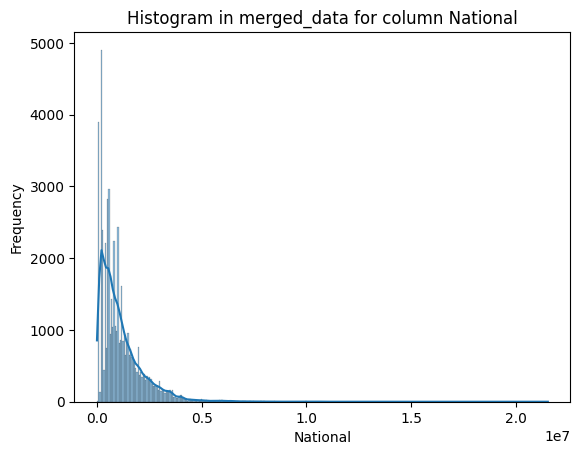

[12/07/24 15:22:39] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=389653;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=929791;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

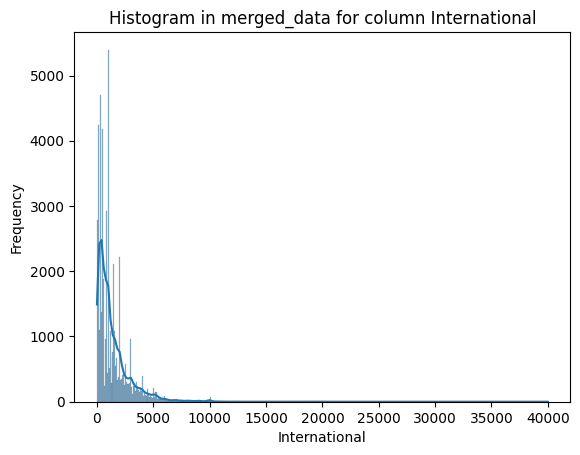

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=482812;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=393642;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

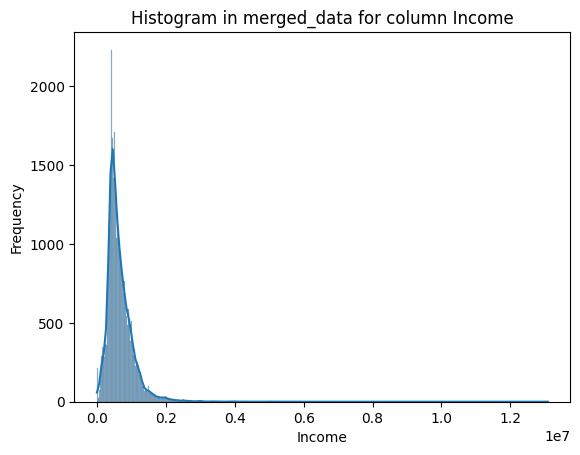

[12/07/24 15:22:40] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=96179;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=29074;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

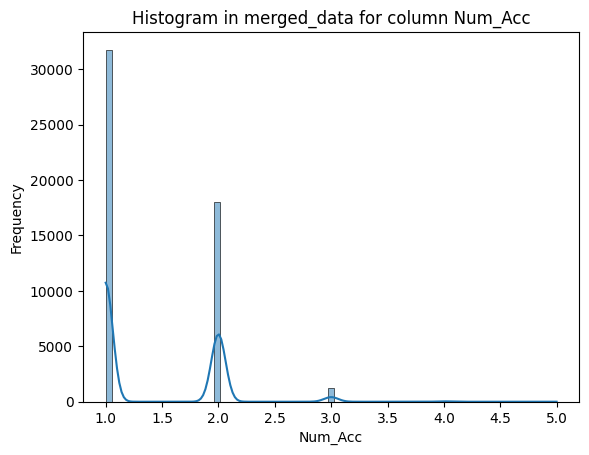

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=413306;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=562448;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

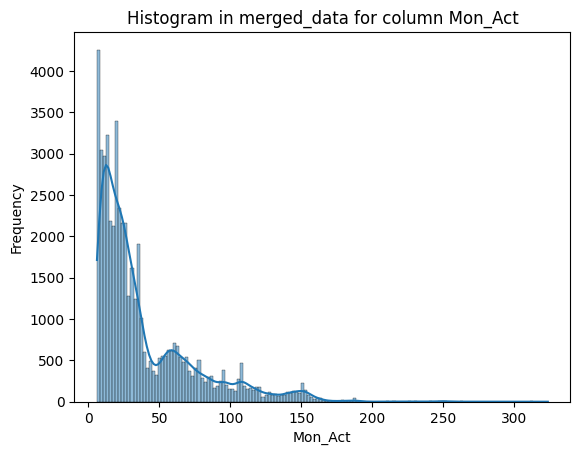

[12/07/24 15:22:41] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=682889;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=940704;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

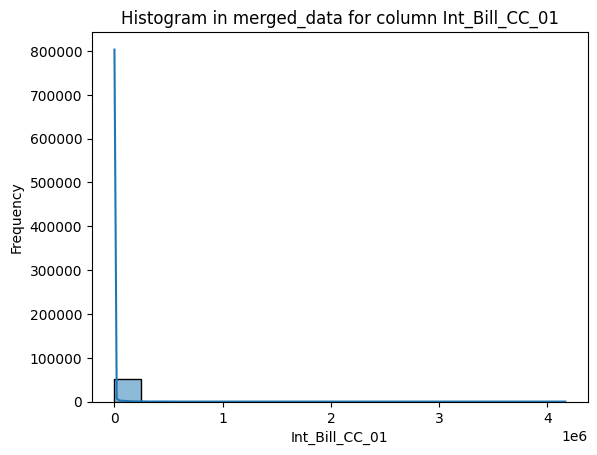

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=597621;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=552496;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

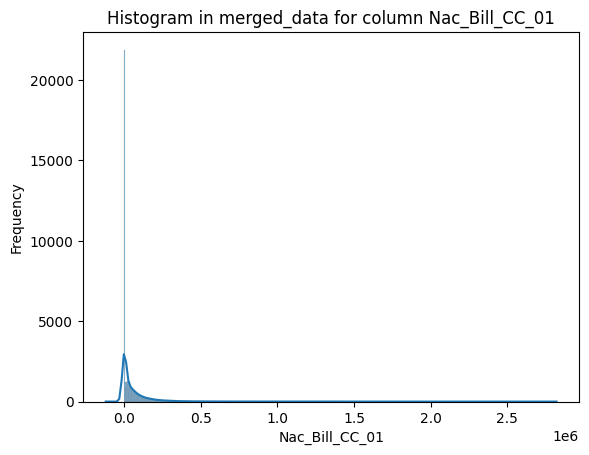

[12/07/24 15:22:42] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=10883;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=764619;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

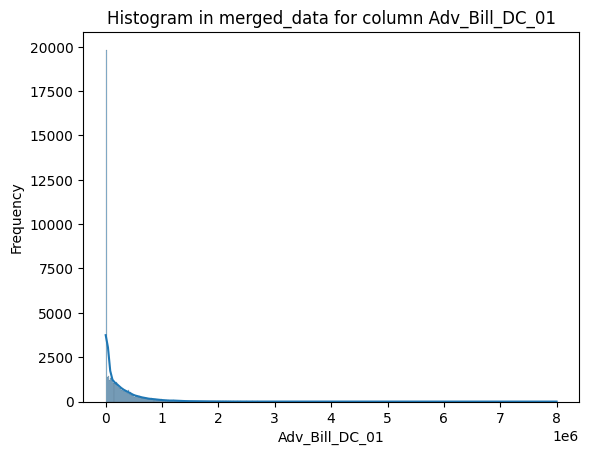

[12/07/24 15:22:43] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=278600;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=337216;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

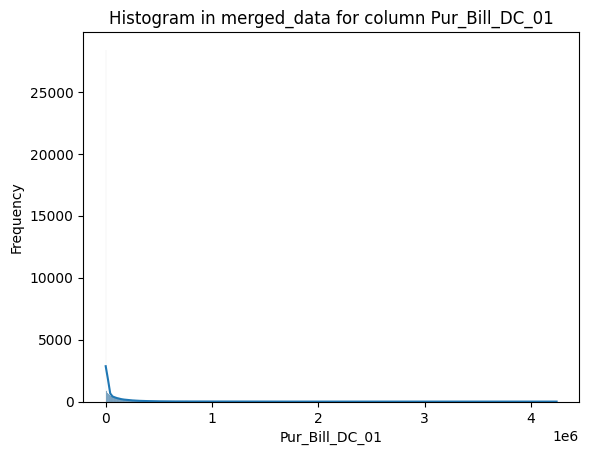

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=455689;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=25898;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

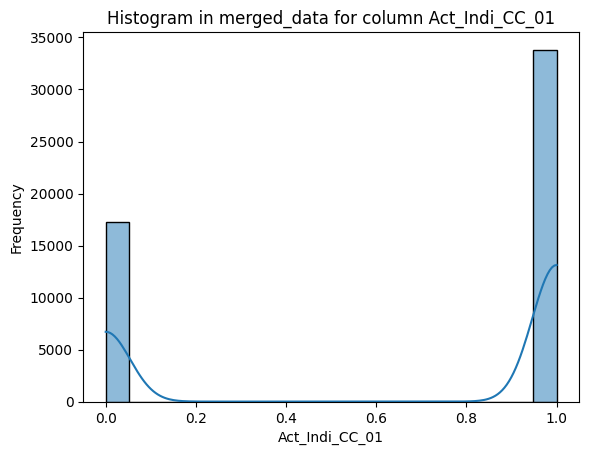

[12/07/24 15:22:44] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=497758;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=93332;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

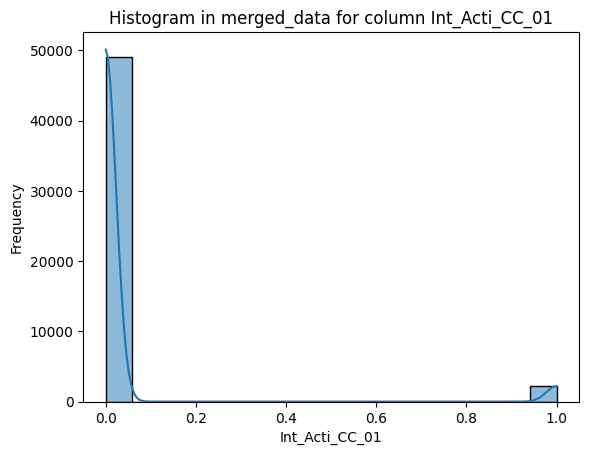

[12/07/24 15:22:45] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=591536;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=694193;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

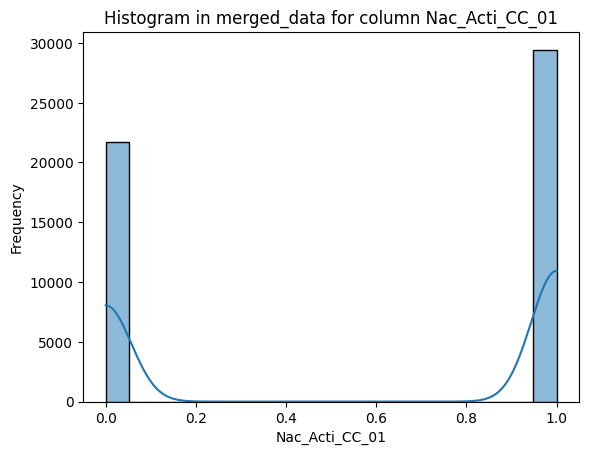

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=172570;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=164099;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

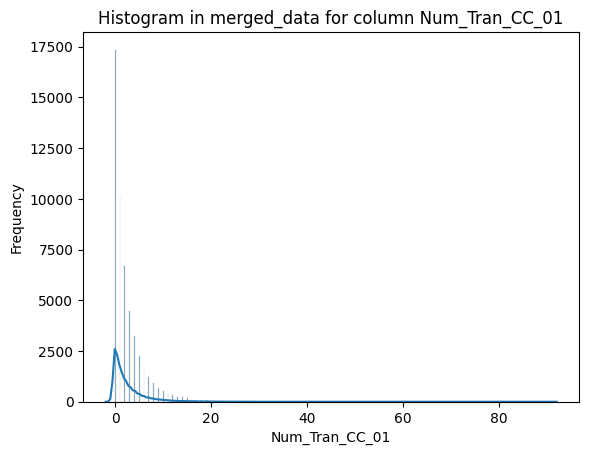

[12/07/24 15:22:46] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=38593;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=841610;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

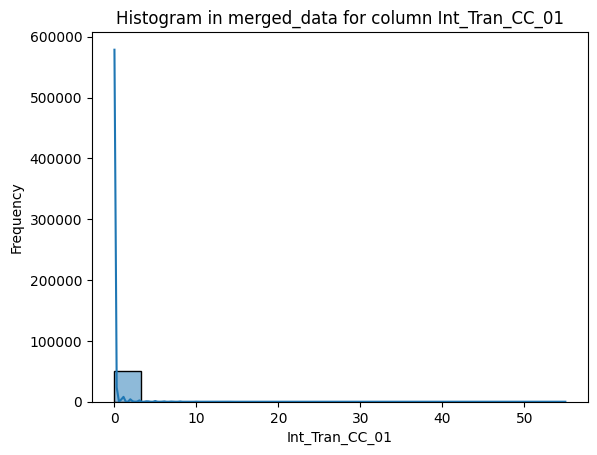

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=878129;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=779500;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

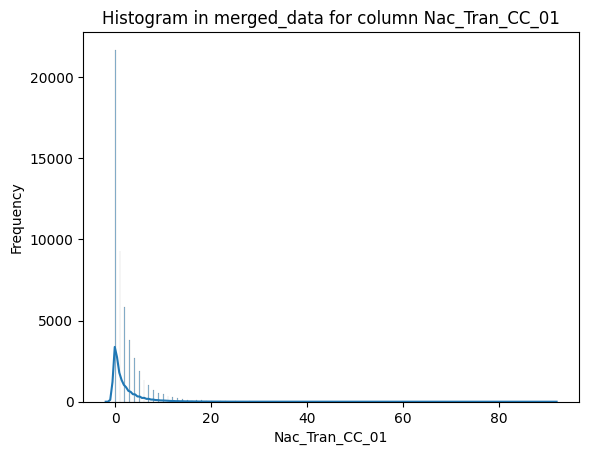

[12/07/24 15:22:47] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=496022;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=173288;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

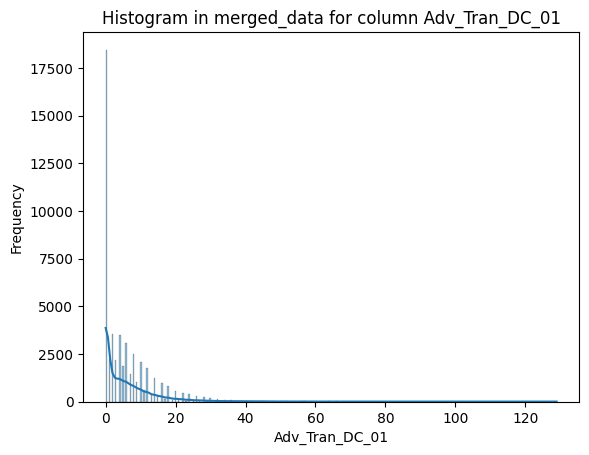

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=80507;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=702026;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

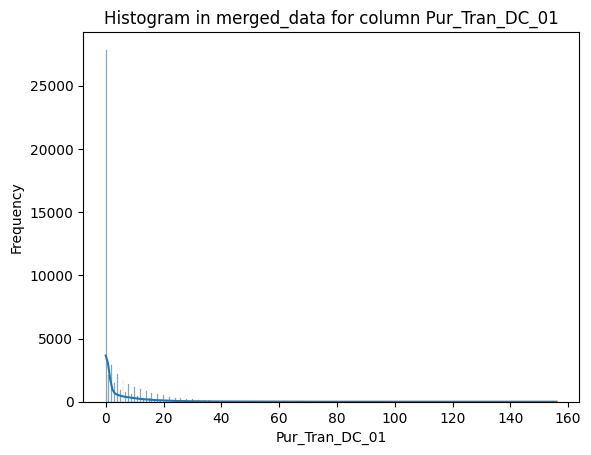

[12/07/24 15:22:48] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=111541;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=840094;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

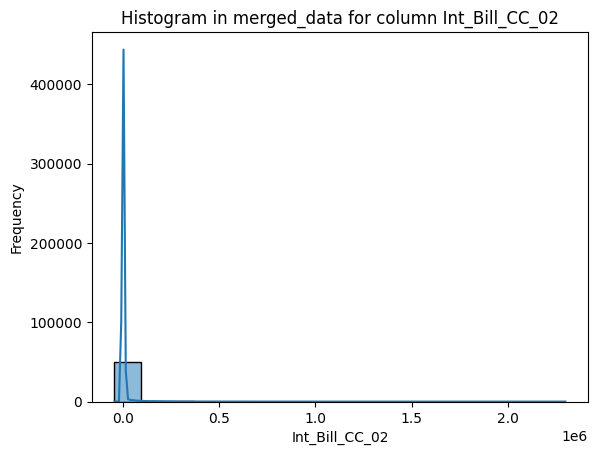

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=792608;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=950629;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

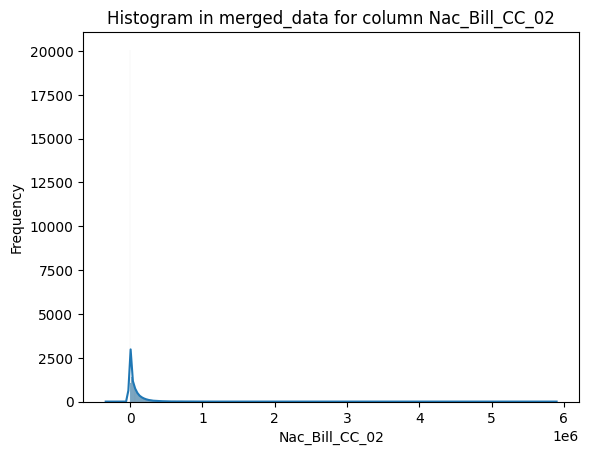

[12/07/24 15:22:49] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=690042;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=219531;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

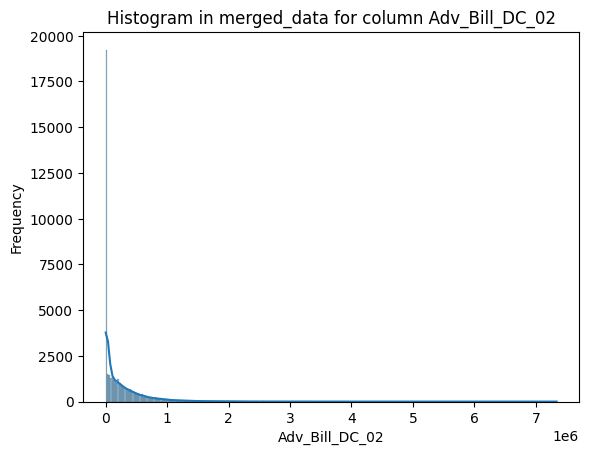

[12/07/24 15:22:50] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=878493;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=707291;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

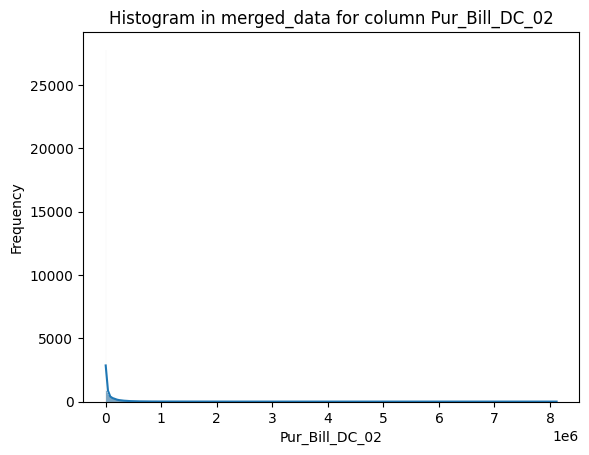

[12/07/24 15:22:52] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=167707;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=411092;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

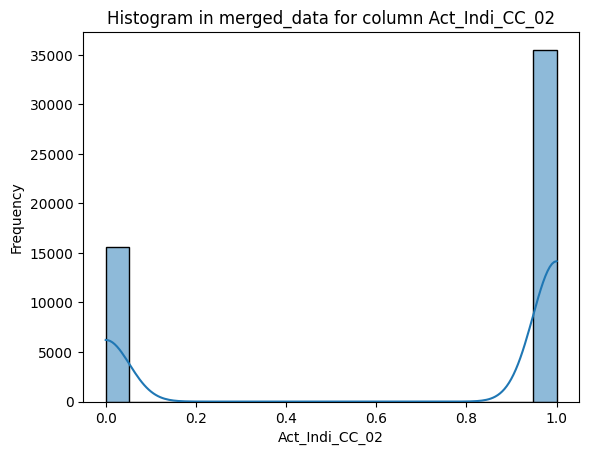

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=928908;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=366861;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

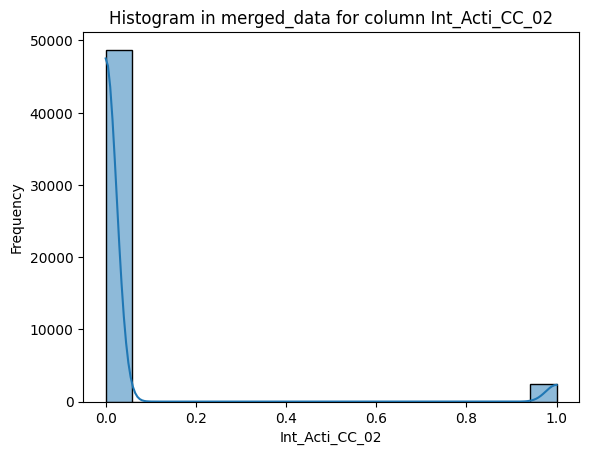

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=42870;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=249438;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

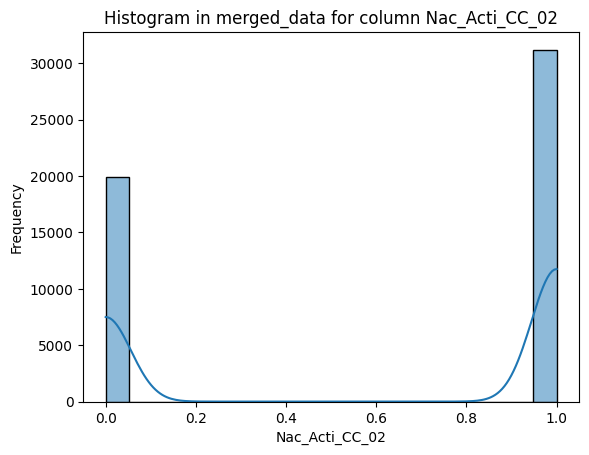

[12/07/24 15:22:53] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=645953;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=793113;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

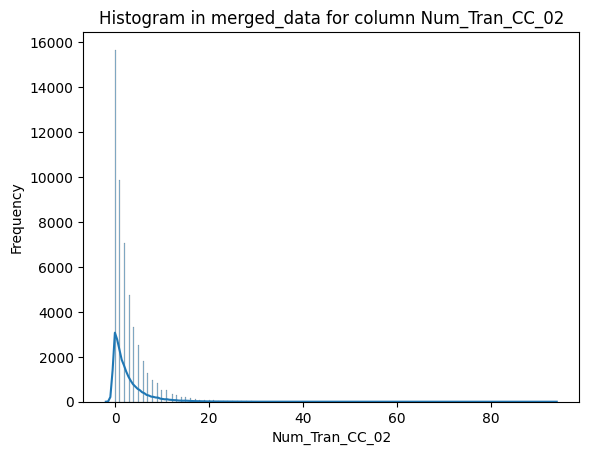

[12/07/24 15:22:54] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=964965;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=329015;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

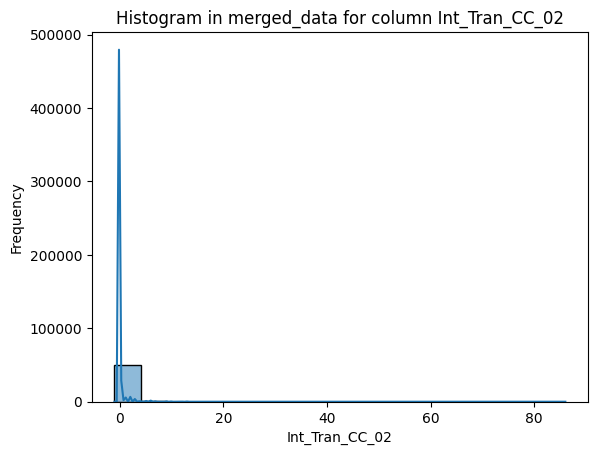

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=781465;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=737052;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

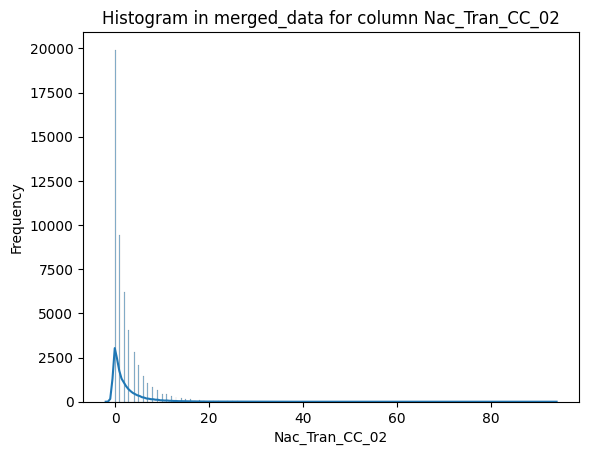

[12/07/24 15:22:55] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=743081;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=887825;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

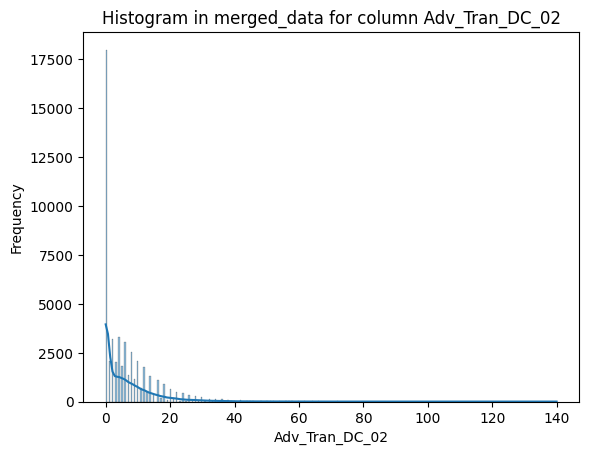

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=137351;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=59580;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

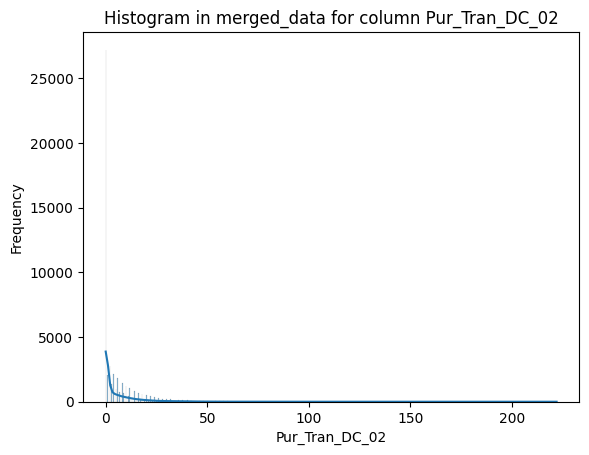

[12/07/24 15:22:56] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=460009;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=40557;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

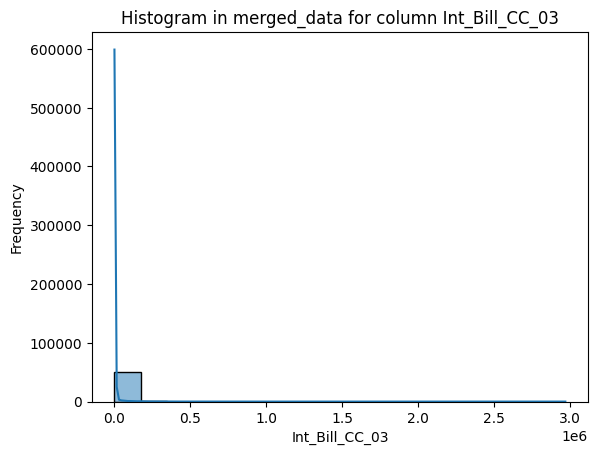

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=690726;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=166989;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

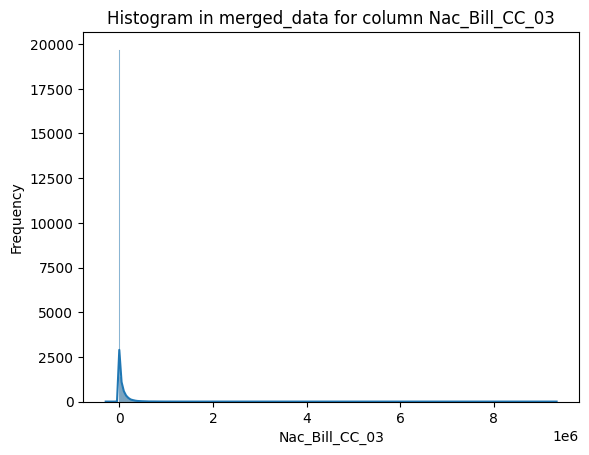

[12/07/24 15:22:58] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=804731;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=363890;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

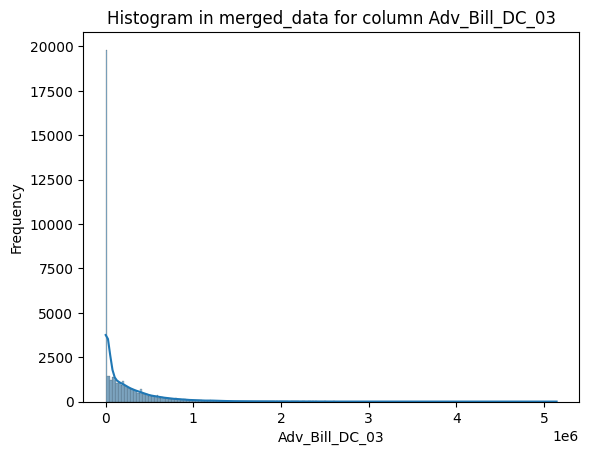

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=557261;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=364943;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

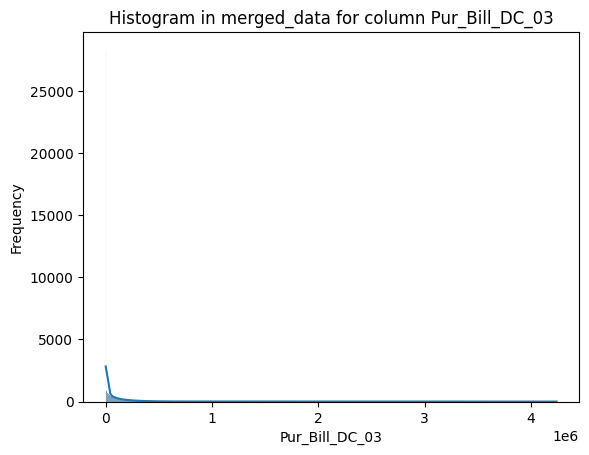

[12/07/24 15:22:59] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=384393;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=494630;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

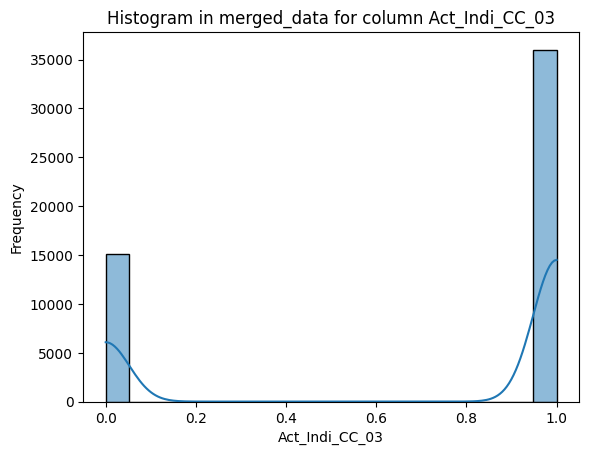

[12/07/24 15:23:00] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=188760;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=989439;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

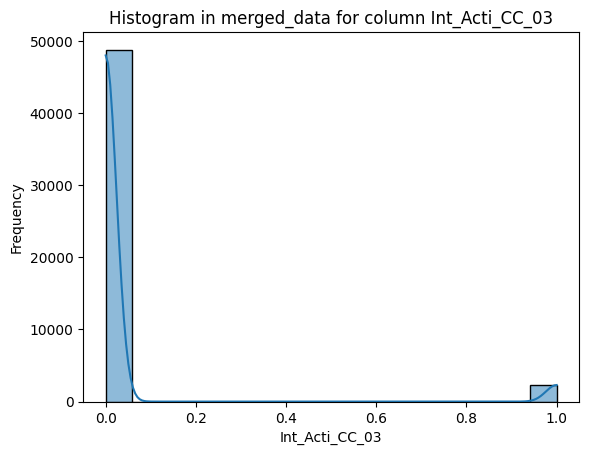

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=728768;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=223450;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

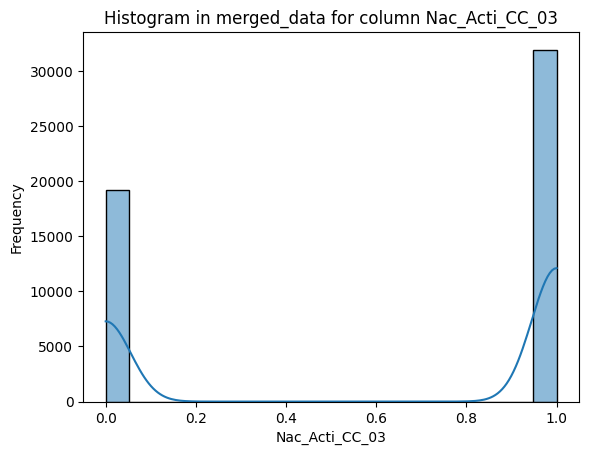

[12/07/24 15:23:01] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=954379;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=829913;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

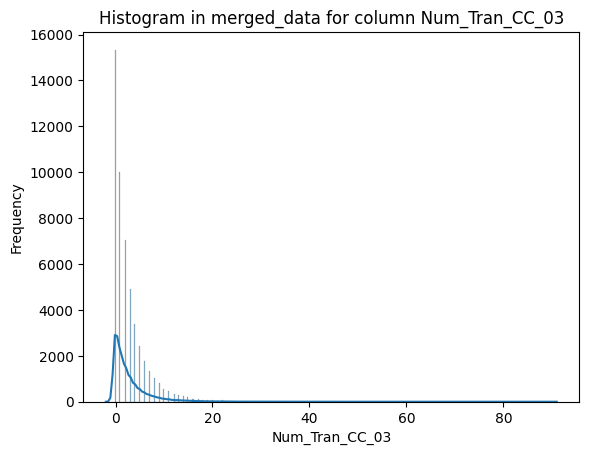

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=565952;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=852242;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

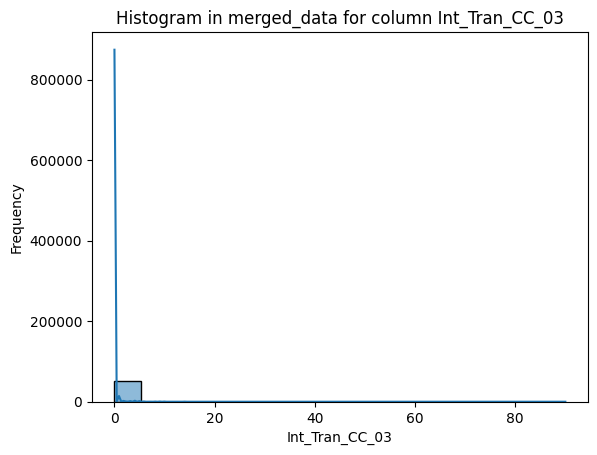

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=713559;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=732292;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

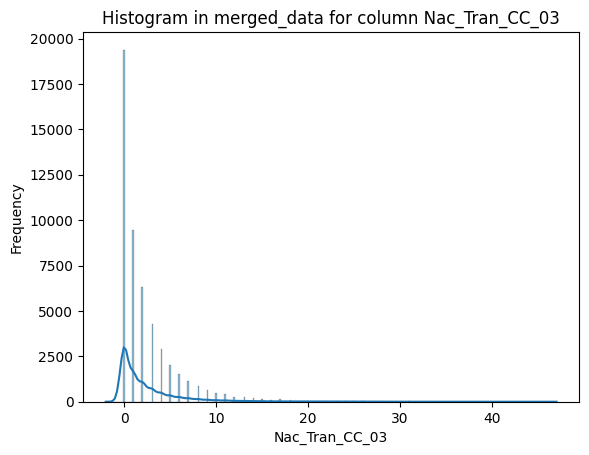

[12/07/24 15:23:02] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=774543;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=241625;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

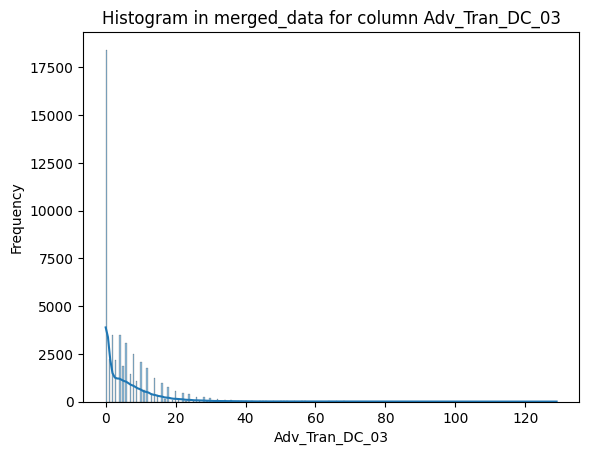

[12/07/24 15:23:03] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=747483;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=668280;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

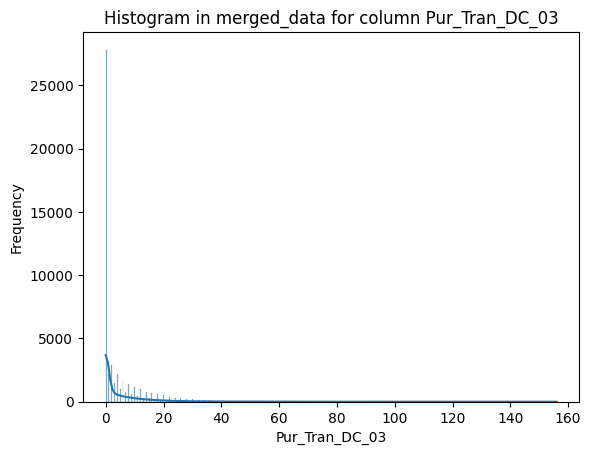

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=345377;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=417340;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

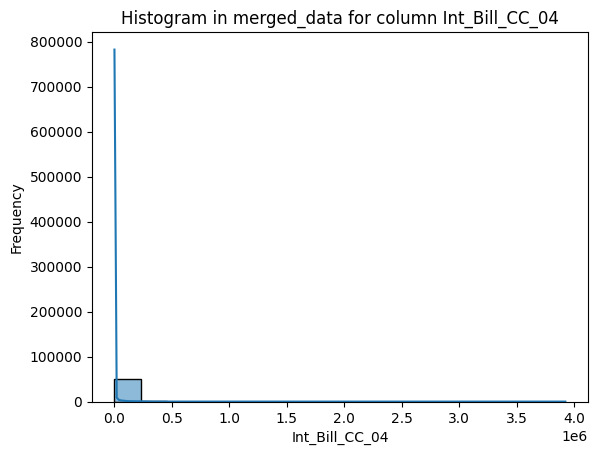

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=563274;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=879669;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

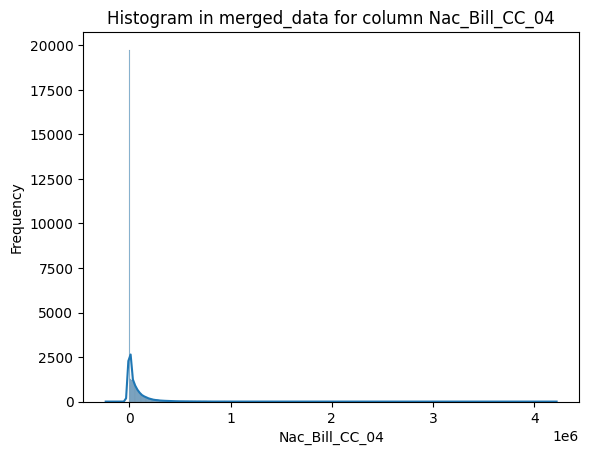

[12/07/24 15:23:04] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=938855;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=916692;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

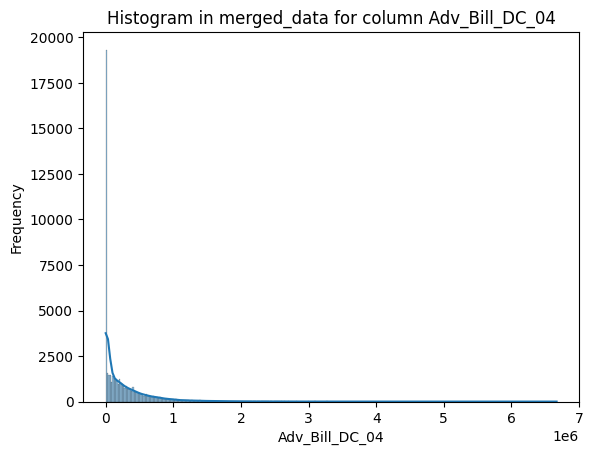

[12/07/24 15:23:05] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=871296;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=301975;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

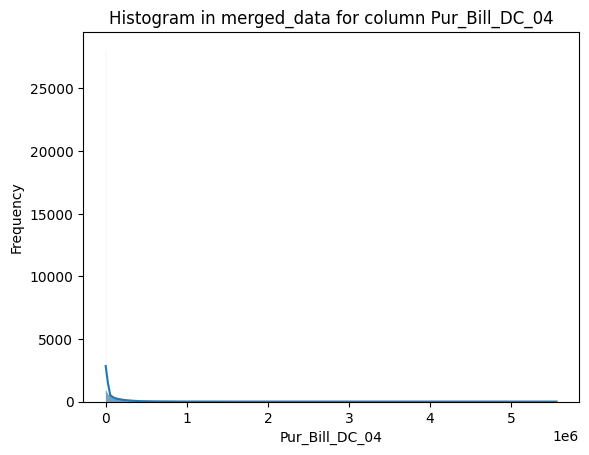

[12/07/24 15:23:06] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=264658;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=444843;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

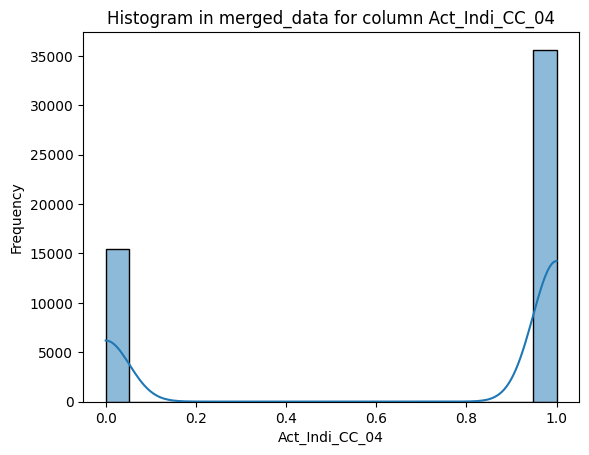

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=675213;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=570273;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

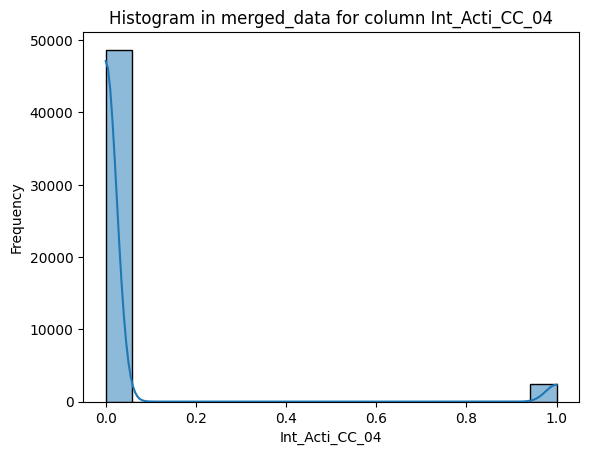

[12/07/24 15:23:07] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=302532;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=702313;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

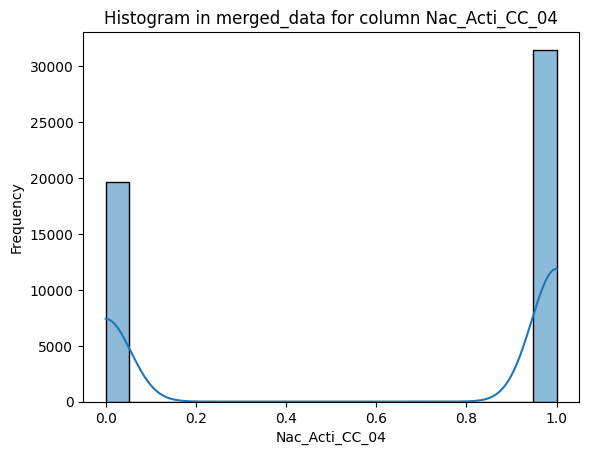

[12/07/24 15:23:08] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=629762;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=198860;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

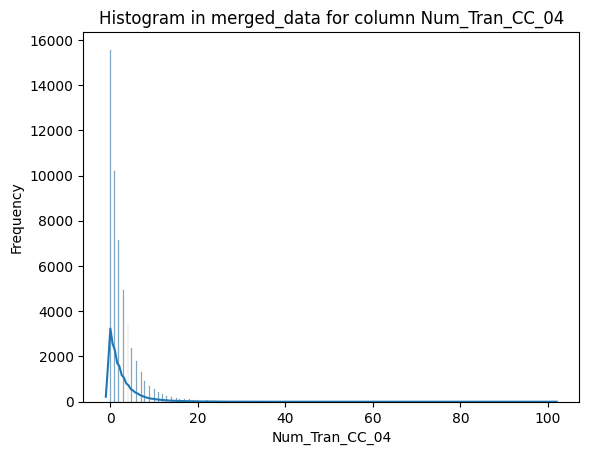

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=452304;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=900843;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

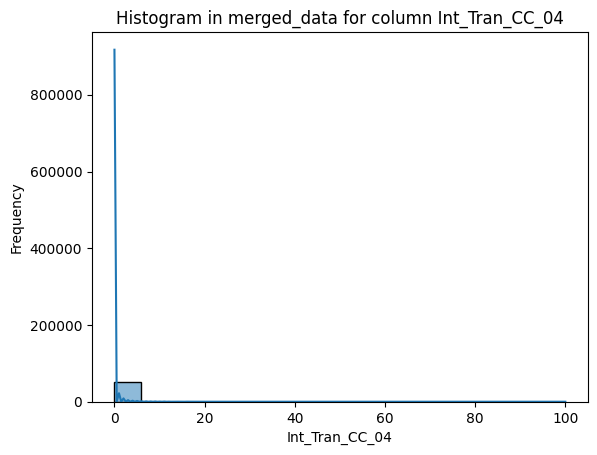

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=213782;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=802322;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

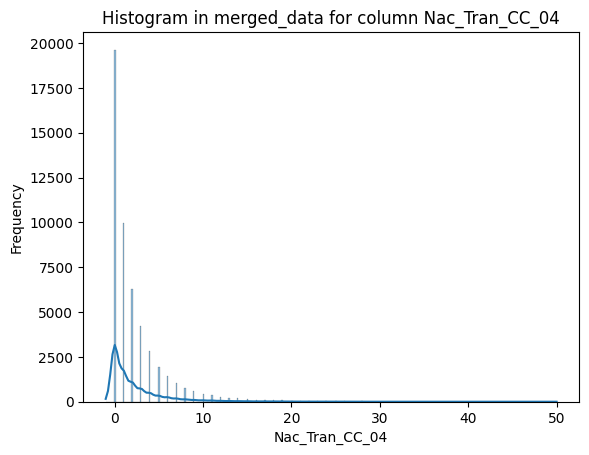

[12/07/24 15:23:09] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=636318;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=569650;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

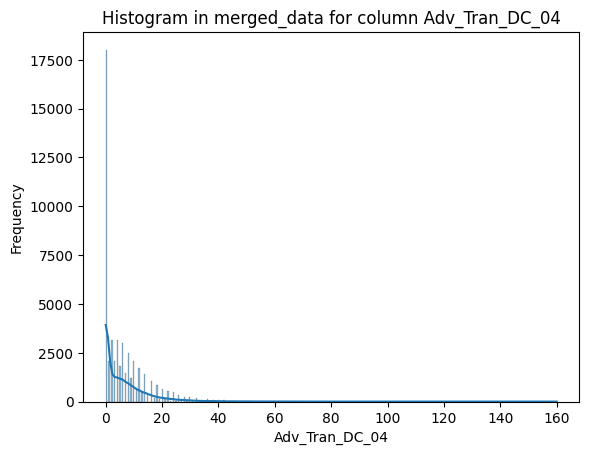

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=635090;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=850754;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

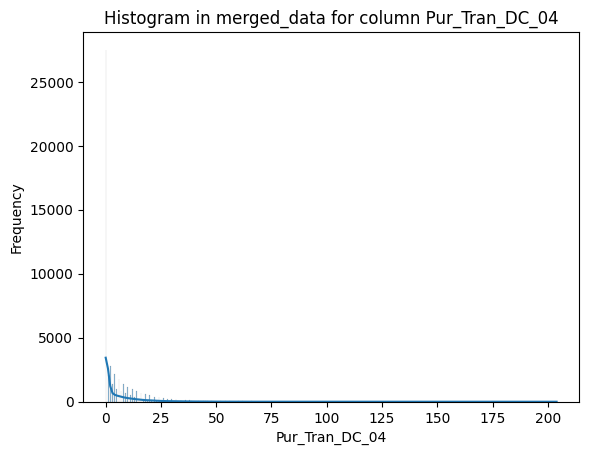

[12/07/24 15:23:10] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=688942;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=973229;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

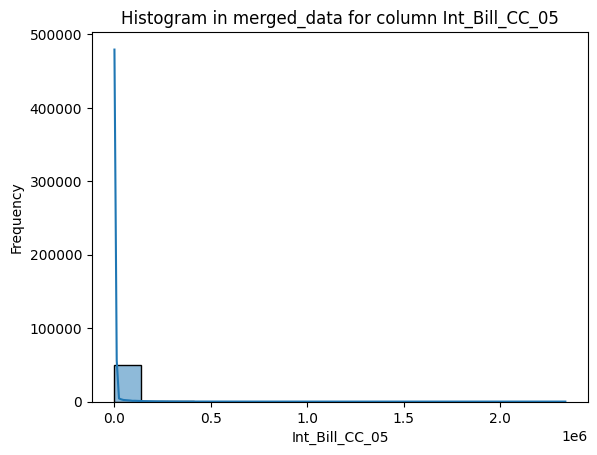

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=379954;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=129093;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

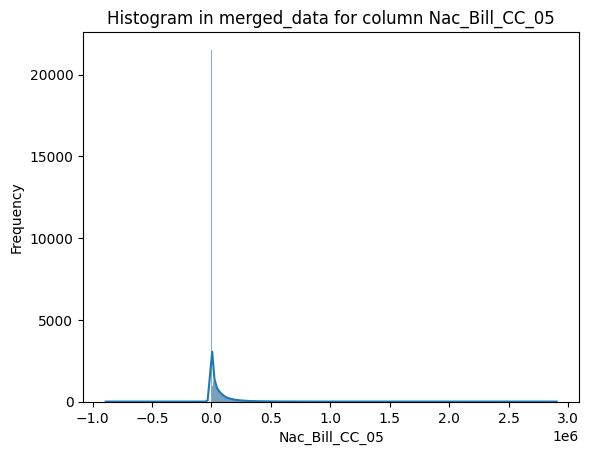

[12/07/24 15:23:12] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=468259;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=117230;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

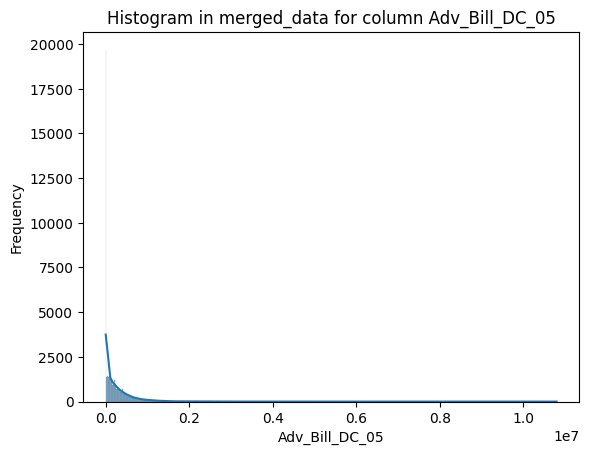

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=353383;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=913040;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

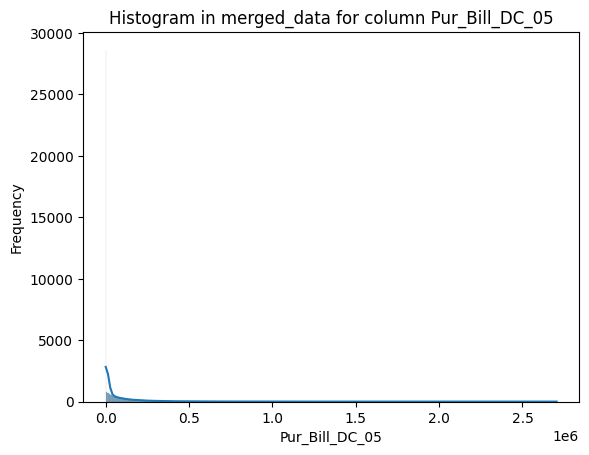

[12/07/24 15:23:13] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=839732;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=849295;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

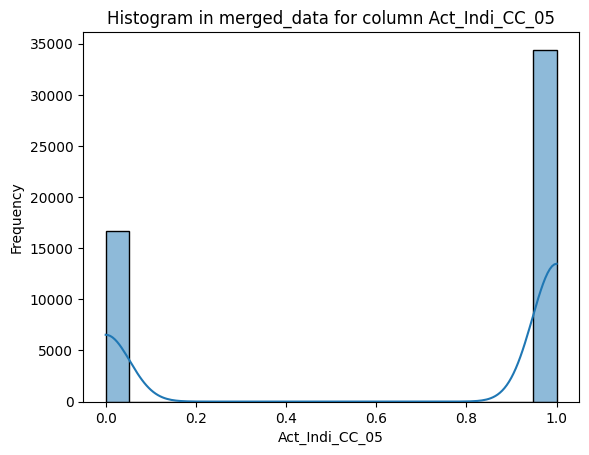

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=386914;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=800450;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

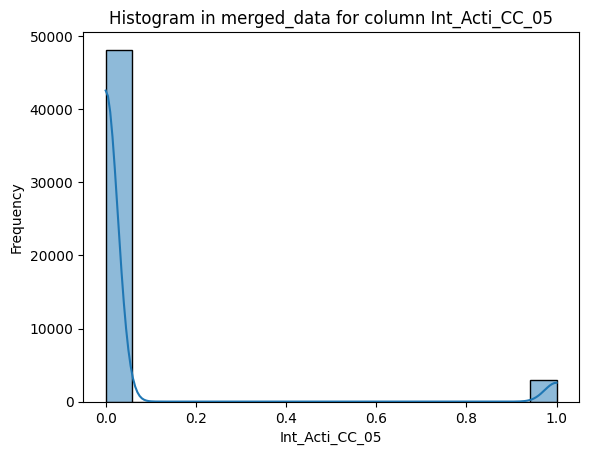

[12/07/24 15:23:14] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=344583;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=187774;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

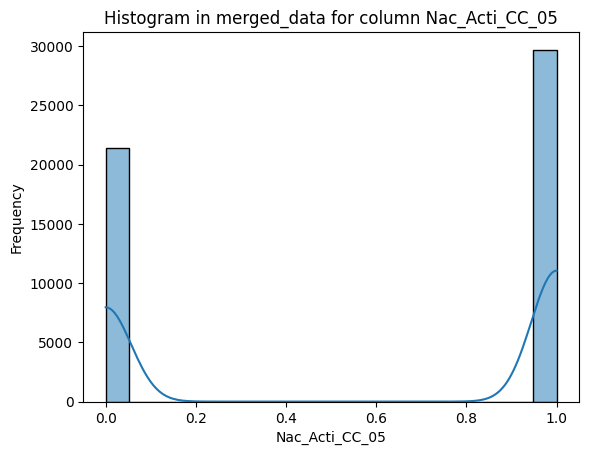

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=991639;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=764130;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

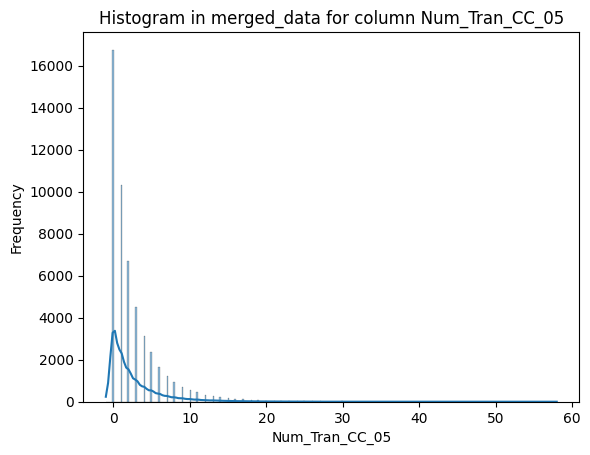

[12/07/24 15:23:15] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=735213;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=996863;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

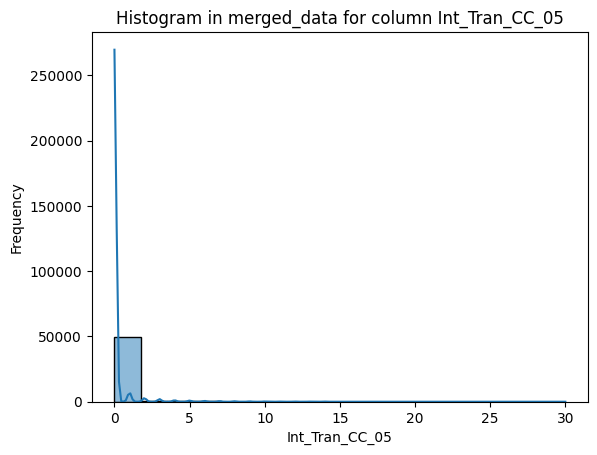

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=346007;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=819288;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

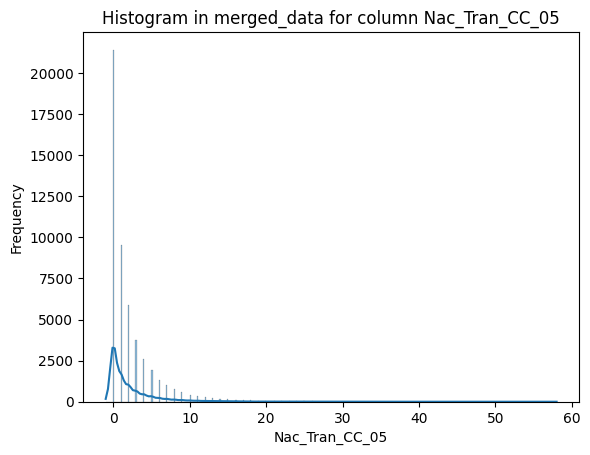

[12/07/24 15:23:16] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=982213;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=704714;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

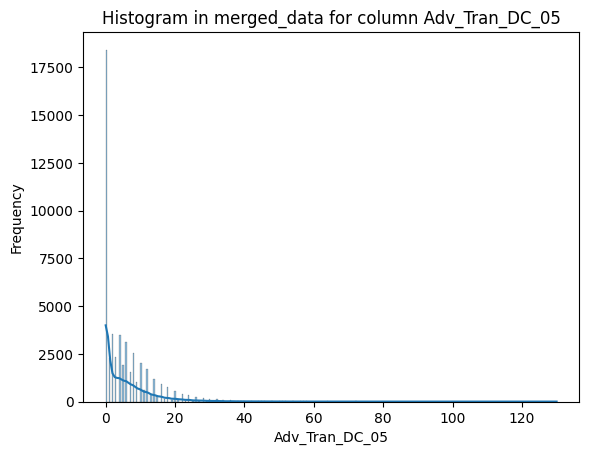

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=360974;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=202006;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

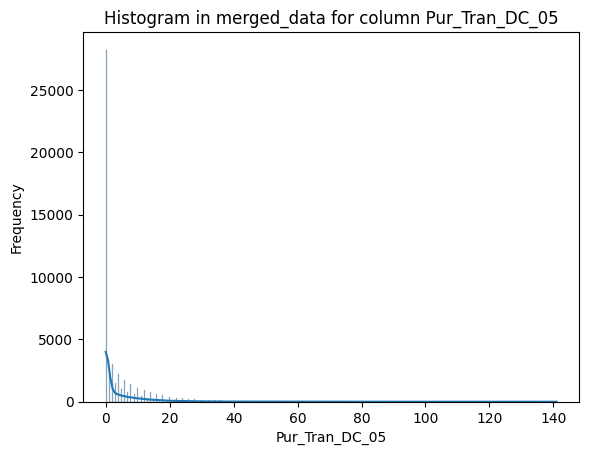

[12/07/24 15:23:17] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=613918;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=357725;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

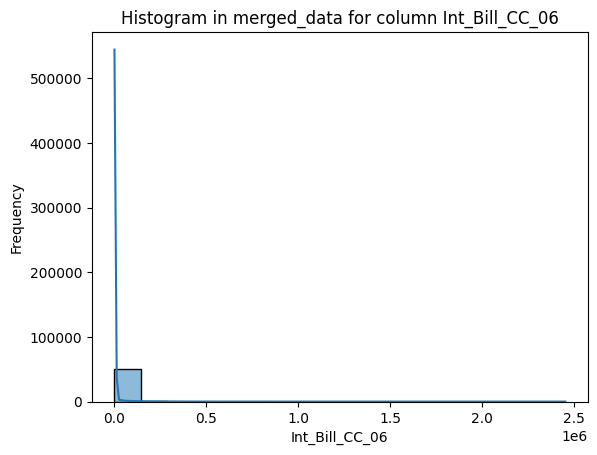

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=623303;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=193811;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

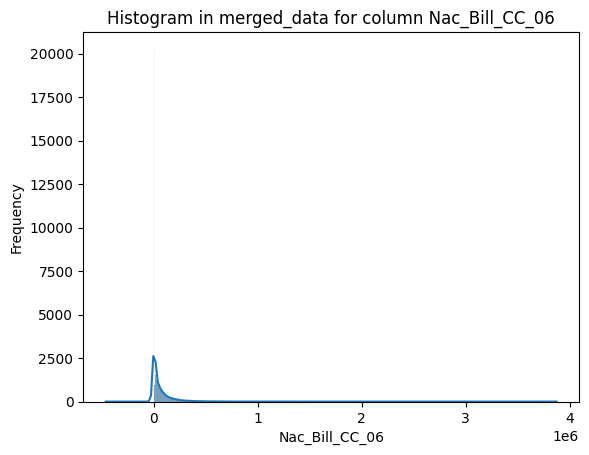

[12/07/24 15:23:18] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=182106;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=178104;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

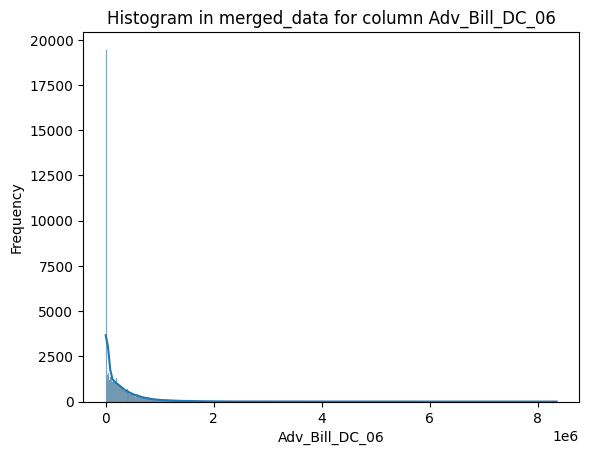

[12/07/24 15:23:19] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=958765;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=952325;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

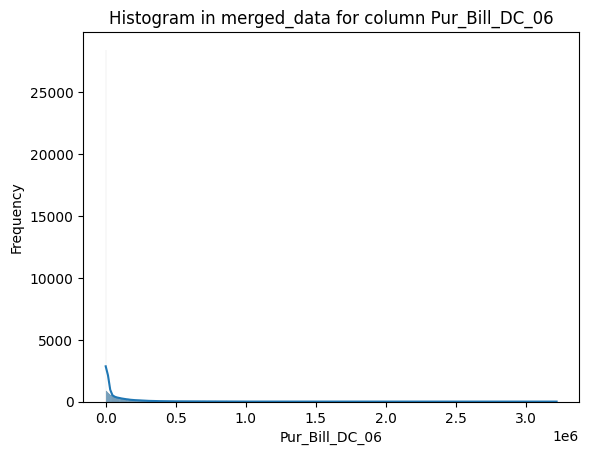

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=65001;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=602335;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

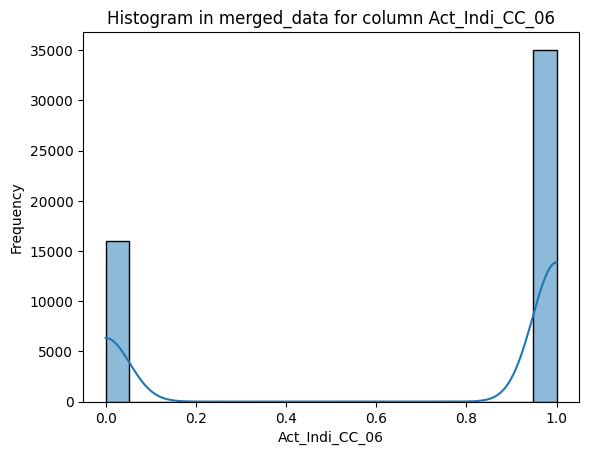

[12/07/24 15:23:20] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=688079;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=528027;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

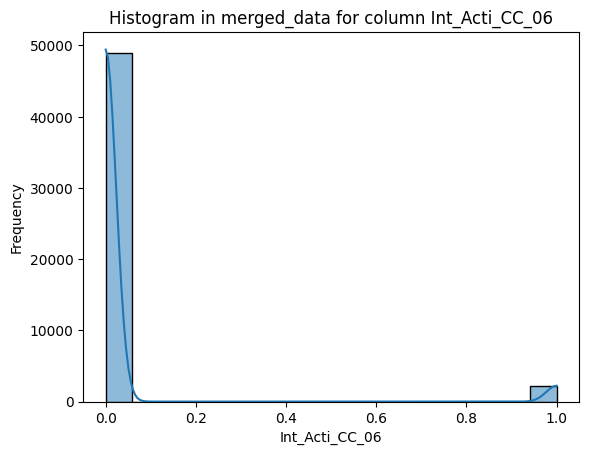

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=241533;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=545435;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

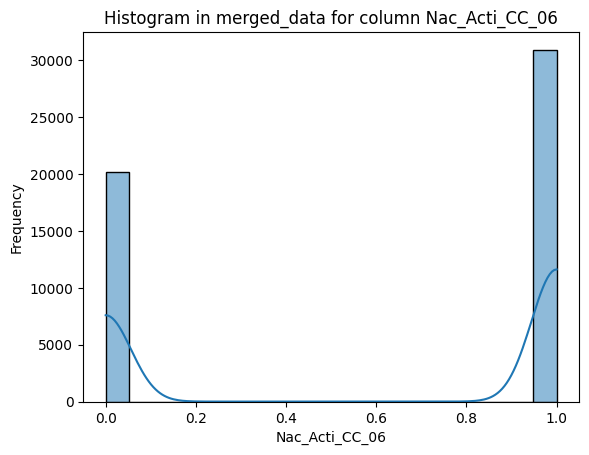

[12/07/24 15:23:21] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=515356;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=126411;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

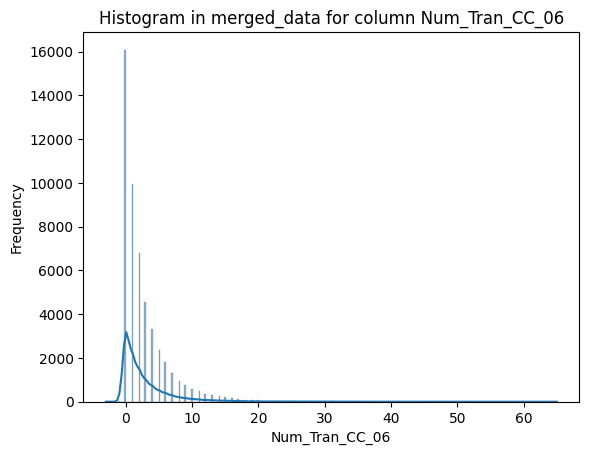

[12/07/24 15:23:22] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=228899;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=299255;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

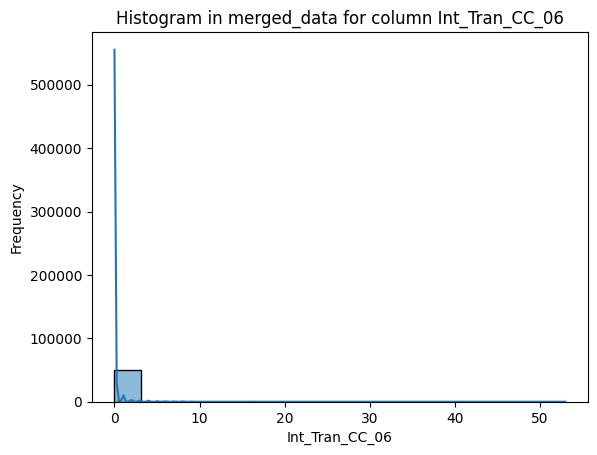

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=320875;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=591652;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

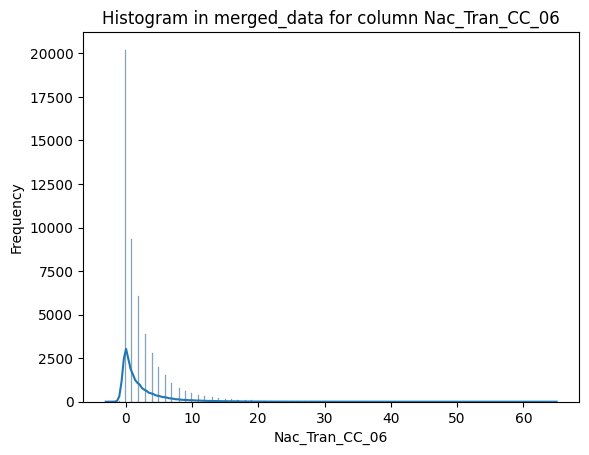

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=894094;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=625721;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

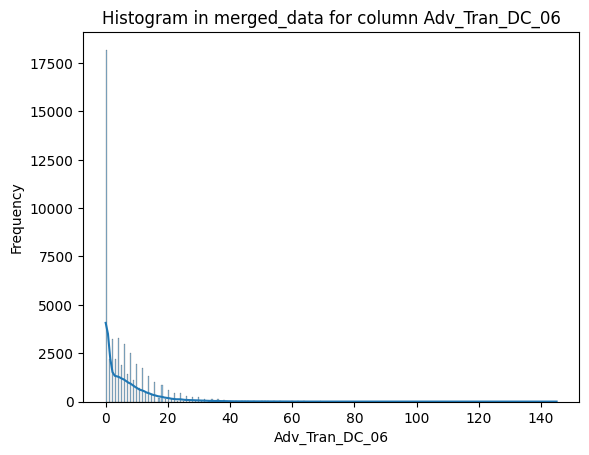

[12/07/24 15:23:23] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=298379;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=864665;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

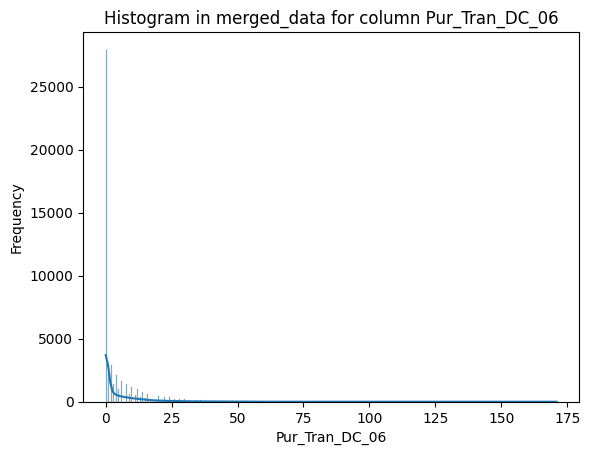

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=903227;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=286402;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

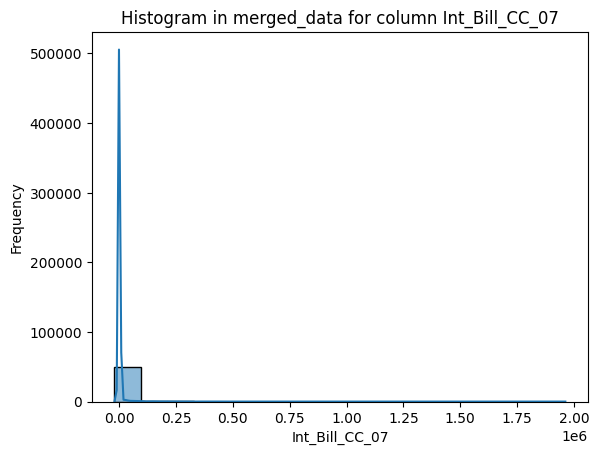

[12/07/24 15:23:24] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=682132;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=252829;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

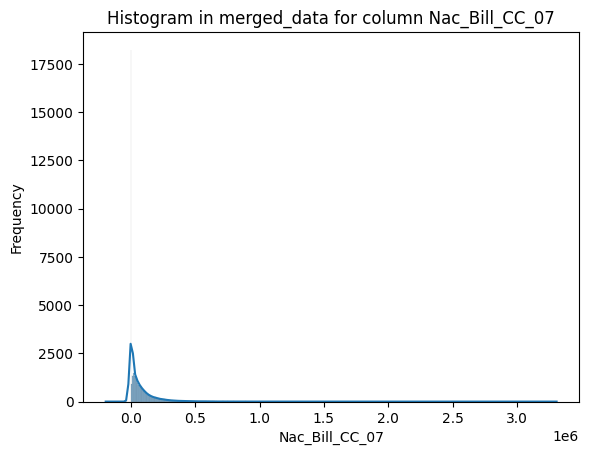

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=477784;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=448489;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

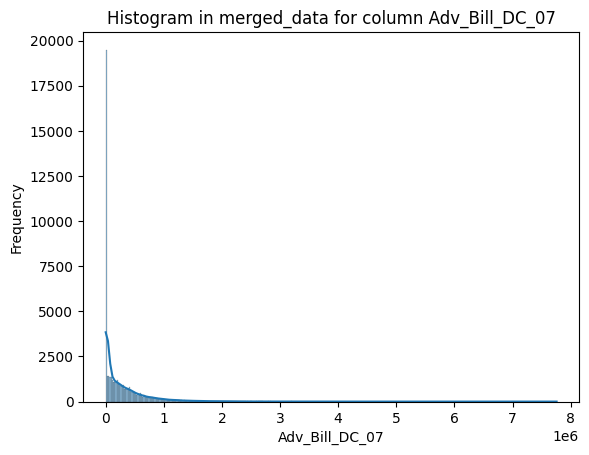

[12/07/24 15:23:25] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=132515;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=929957;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

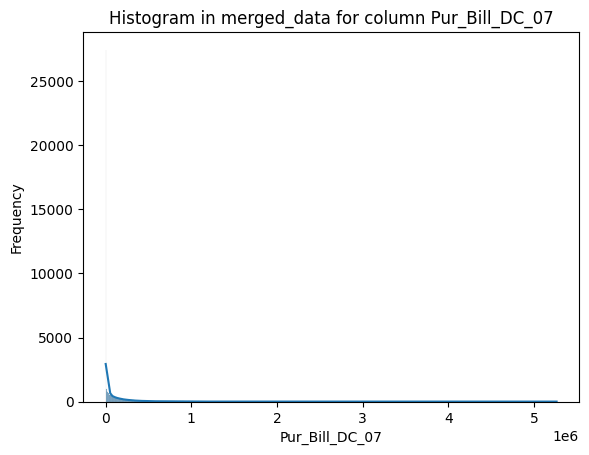

[12/07/24 15:23:26] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=228569;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=78764;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

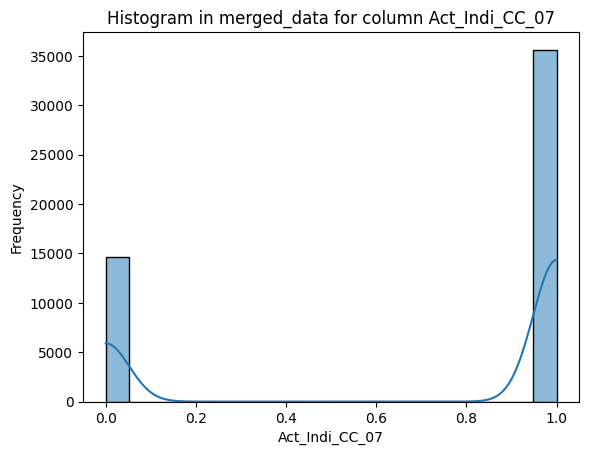

[12/07/24 15:23:27] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=110696;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=775649;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

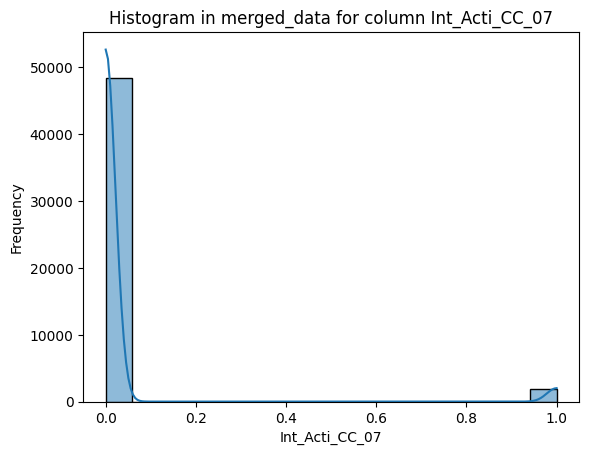

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=528451;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=759236;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

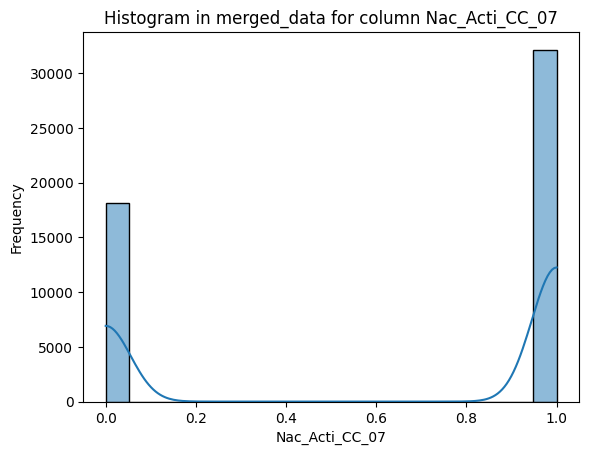

[12/07/24 15:23:28] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=116867;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=165185;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

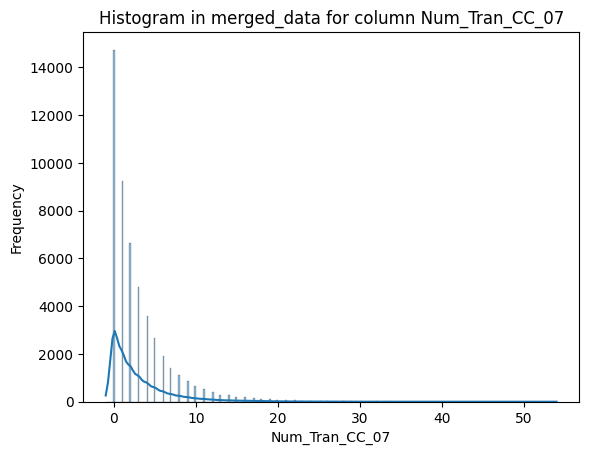

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=484320;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=323884;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

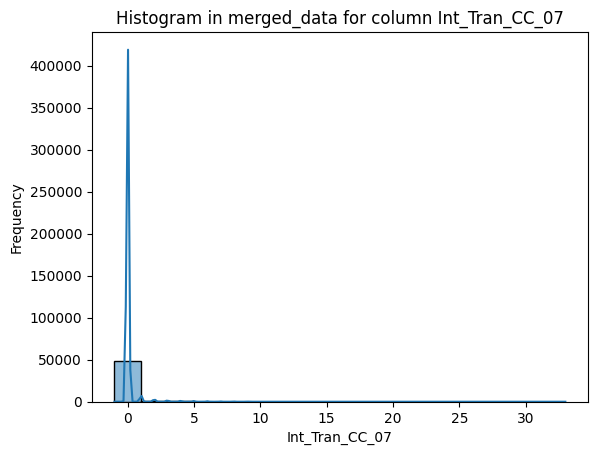

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=928356;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=18584;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

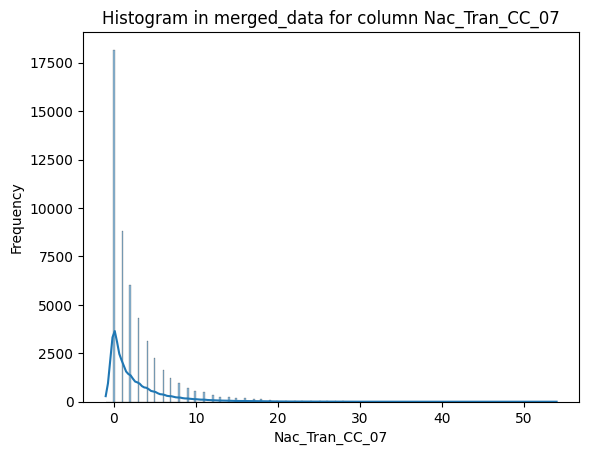

[12/07/24 15:23:29] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=648054;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=278728;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

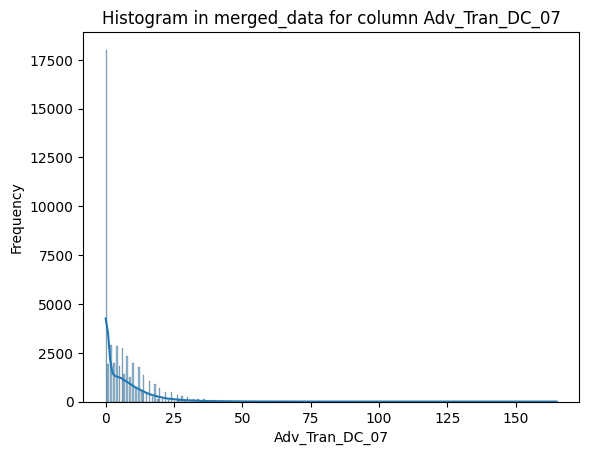

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=119306;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=507166;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

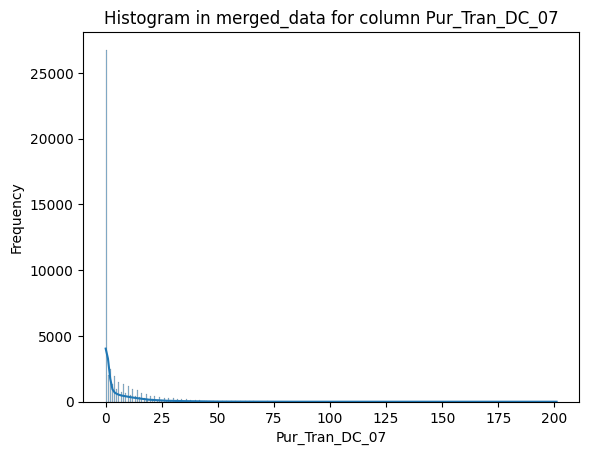

[12/07/24 15:23:30] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=538612;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=873664;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

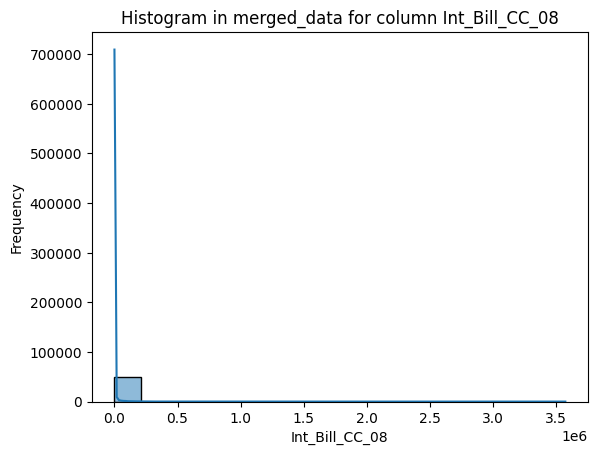

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=724562;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=790419;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

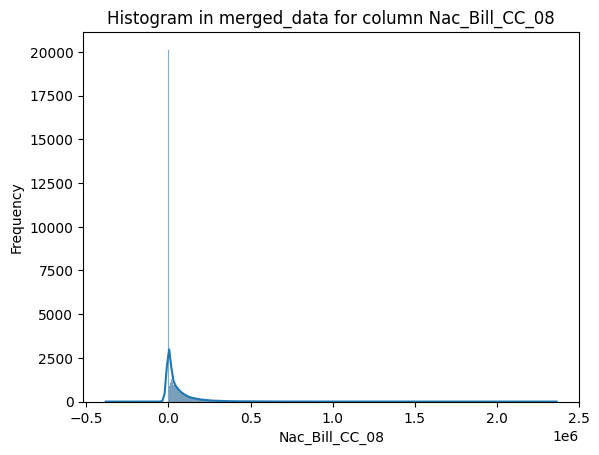

[12/07/24 15:23:31] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=934326;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=346887;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

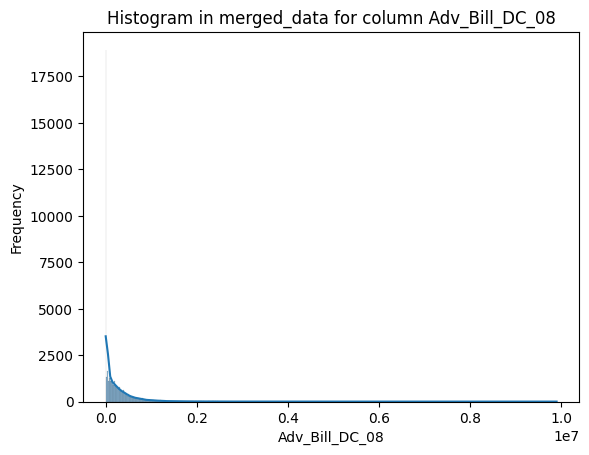

[12/07/24 15:23:32] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=263159;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=774286;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

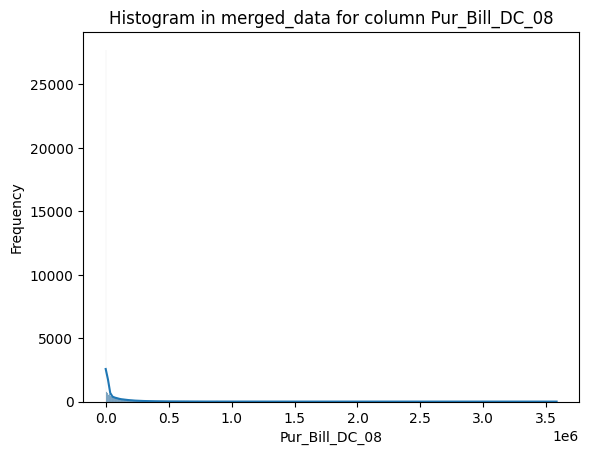

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=543848;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=477718;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

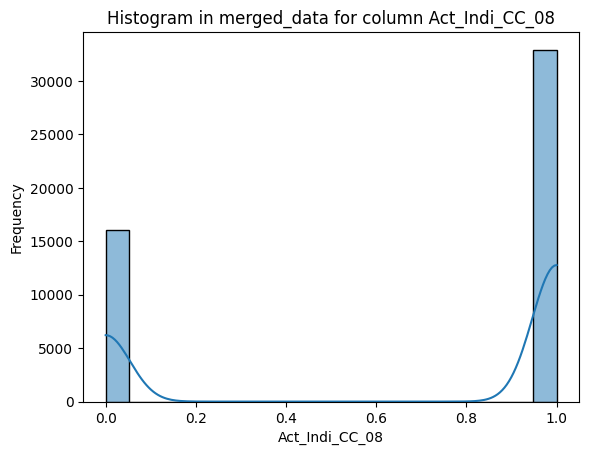

[12/07/24 15:23:33] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=356895;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=20059;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

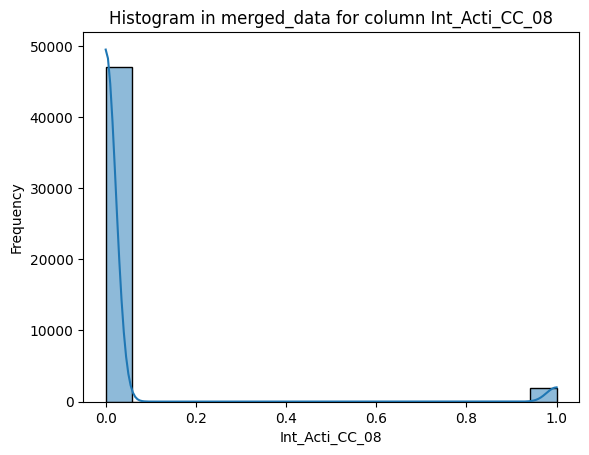

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=590374;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=159854;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

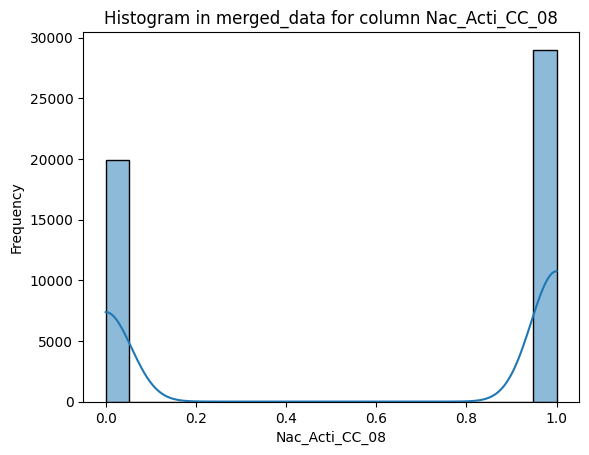

[12/07/24 15:23:34] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=425624;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=580438;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

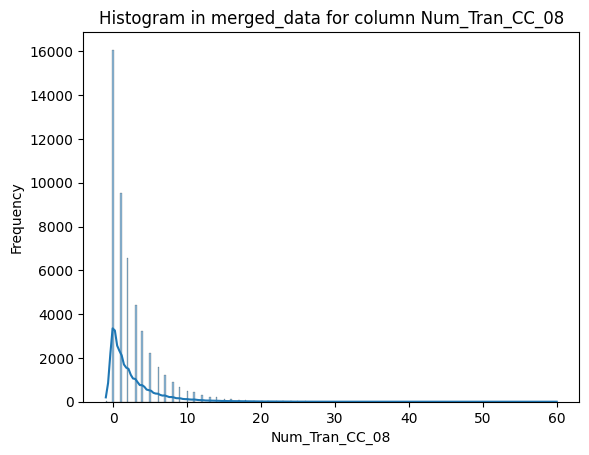

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=307436;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=324464;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

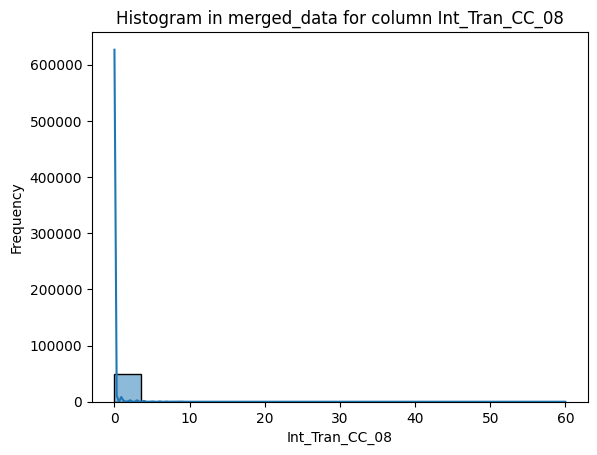

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=306877;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=427706;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

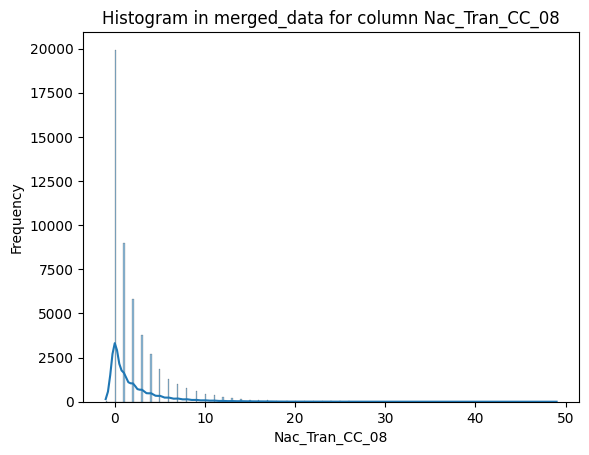

[12/07/24 15:23:35] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=404160;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=756346;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

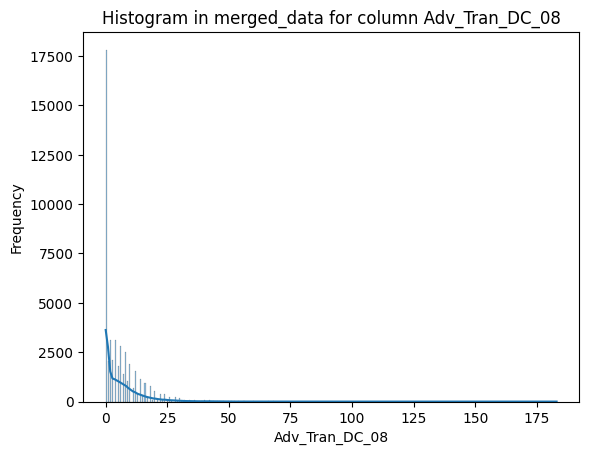

[12/07/24 15:23:36] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=565014;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=771814;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

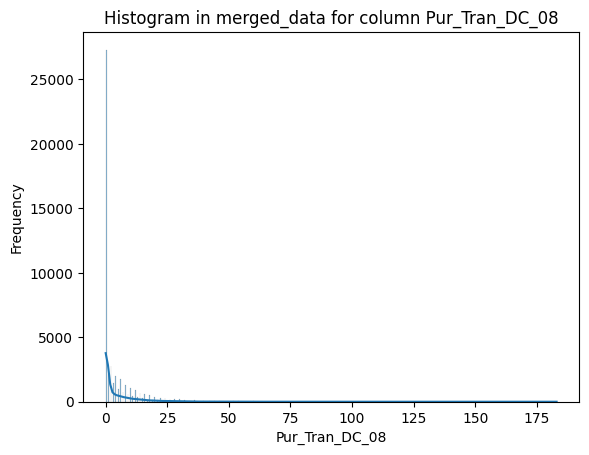

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=491767;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=885449;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

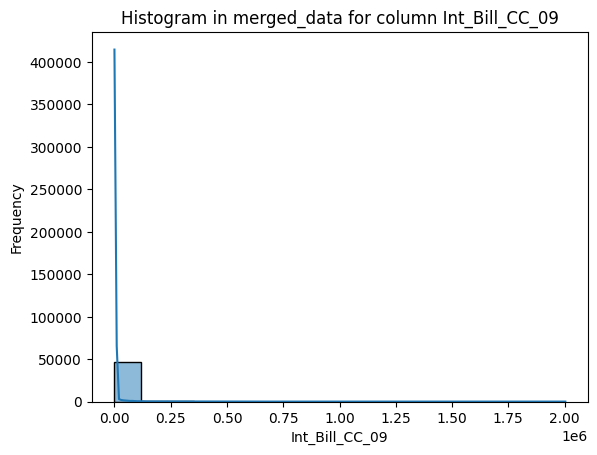

[12/07/24 15:23:37] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=93022;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=566684;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

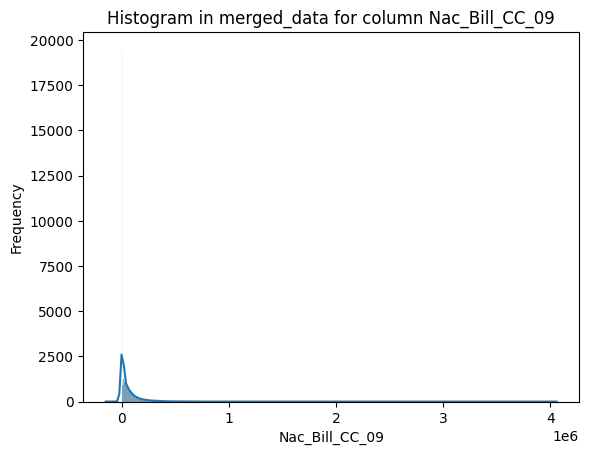

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=759643;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=873558;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

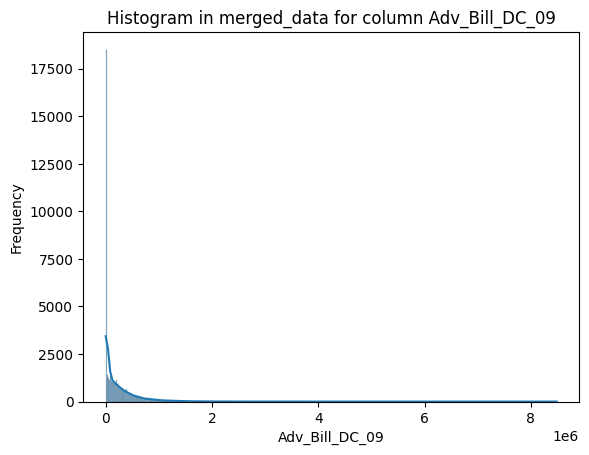

[12/07/24 15:23:38] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=505042;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=889700;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

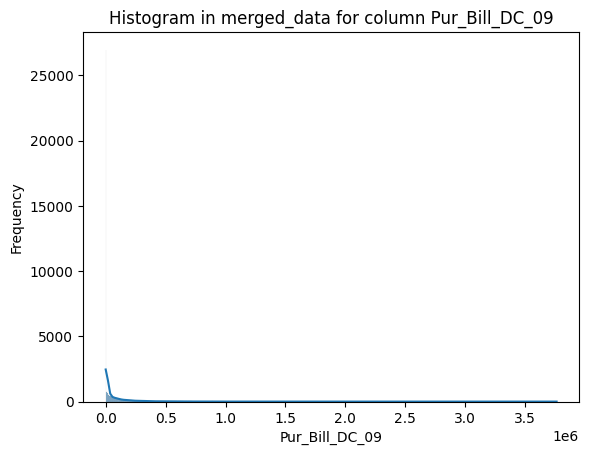

[12/07/24 15:23:39] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=16946;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=846448;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

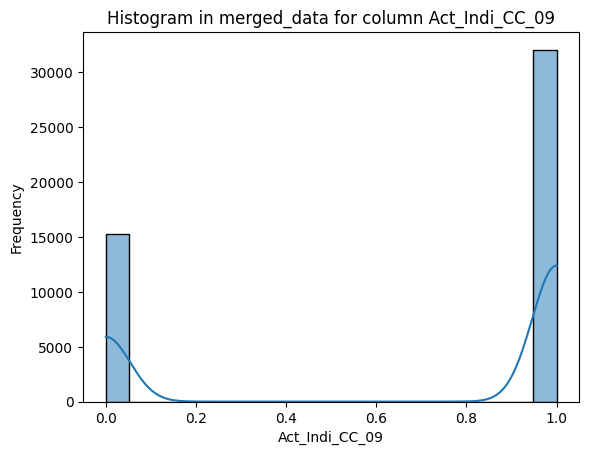

[12/07/24 15:23:40] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=826026;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=368891;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

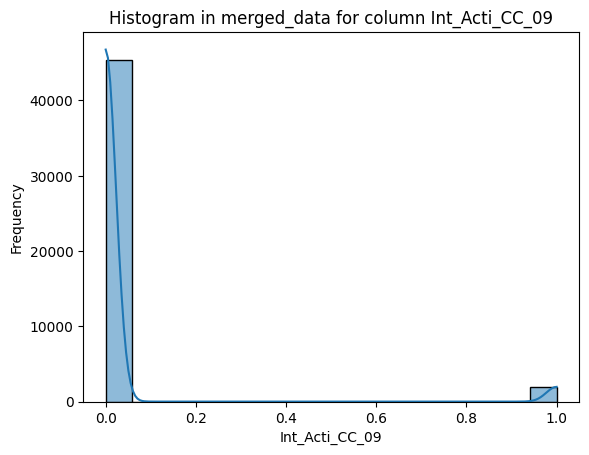

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=365160;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=991712;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

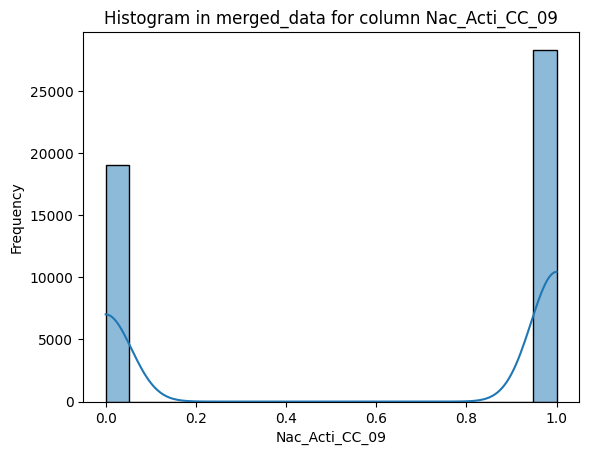

[12/07/24 15:23:41] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=618782;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=721342;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

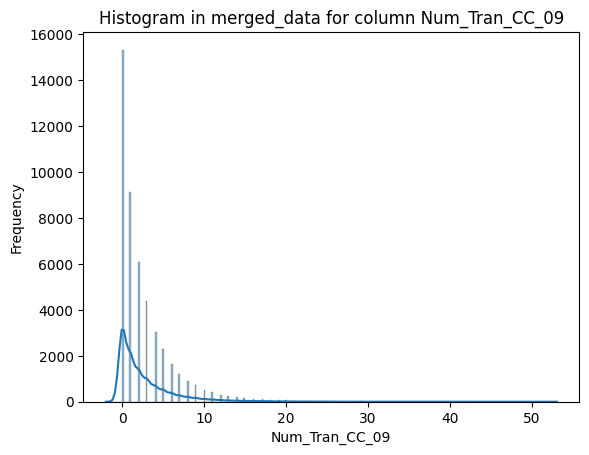

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=843575;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=127299;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

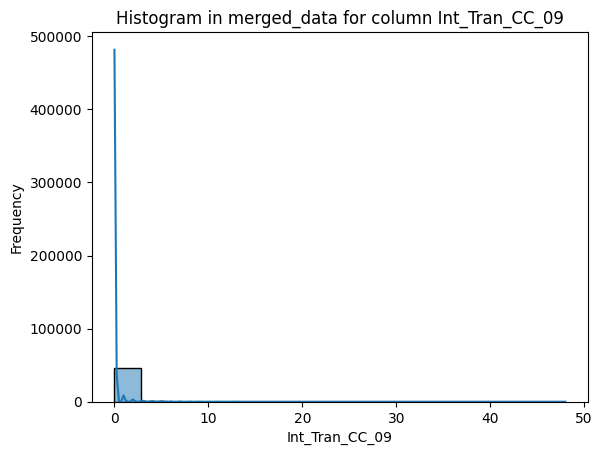

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=33525;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=185708;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

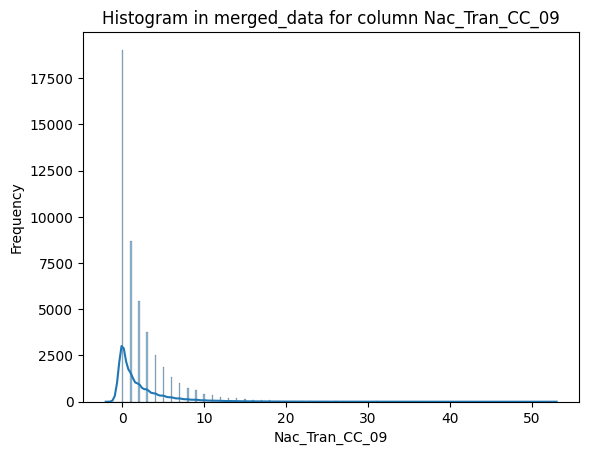

[12/07/24 15:23:42] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=436759;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=113210;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

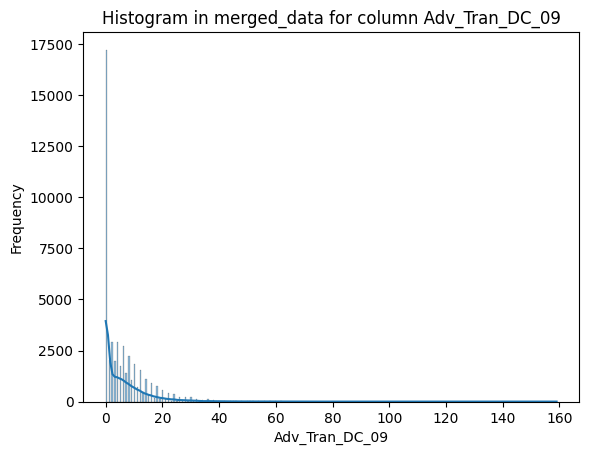

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=860582;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=699455;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

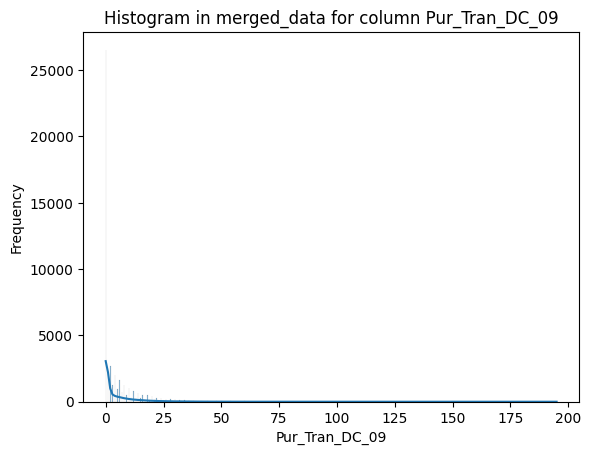

[12/07/24 15:23:43] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=57637;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=671334;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

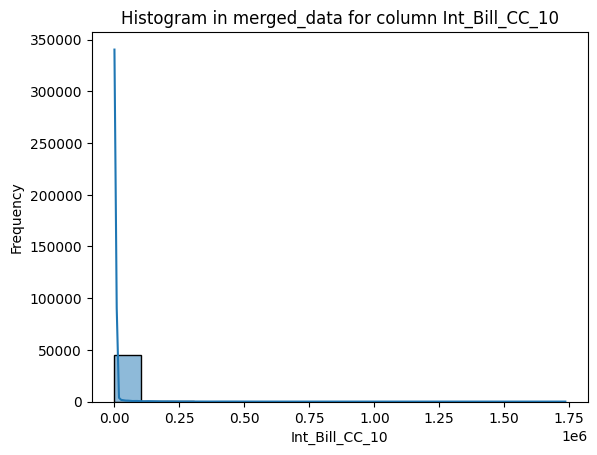

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=148878;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=128015;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

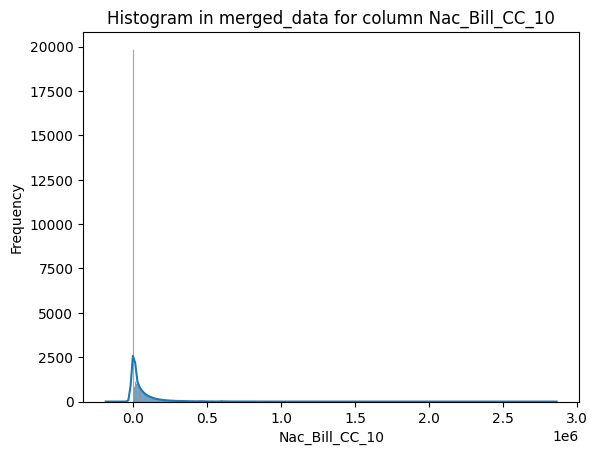

[12/07/24 15:23:44] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=397869;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=378121;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

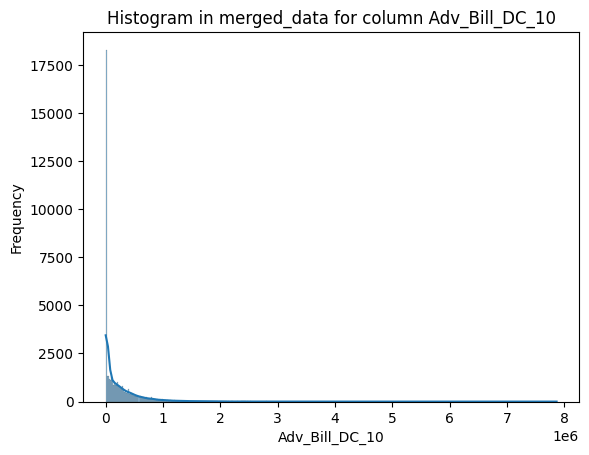

[12/07/24 15:23:45] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=966103;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=451698;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

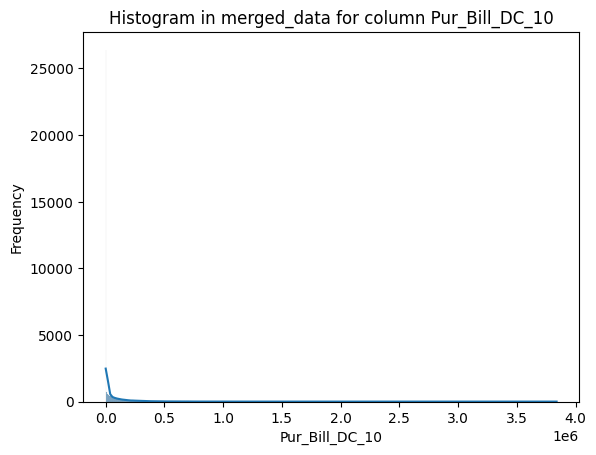

[12/07/24 15:23:46] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=760500;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=367321;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

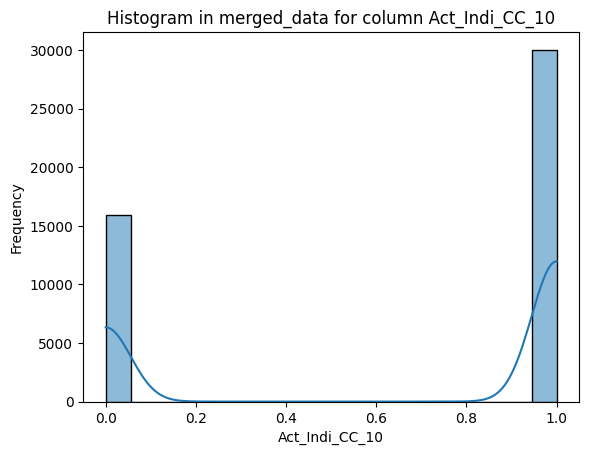

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=138844;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=961946;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

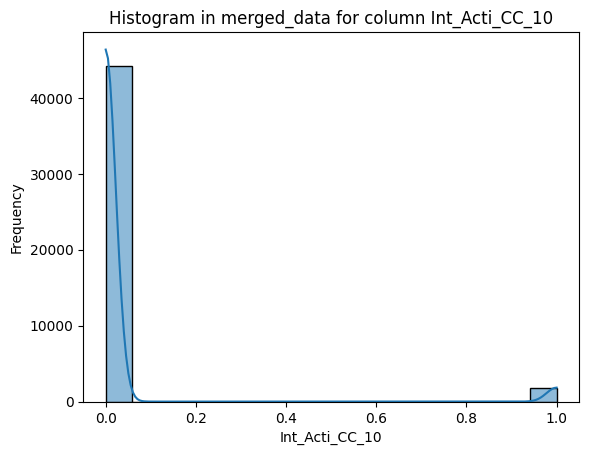

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=651836;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=235846;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

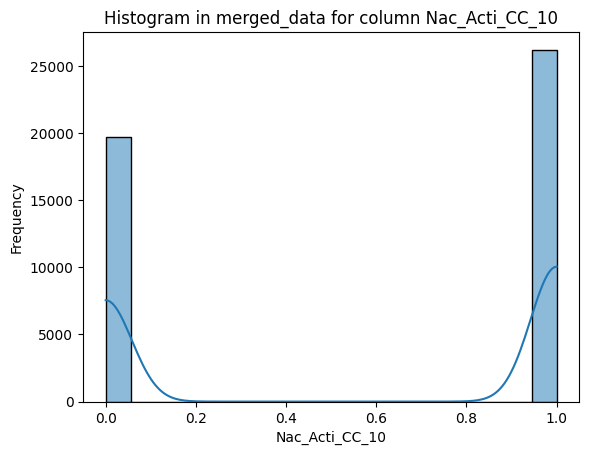

[12/07/24 15:23:47] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=410499;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=753703;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

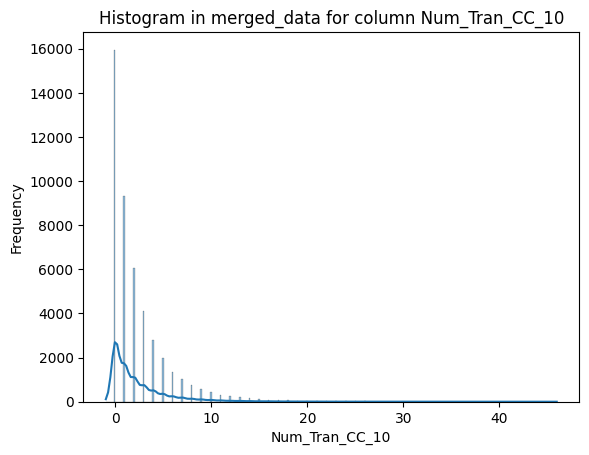

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=825787;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=926027;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

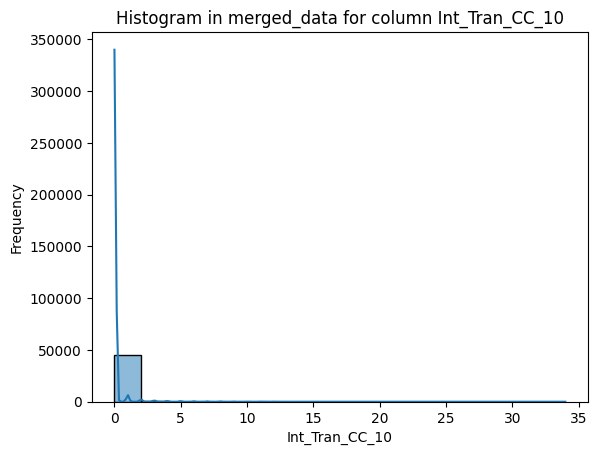

[12/07/24 15:23:48] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=123207;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=634492;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

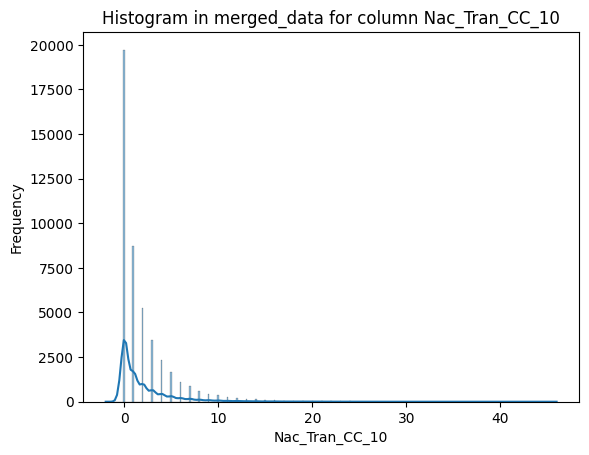

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=913243;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=167055;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

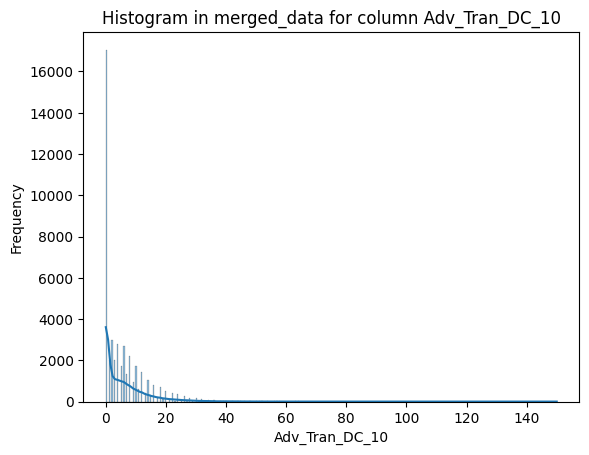

[12/07/24 15:23:49] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=431924;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=990819;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

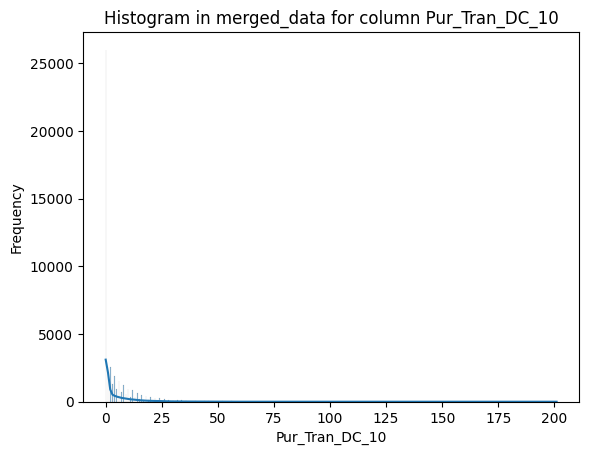

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=785555;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=967584;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

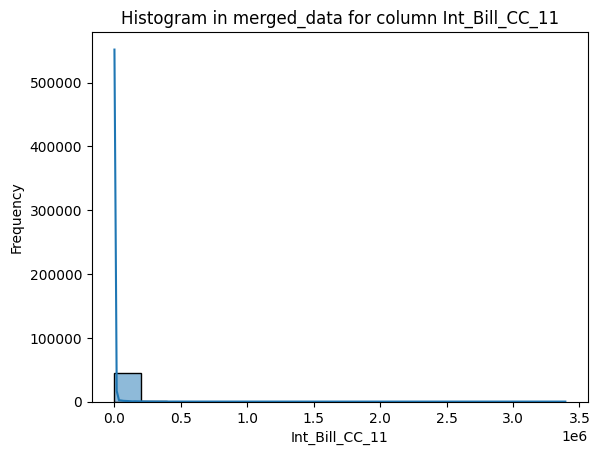

[12/07/24 15:23:50] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=947933;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=456326;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

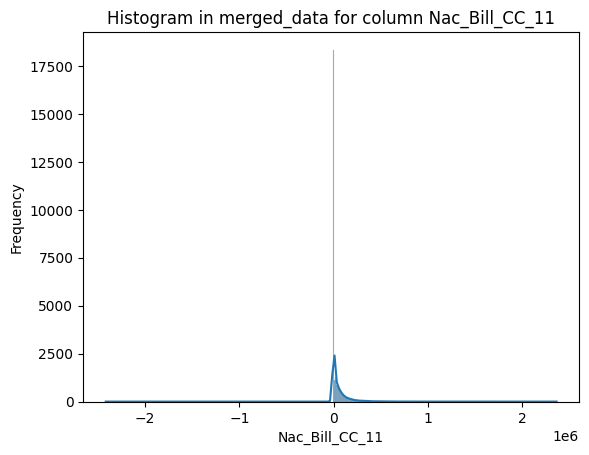

[12/07/24 15:23:51] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=762393;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=463746;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

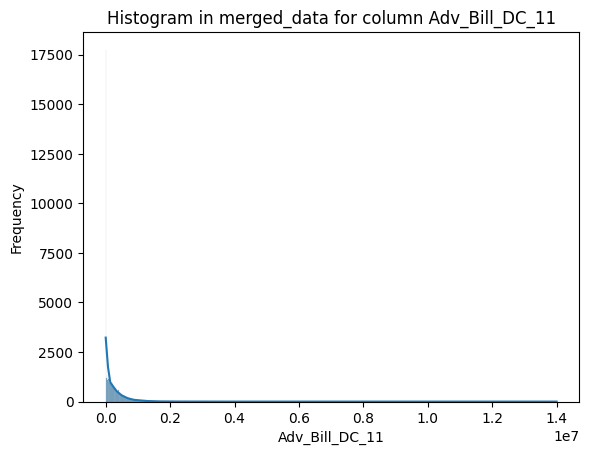

[12/07/24 15:23:52] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=303689;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=565237;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

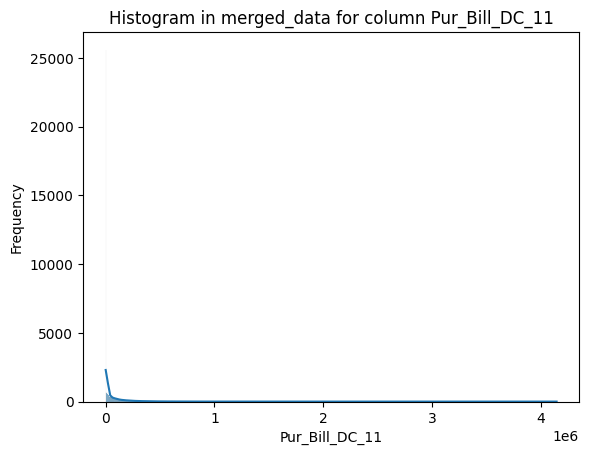

[12/07/24 15:23:53] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=370234;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=752940;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

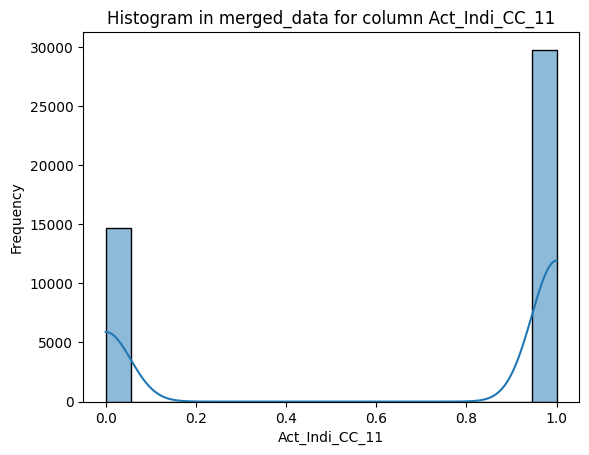

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=59869;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=918140;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

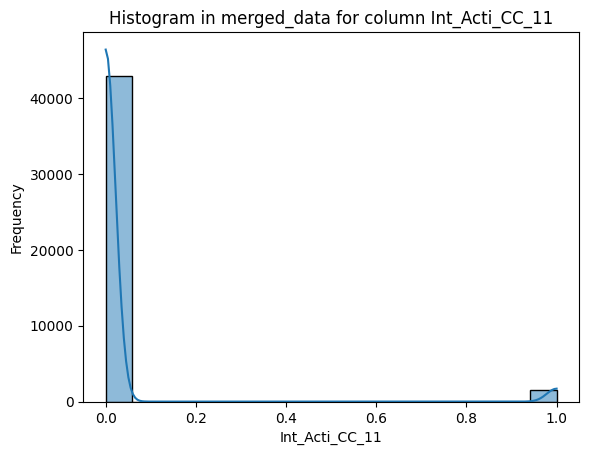

[12/07/24 15:23:54] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=499529;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=150603;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

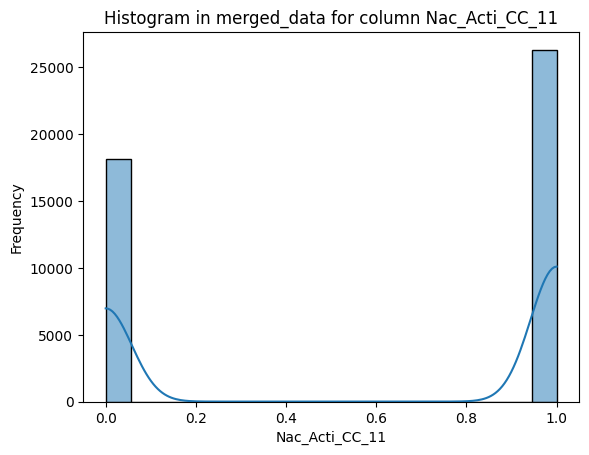

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=927380;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=864804;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

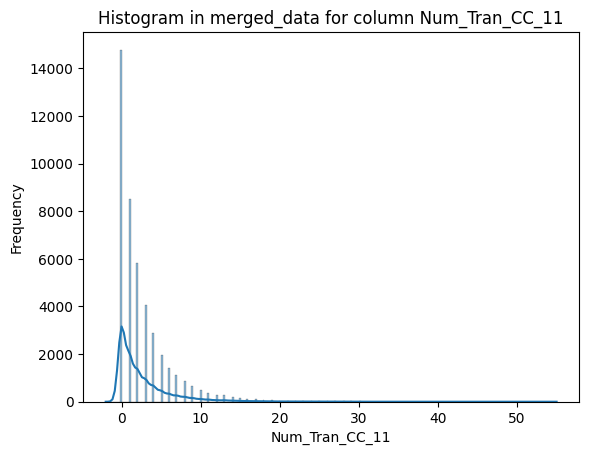

[12/07/24 15:23:55] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=165383;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=90261;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

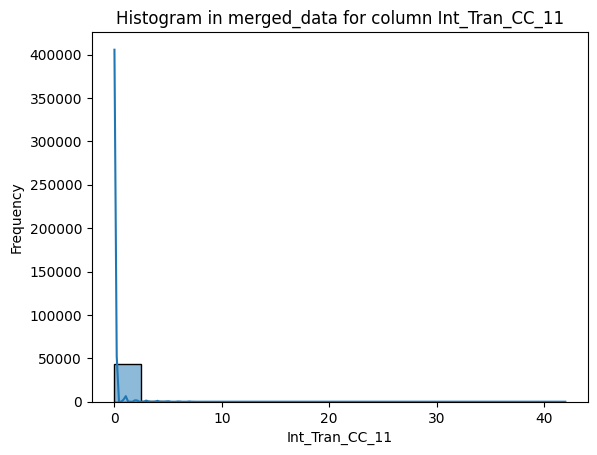

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=65293;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=666483;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

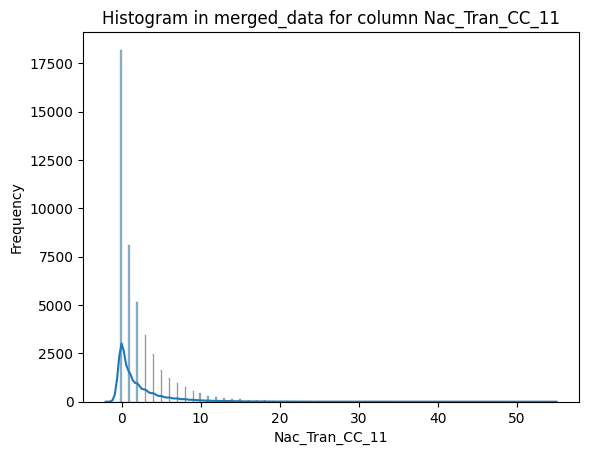

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=949138;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=721393;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

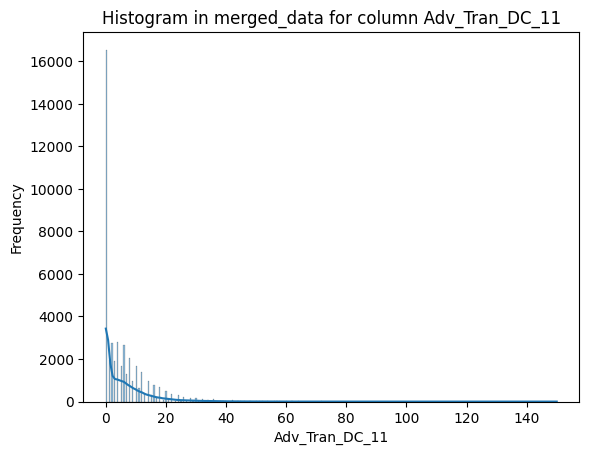

[12/07/24 15:23:56] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=865082;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=568956;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

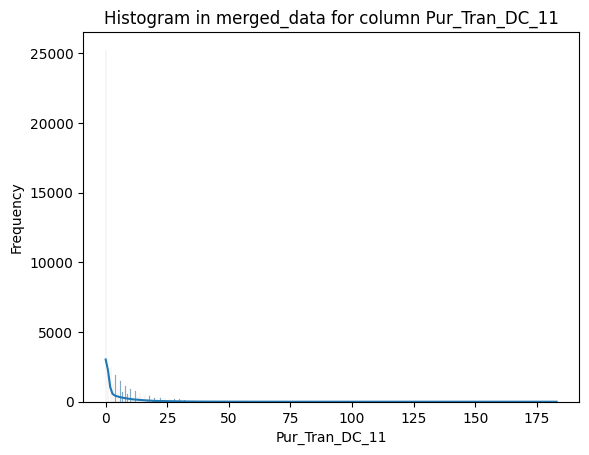

[12/07/24 15:23:57] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=580495;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=337783;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

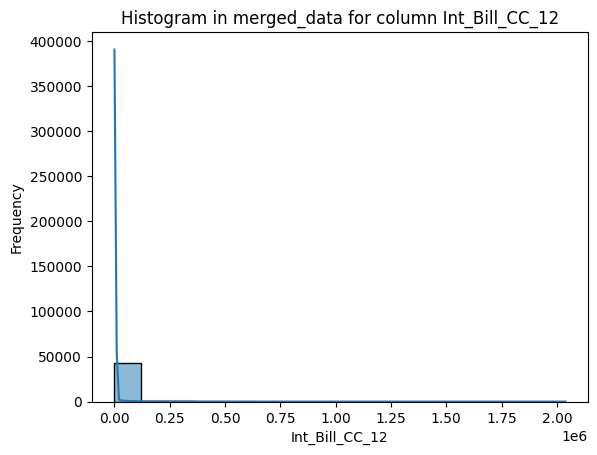

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=860079;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=482325;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

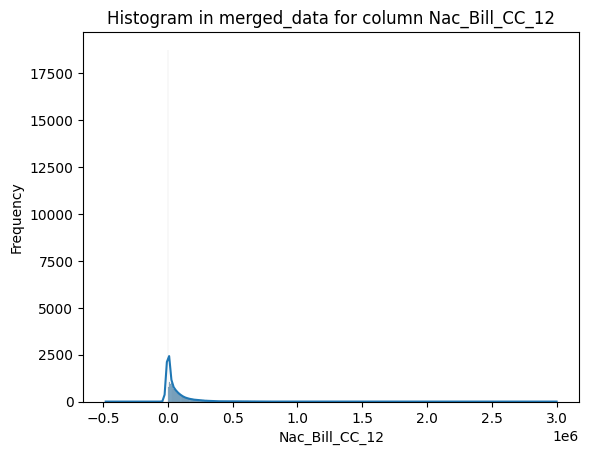

[12/07/24 15:23:58] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=90903;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=996296;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

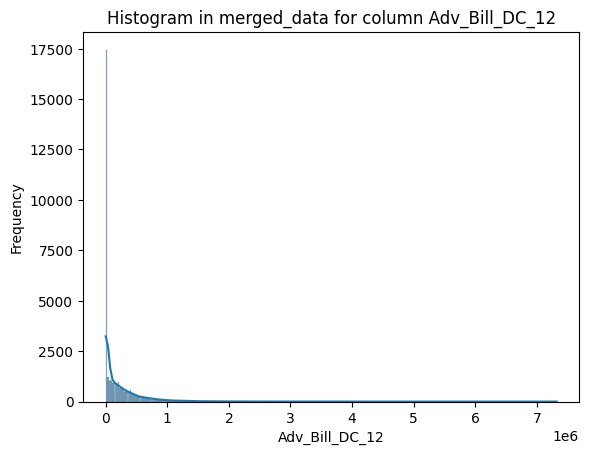

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=889779;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=165124;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

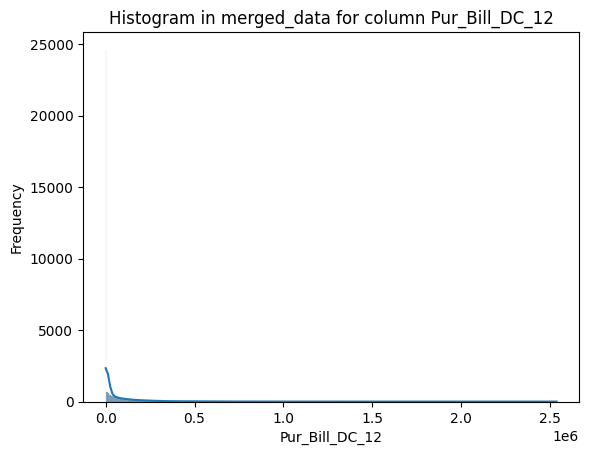

[12/07/24 15:23:59] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=477383;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=835499;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

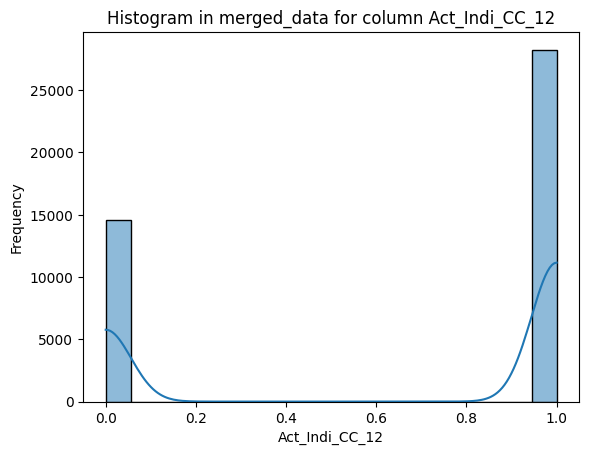

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=853167;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=616357;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

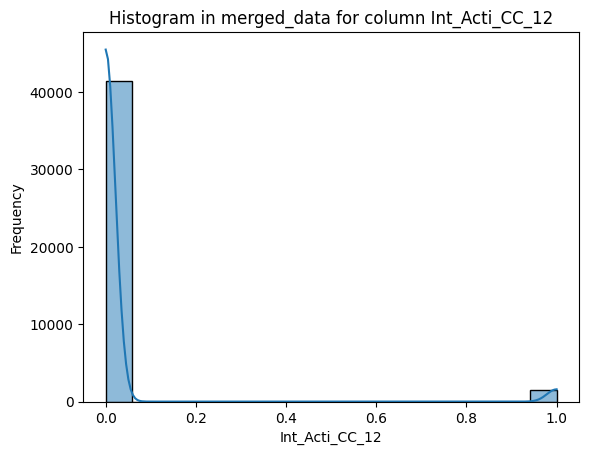

[12/07/24 15:24:00] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=115972;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=712535;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

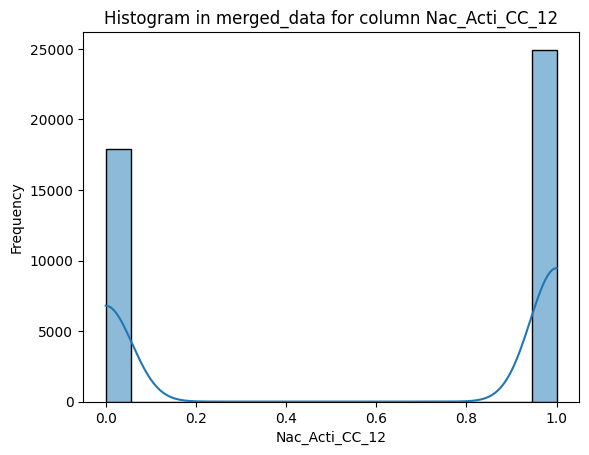

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=776465;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=73515;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

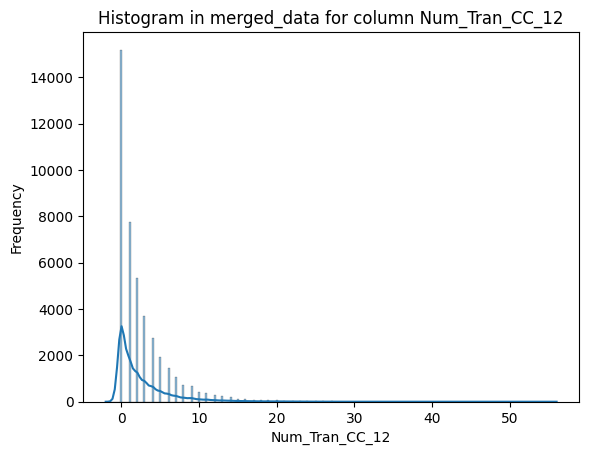

[12/07/24 15:24:01] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=191715;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=288531;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

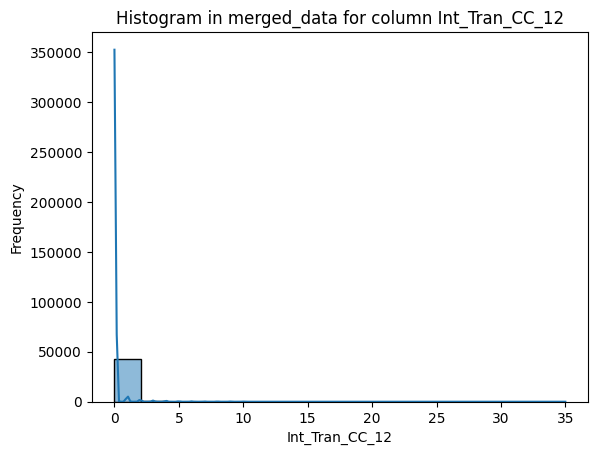

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=281875;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=116884;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

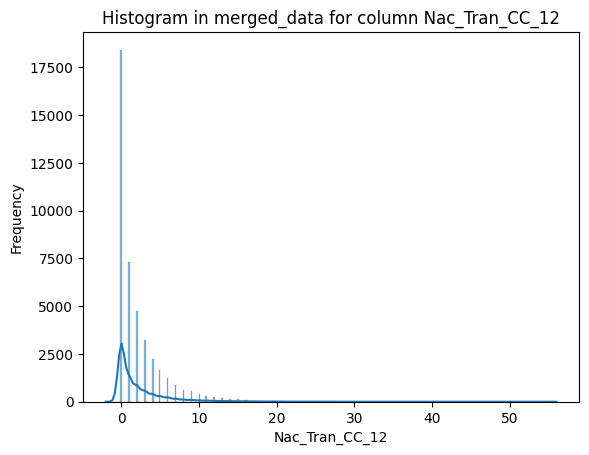

[12/07/24 15:24:02] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=854759;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=885547;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

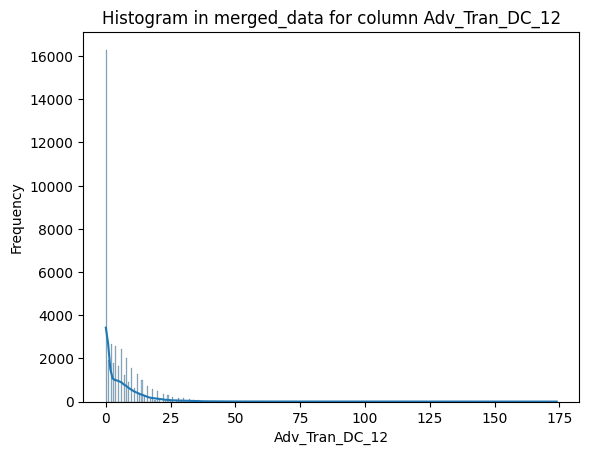

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=22987;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=935918;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

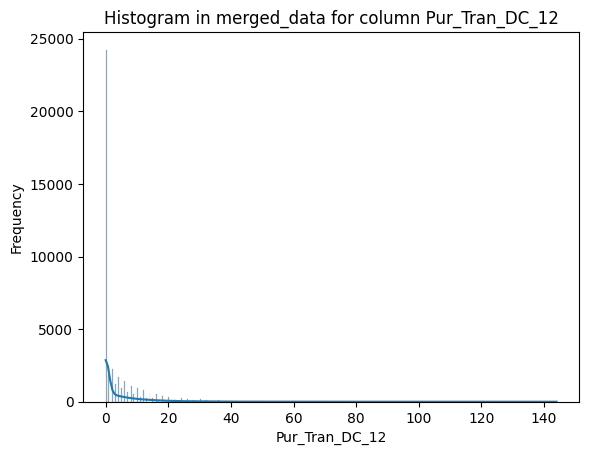

------------------------------------------------------------

----------------------- DataFrame data_groups -----------------------



[12/07/24 15:24:03] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=337587;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=894371;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

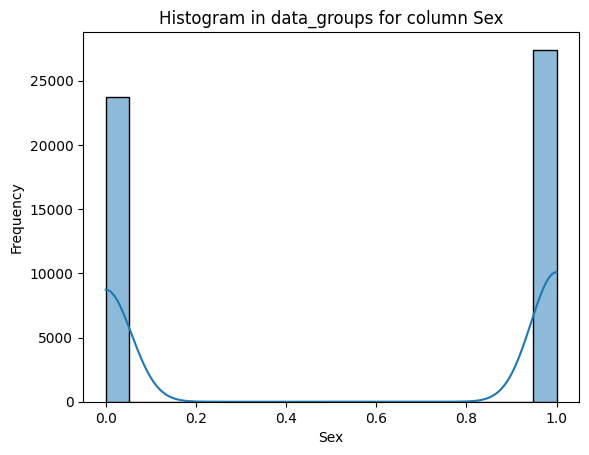

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=402298;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=564928;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

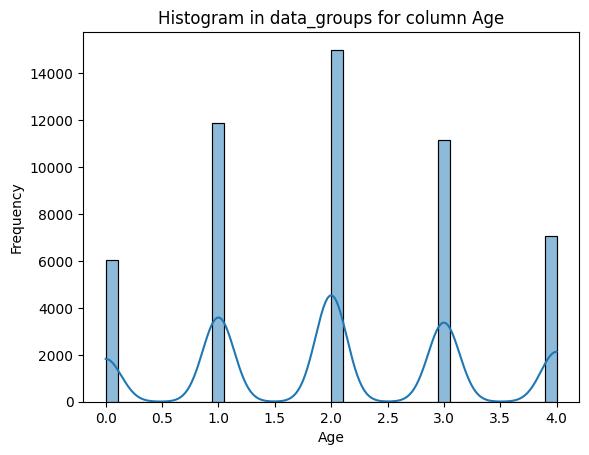

[12/07/24 15:24:04] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=110348;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=410920;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

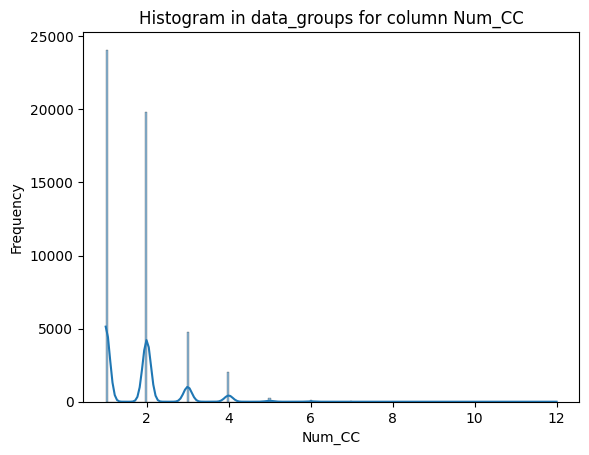

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=185350;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=430531;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

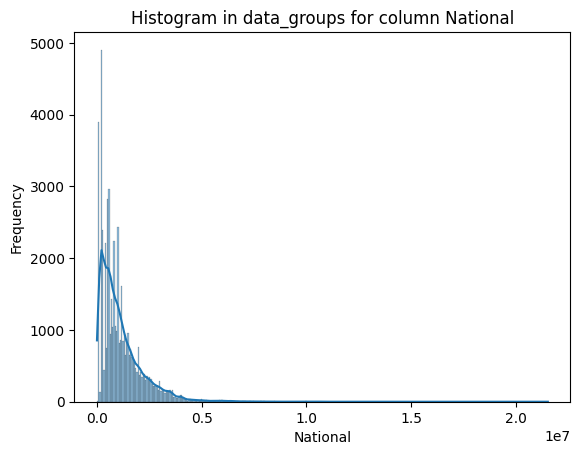

[12/07/24 15:24:05] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=59369;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=952163;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

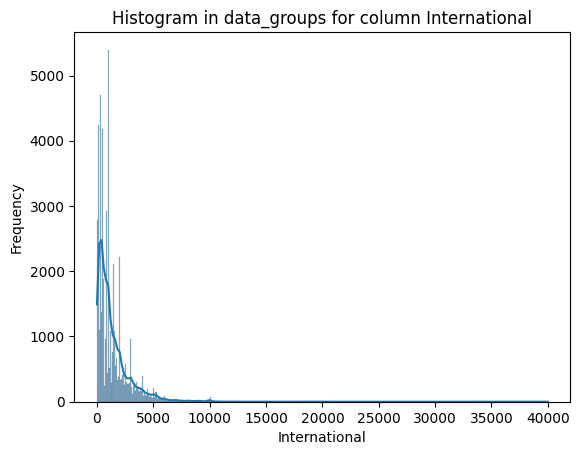

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=657725;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=796630;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

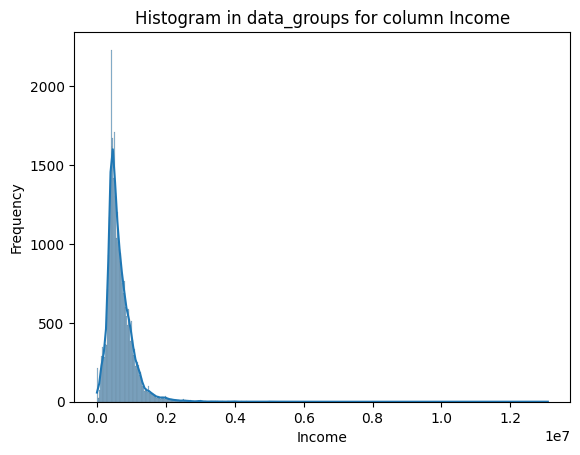

[12/07/24 15:24:06] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=158587;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=914973;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

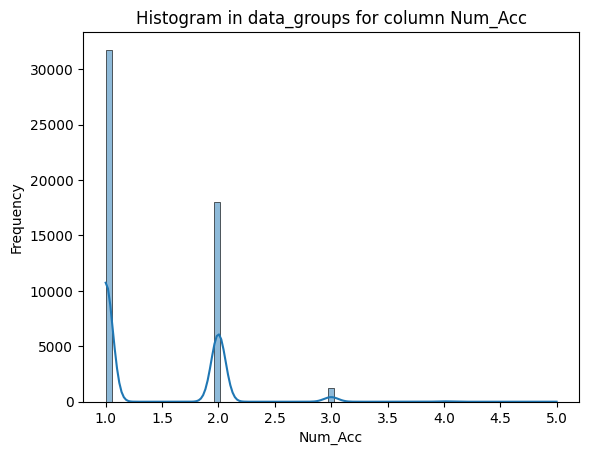

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=194214;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=249329;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

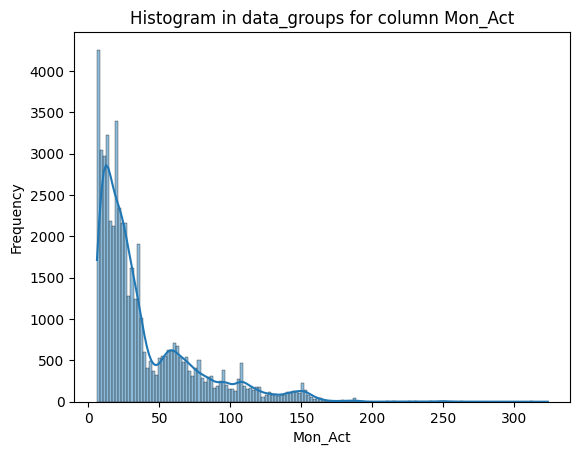

[12/07/24 15:24:07] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=855616;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=614430;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

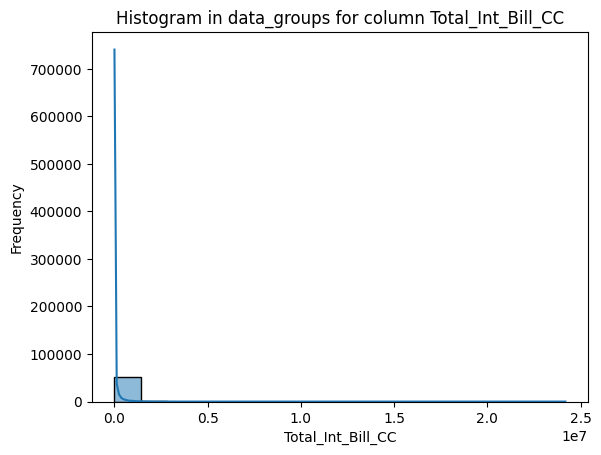

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=546778;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=900761;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

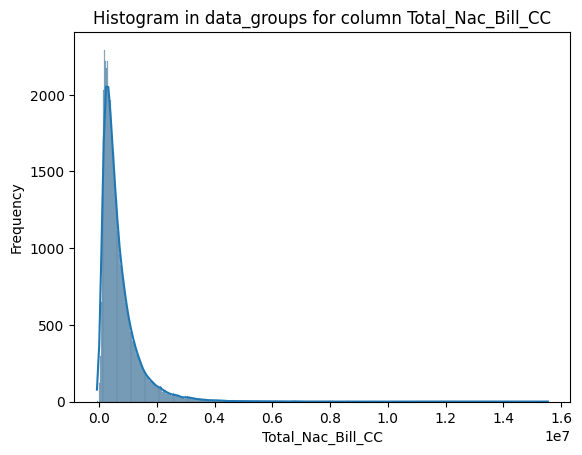

[12/07/24 15:24:08] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=143070;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=978571;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

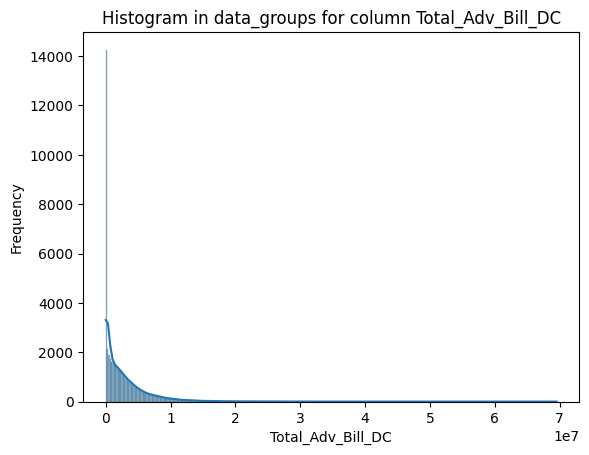

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=685493;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=381189;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

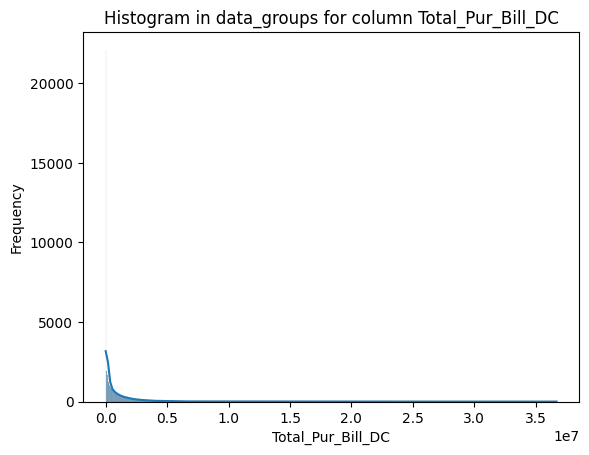

[12/07/24 15:24:09] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=642305;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=882687;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

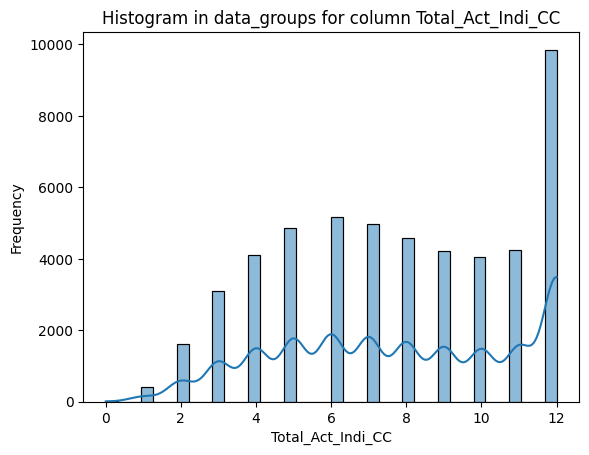

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=587813;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=449719;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

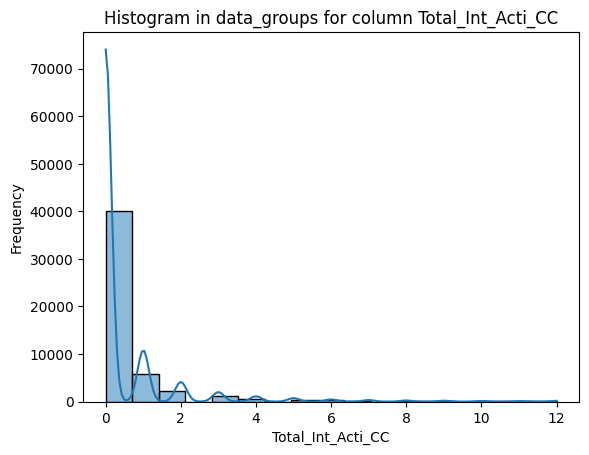

[12/07/24 15:24:10] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=146719;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=597248;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

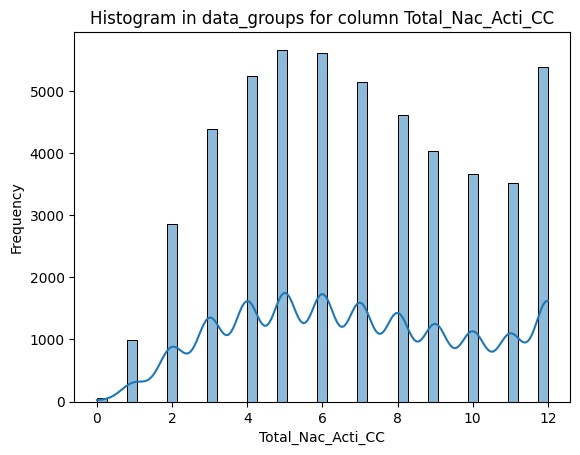

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=84596;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=127919;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

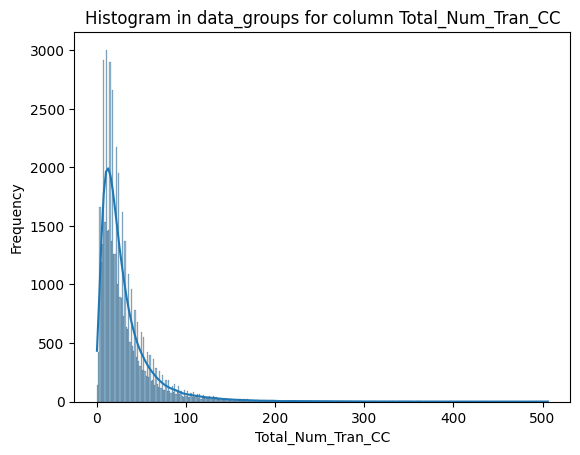

[12/07/24 15:24:11] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=728564;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=976425;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

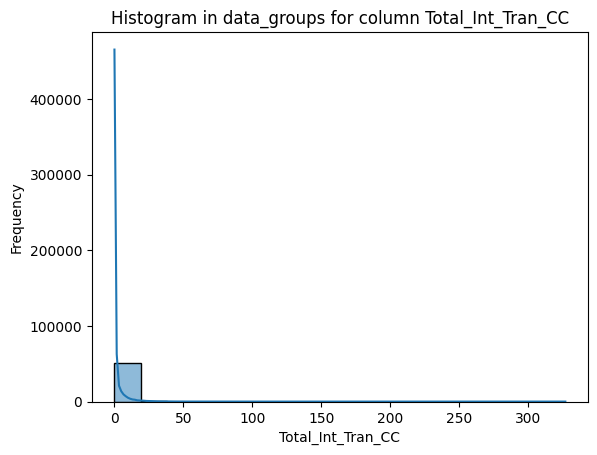

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=665715;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=544899;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

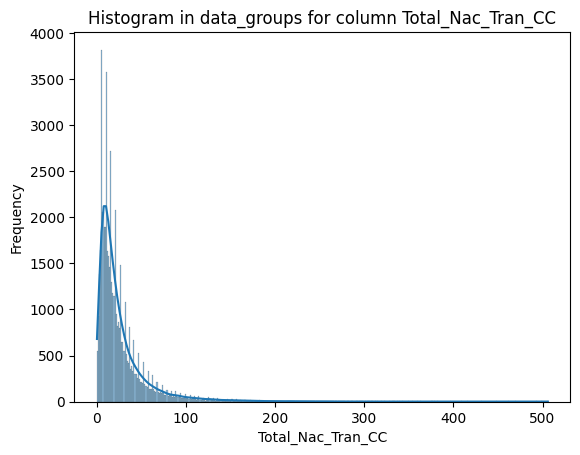

[12/07/24 15:24:12] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=310090;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=782270;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

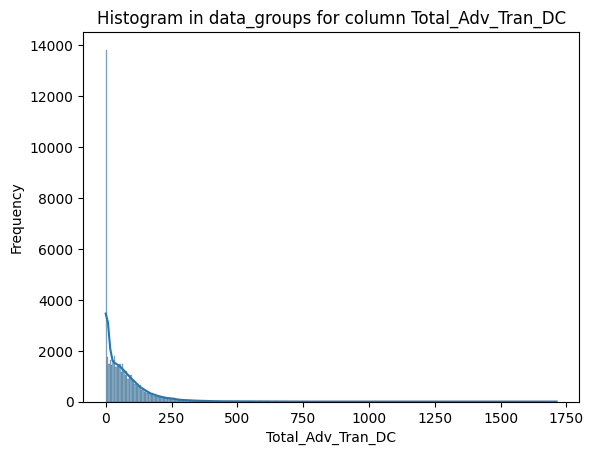

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=43026;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=544655;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

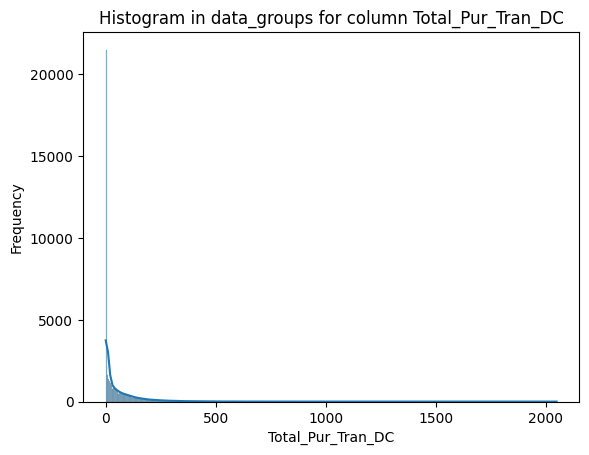

------------------------------------------------------------

----------------------- DataFrame aditional_information -----------------------



[12/07/24 15:24:13] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=50630;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=178655;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

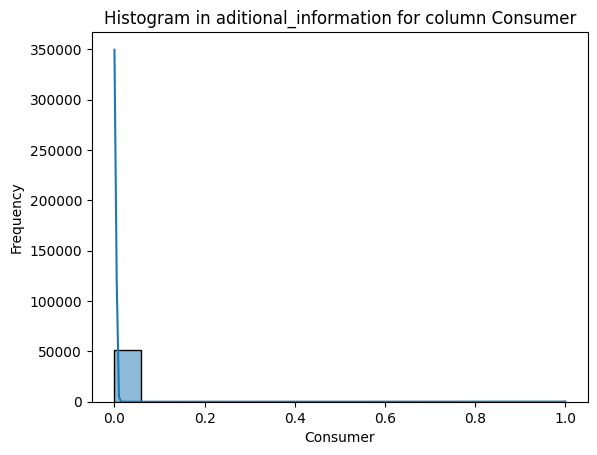

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=538272;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=193849;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

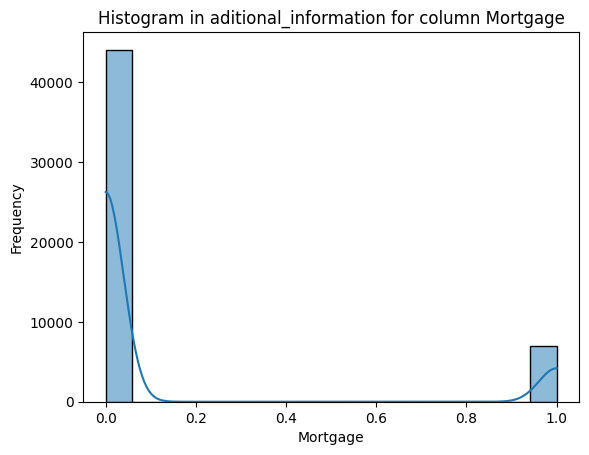

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=90019;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=255905;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

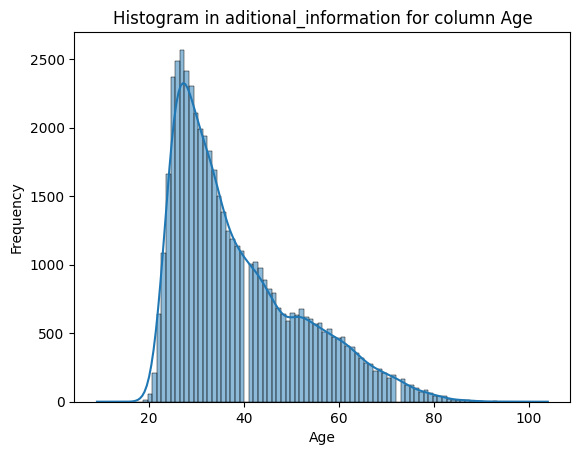

[12/07/24 15:24:14] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=99127;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=177001;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

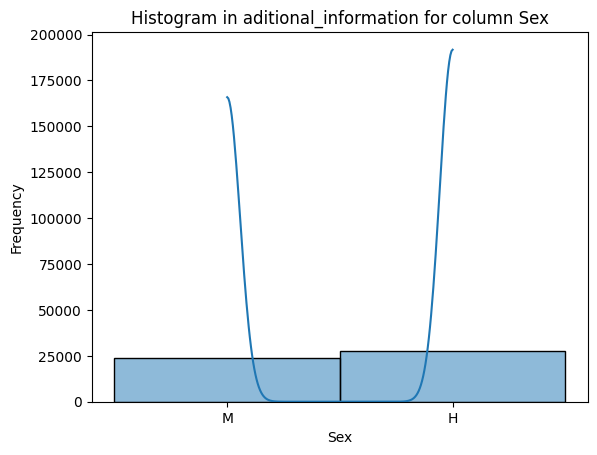

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=581246;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=975752;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

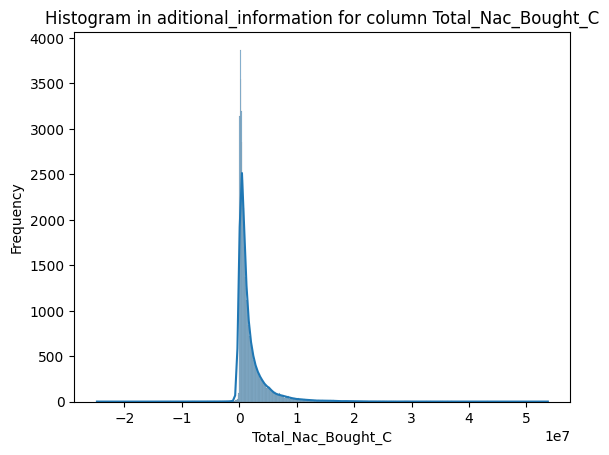

[12/07/24 15:24:15] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=981290;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=644762;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

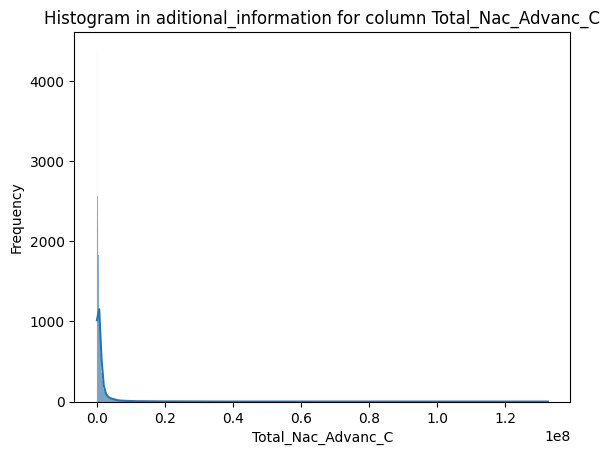

[12/07/24 15:24:18] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=40328;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=20766;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

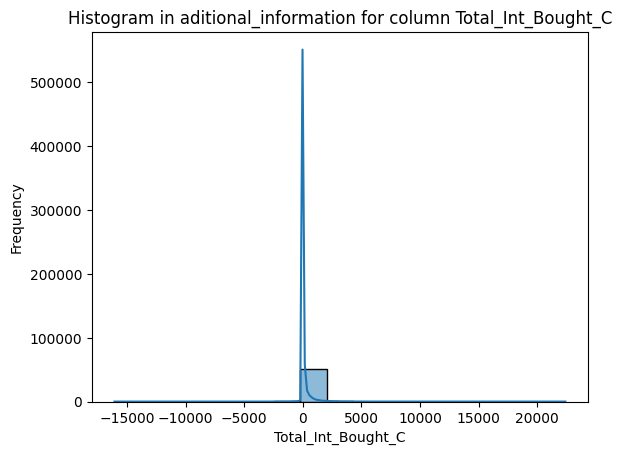

------------------------------------------------------------



In [3]:
dataframes = {
    'client_Data': client_data,
    'client_transactions': client_transactions,
    'merged_data': merged_data,
    'data_groups': data_groups,
    'aditional_information': aditional_information
}

for df in dataframes:
    print(f"----------------------- DataFrame {df} -----------------------\n")
    for column in dataframes[df].columns[1:]:
        sns.histplot(data=dataframes[df], x=column, kde=True)
        plt.title(f'Histogram in {df} for column {column}')
        plt.ylabel('Frequency')
        plt.show()
    print(f"------------------------------------------------------------\n")

In [6]:
IQR_done = pd.DataFrame(client_data[['ID','Sex','Age','Num_CC']])

for columna in client_data.columns[4:]:
        Q1 = client_data[columna].quantile(0.25)
        Q3 = client_data[columna].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # Filter out the outliers for the current column only
        col_limpia = client_data[~((client_data[columna] < lower_bound) | (client_data[columna] > upper_bound))][['ID', columna]]
        # Merge filtered column back into the 'dato' DataFrame on the 'ID' column
        IQR_done = IQR_done.merge(col_limpia, on='ID', how='inner')

IQR_done

,ID,Sex,Age,Num_CC,National,International,Income,Num_Acc,Mon_Act
0,2,1.00,3,1,750000,1000.00,143640.00,1,69
1,3,1.00,3,2,1350000,1500.00,929106.00,1,24
2,6,1.00,3,2,1312500,714.00,707664.00,1,67
3,7,1.00,3,2,813000,600.00,1022833.00,2,21
4,8,1.00,3,3,1242000,1255.00,NaN,2,69
...,...,...,...,...,...,...,...,...,...
44449,51119,0.00,3,2,1020000,1600.00,414316.00,2,23
44450,51120,1.00,3,3,999000,550.00,364978.00,2,57
44451,51121,1.00,3,1,1744200,300.00,625376.00,1,39
44452,51123,0.00,3,1,1612000,2300.00,NaN,1,11


[12/07/24 15:39:16] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=326658;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=412645;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

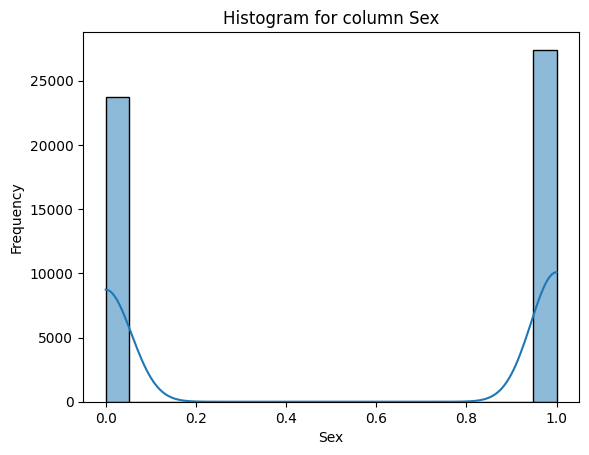

[12/07/24 15:39:17] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=455022;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=765609;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

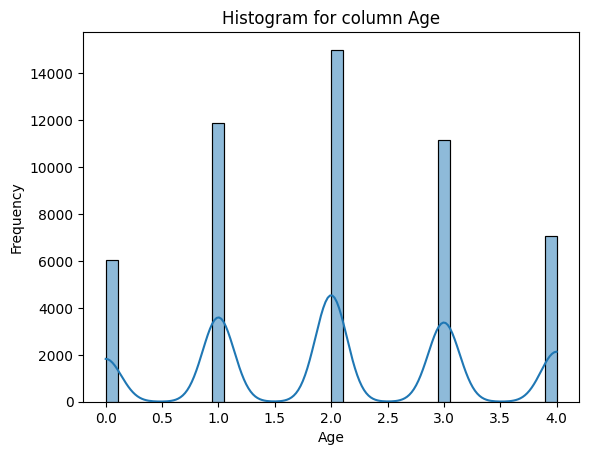

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=632397;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=16320;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

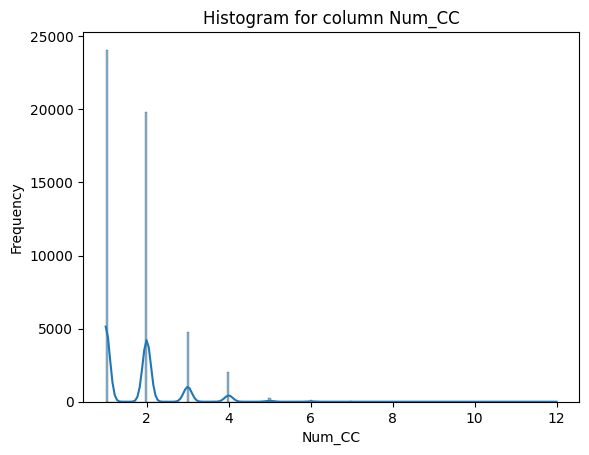

[12/07/24 15:39:18] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=732133;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=496087;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

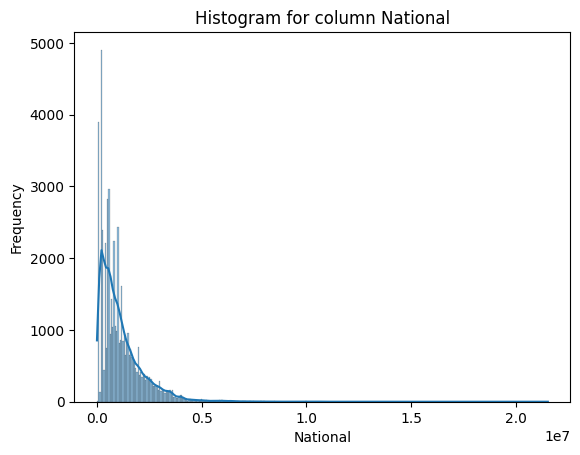

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=65188;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=181610;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

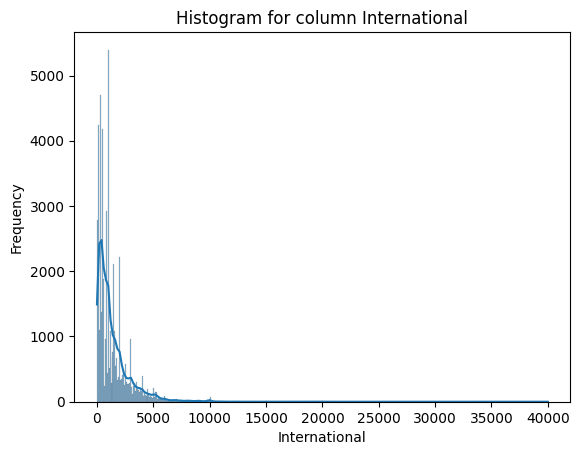

[12/07/24 15:39:19] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=241099;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=822385;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

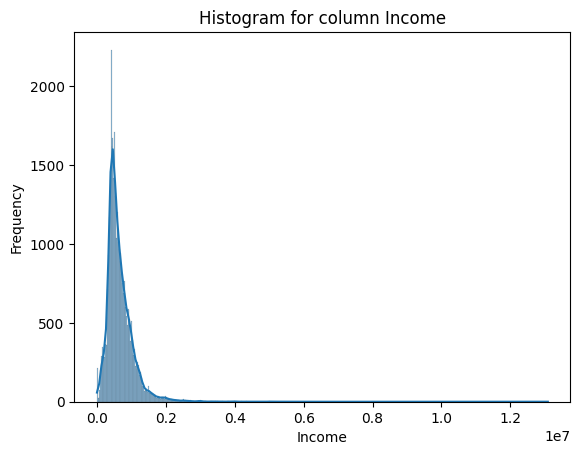

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=773535;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=688770;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

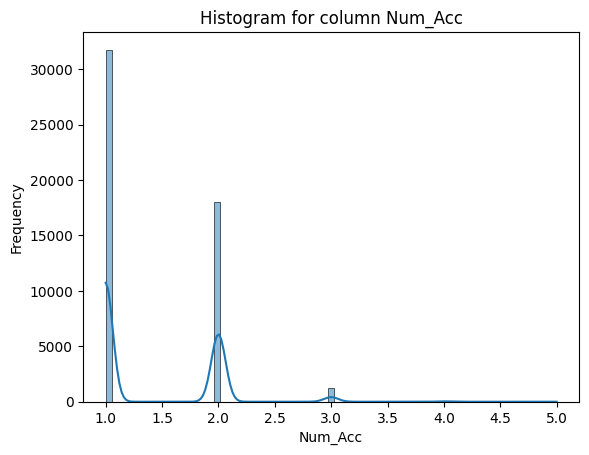

[12/07/24 15:39:20] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=15621;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=26122;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

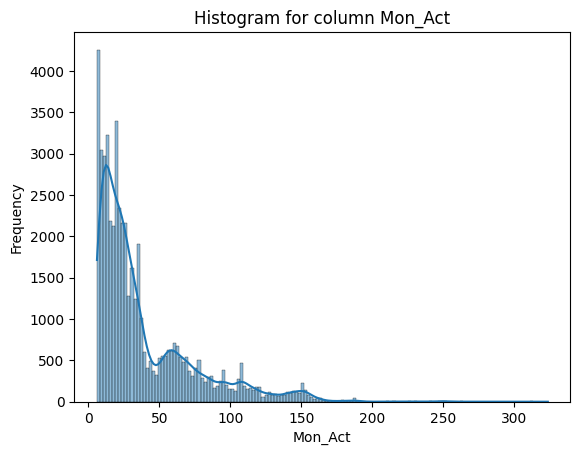

In [7]:
for column in client_data.columns[1:]:
    sns.histplot(data=client_data, x=column, kde=True)
    plt.title(f'Histogram for column {column}')
    plt.ylabel('Frequency')
    plt.show()

[12/07/24 15:39:42] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=372611;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=563176;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

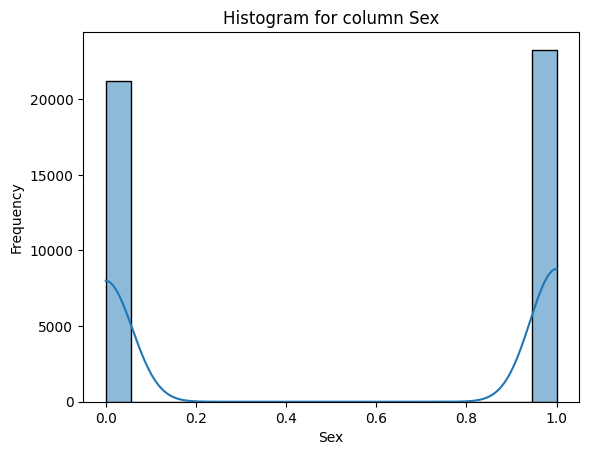

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=993597;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=61003;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

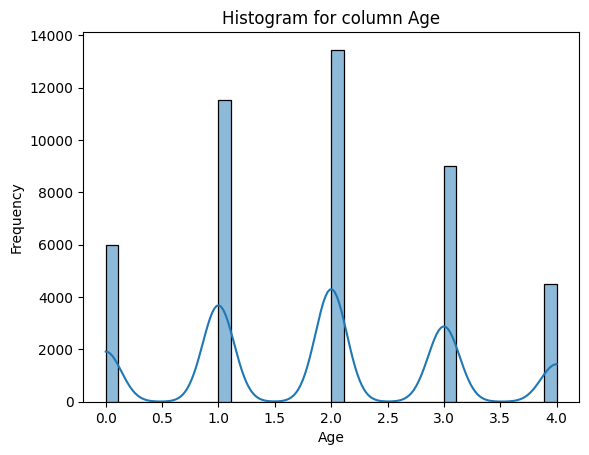

[12/07/24 15:39:43] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=165329;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=80186;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

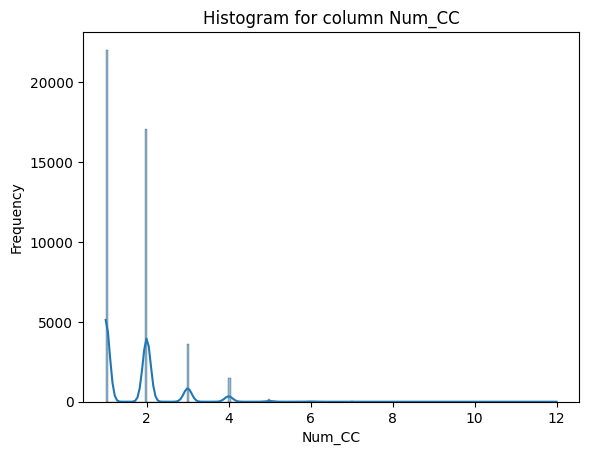

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=402349;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=558934;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

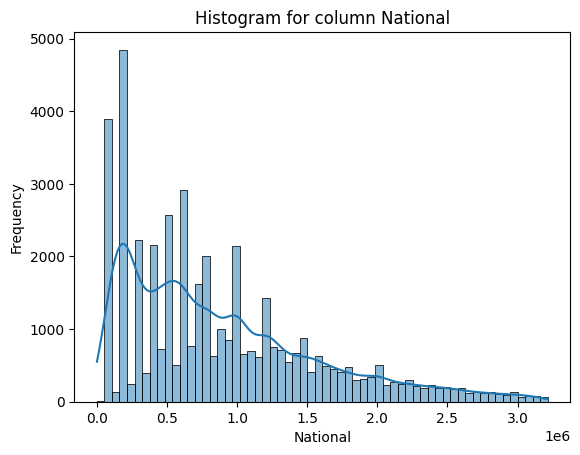

[12/07/24 15:39:44] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=896455;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=721412;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

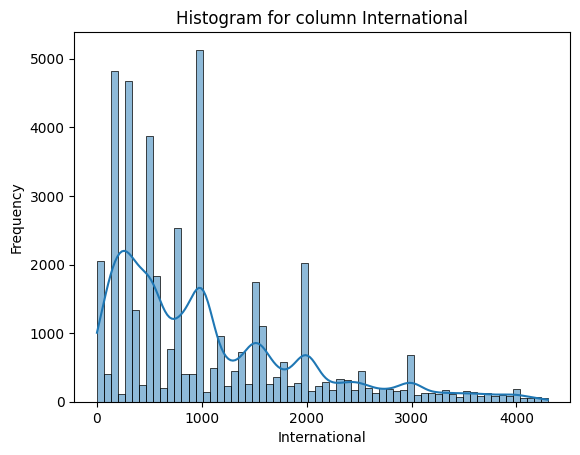

[12/07/24 15:39:45] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=739176;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=516819;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

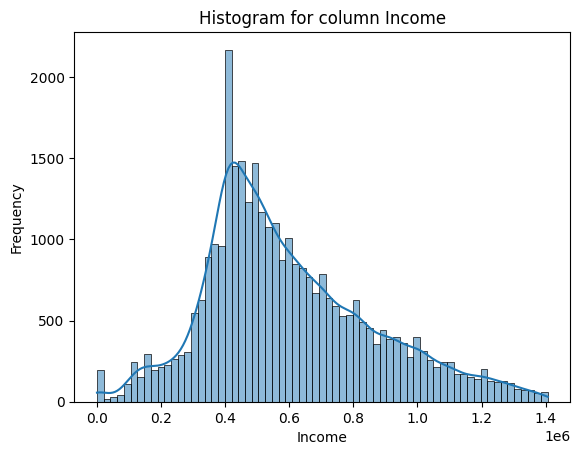

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=841724;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=521561;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

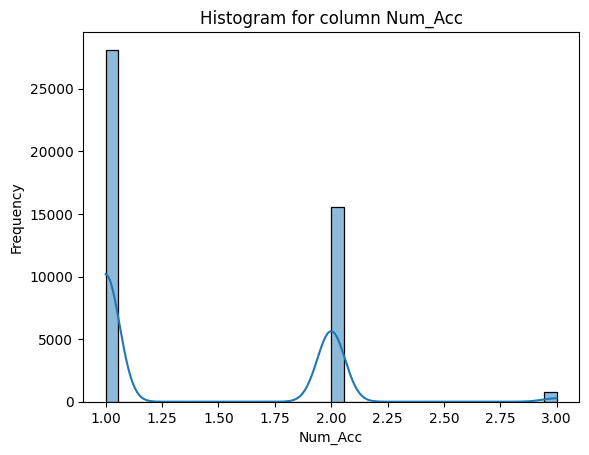

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=40031;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=699235;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

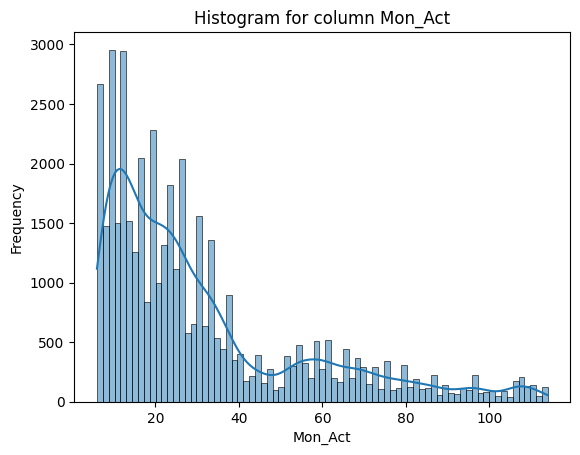

In [8]:
for column in IQR_done.columns[1:]:
    sns.histplot(data=IQR_done, x=column, kde=True)
    plt.title(f'Histogram for column {column}')
    plt.ylabel('Frequency')
    plt.show()

In [53]:
correlations = data_groups.corr()['International'].sort_values(ascending=False)
print(correlations)

International       1.00
National            0.81
Mon_Act             0.40
Age                 0.36
Num_CC              0.33
Num_Acc             0.32
Income              0.28
Total_Nac_Bill_CC   0.22
Total_Pur_Bill_DC   0.19
Total_Int_Bill_CC   0.17
Total_Adv_Bill_DC   0.17
Total_Pur_Tran_DC   0.14
Total_Int_Tran_CC   0.12
Total_Int_Acti_CC   0.12
Total_Adv_Tran_DC   0.12
Total_Act_Indi_CC   0.10
Total_Num_Tran_CC   0.08
ID                  0.07
Sex                 0.05
Total_Nac_Tran_CC   0.04
Total_Nac_Acti_CC   0.01
Name: International, dtype: float64


In [10]:
transformed_data['QuantileTransformer']

,ID,Sex,Age,Num_CC,National,International,Income,Num_Acc,Mon_Act
0,-5.20,5.20,0.82,-5.20,0.05,0.25,-2.02,-5.20,1.27
1,-5.20,5.20,0.82,0.50,0.79,0.65,1.15,-5.20,0.05
2,-5.20,5.20,0.82,0.50,0.75,-0.09,0.57,-5.20,1.22
3,-5.20,5.20,0.82,0.50,0.18,-0.20,1.42,0.88,-0.13
4,-5.20,5.20,0.82,1.41,0.68,0.50,NaN,0.88,1.27
...,...,...,...,...,...,...,...,...,...
44449,5.20,-5.20,0.82,0.50,0.45,0.77,-0.63,0.88,0.00
44450,5.20,5.20,0.82,1.41,0.34,-0.26,-0.99,0.88,0.99
44451,5.20,5.20,0.82,-5.20,1.16,-0.78,0.33,-5.20,0.70
44452,5.20,-5.20,0.82,-5.20,1.05,1.23,NaN,-5.20,-0.92


In [51]:
dat = pd.DataFrame(transformed_data['QuantileTransformer'][['National','International']])

dat = dat.dropna()

entreno, validacion, testeo = np.split(dat.sample(frac=1), [int(0.6*len(dat)), int(0.8*len(dat))])

entreno, X_entreno, y_entreno = scale_dataset(entreno)
validacion, X_validacion, y_validacion = scale_dataset(validacion)
testeo, X_testeo, y_testeo = scale_dataset(testeo)

[12/07/24 16:51:01] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\numpy\_core\fromn ]8;id=766967;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=18869;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             umeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and                   
                             will be removed in a future version. Please use 'DataFrame.transpose'                 
                             instead.                                                                              
                               return bound(*args, **kwds)                                                         
                                                                                                                   

In [52]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
model = XGBRegressor(
    booster='dart',               
    learning_rate=0.2,            
    max_depth=3,                  
    n_estimators=100,             
    objective='reg:squarederror', 
    tree_method='gpu_hist'        
)

model.fit(X_entreno, y_entreno)

y_pred = model.predict(X_validacion)
  # Mean Squared Error
mse = mean_squared_error(y_validacion, y_pred)

  # Mean Absolute Error
mae = mean_absolute_error(y_validacion, y_pred)

  # R^2 Score
r2 = r2_score(y_validacion, y_pred)

  # Root Mean Squared Error
rmse = mean_squared_error(y_validacion, y_pred, squared=False)
  # Print all the metrics
print("----------------------------------------")
print(f"Mean Squared Error: {mse}\n")
print(f"Mean Absolute Error: {mae}\n")
print(f"R^2: {r2}\n")
print(f"Root Mean Squared Error: {rmse}\n")

print(f"Puntaje del modelo: {model.score(X_validacion, y_validacion)}\n")

[12/07/24 16:51:04] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\xgboost\core.py:1 ]8;id=565860;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=67824;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             58: UserWarning: [16:51:04] WARNING:                                                  
                             C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-00                
                             15a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:2                
                             7: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU                   
                             training, set the `device` parameter to CUDA instead.                                 
                                                                                                                   
                                 E.g. tree_method = "hist", device = "cuda"                                        
                                                                                                                   
                               warnings.warn(smsg, UserWarning)                                                    
                                                                                                                   

[12/07/24 16:51:08] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\xgboost\core.py:1 ]8;id=169429;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=868975;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             58: UserWarning: [16:51:08] WARNING:                                                  
                             C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-00                
                             15a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:2                
                             7: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU                   
                             training, set the `device` parameter to CUDA instead.                                 
                                                                                                                   
                                 E.g. tree_method = "hist", device = "cuda"                                        
                                                                                                                   
                               warnings.warn(smsg, UserWarning)                                                    
                                                                                                                   

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\sklearn\metrics\_ ]8;id=114157;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=888078;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             regression.py:492: FutureWarning: 'squared' is deprecated in version                  
                             1.4 and will be removed in 1.6. To calculate the root mean squared                    
                             error, use the function'root_mean_squared_error'.                                     
                               warnings.warn(                                                                      
                                                                                                                   

----------------------------------------
Mean Squared Error: 1.3428041196922276

Mean Absolute Error: 0.5780105320052962

R^2: 0.2826199024757925

Root Mean Squared Error: 1.15879425252813

Puntaje del modelo: 0.2826199024757925



[12/07/24 16:24:15] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=825561;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=444769;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

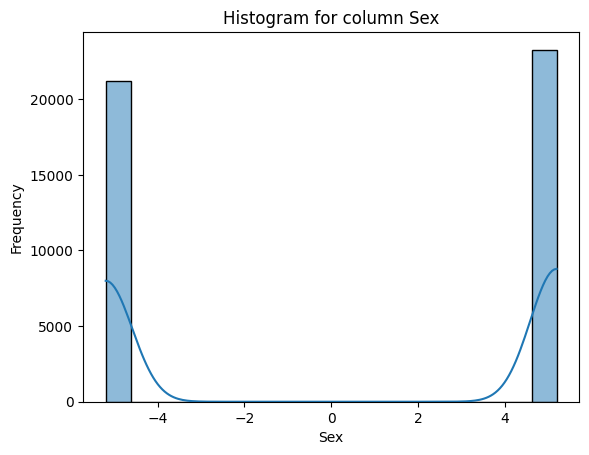

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=114989;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=809388;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

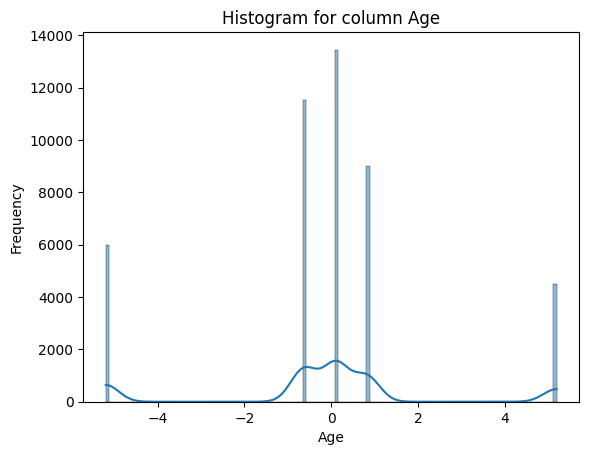

[12/07/24 16:24:16] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=415034;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=764474;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

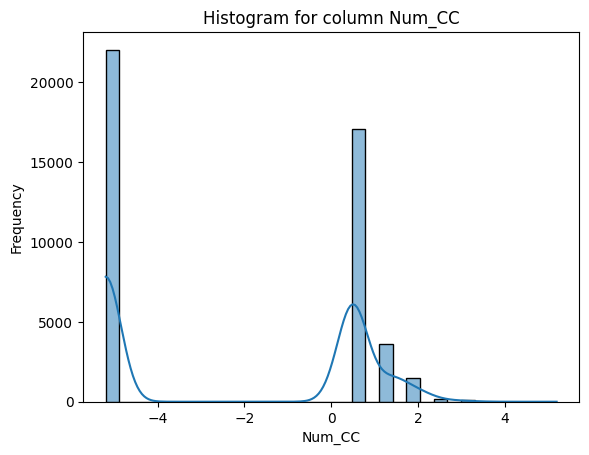

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=411791;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=752989;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

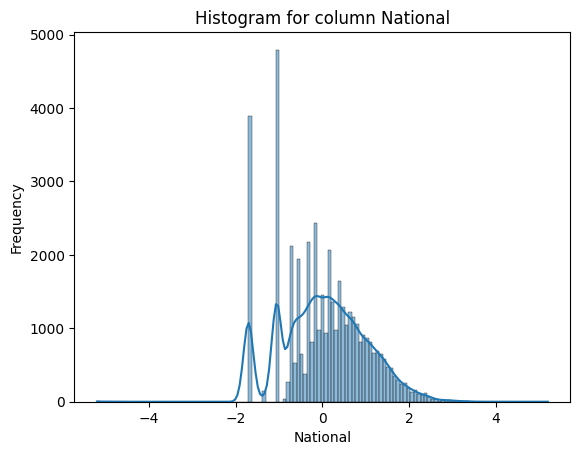

[12/07/24 16:24:17] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=176659;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=284747;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

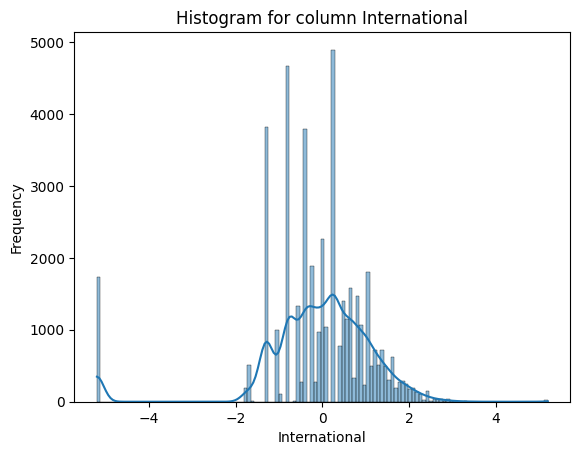

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=21460;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=814391;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

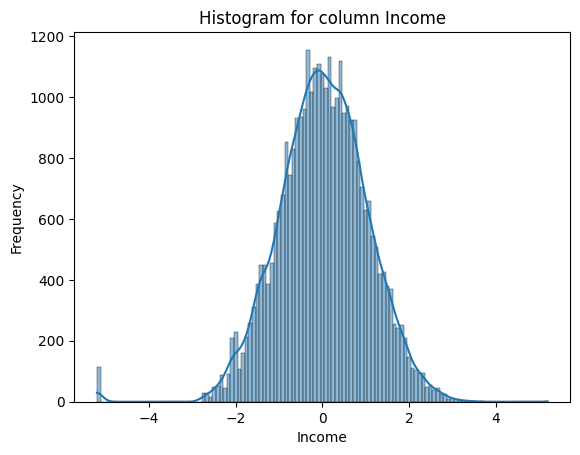

                    WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=558037;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=975479;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

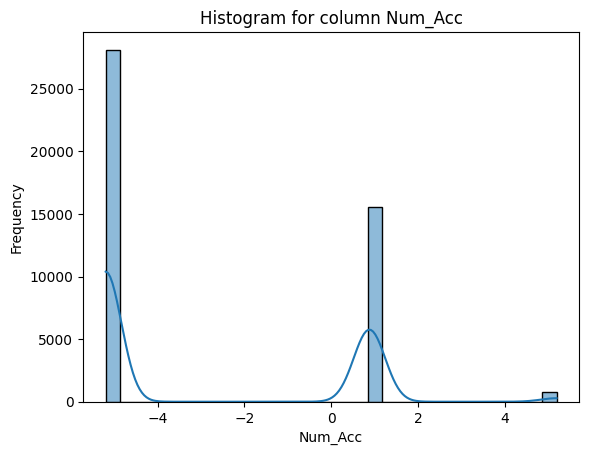

[12/07/24 16:24:18] WARNING  C:\Users\crist\desktop\kedro\.venv\Lib\site-packages\seaborn\_oldcore. ]8;id=425917;file://C:\Python311\Lib\warnings.py\warnings.py]8;;\:]8;id=264871;file://C:\Python311\Lib\warnings.py#109\109]8;;\
                             py:1119: FutureWarning: use_inf_as_na option is deprecated and will be                
                             removed in a future version. Convert inf values to NaN before                         
                             operating instead.                                                                    
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

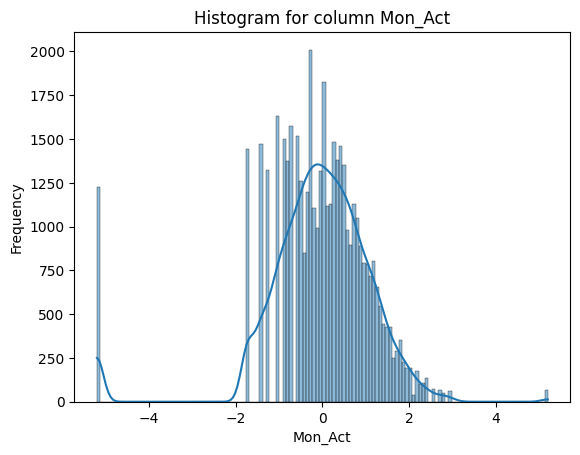

In [11]:
for column in transformed_data['QuantileTransformer'].columns[1:]:
    sns.histplot(data=transformed_data['QuantileTransformer'], x=column, kde=True)
    plt.title(f'Histogram for column {column}')
    plt.ylabel('Frequency')
    plt.show()